# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:12<00:00, 4.90KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

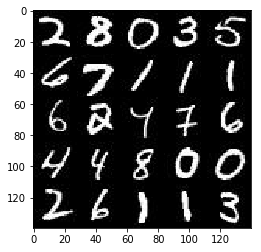

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

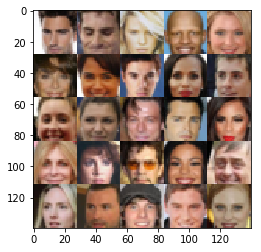

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name = "real_inputs")
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name = "z_inputs")
    learning_rate = tf.placeholder(tf.float32, name = "learning_rate")
    
    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/local/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/local/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'F

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    keep_prob = 0.8
    alpha = 0.3
    
    with tf.variable_scope("discriminator", reuse = reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides = 2, padding = "SAME", kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.maximum(alpha * x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob)

        x2 = tf.layers.conv2d(x1, 128, 5, strides = 2, padding = "SAME", kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training = True)
        x2 = tf.maximum(alpha * x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob)
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides = 2, padding = "SAME", kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training = True)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob)
        
        flat = tf.reshape(x3, (-1, 4* 4* 256))
        logits = tf.layers.dense(flat, 1, kernel_initializer=tf.contrib.layers.xavier_initializer())
        logits = tf.nn.dropout(logits, keep_prob)
        output = tf.sigmoid(logits)
        
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha = 0.3
    keep_prob = 0.5
    with tf.variable_scope("generator", reuse = not is_train):
        x1 = tf.layers.dense(z, 2 * 2 * 512)
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        x1 = tf.maximum(alpha * x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides = 2, padding = "VALID")
        x2 = tf.layers.batch_normalization(x2, training = is_train)
        x2 = tf.maximum(alpha * x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob)

        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides = 2, padding = "SAME")
        x3 = tf.layers.batch_normalization(x3, training = is_train)
        x3 = tf.maximum(alpha * x3, x3)        
        x3 = tf.nn.dropout(x3, keep_prob)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides = 2, padding = "SAME")
        output = tf.tanh(logits)
        
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse = True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_real, labels = tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.ones_like(d_model_fake) * 0.9))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list = d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [14]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    if(data_image_mode == "L"):
        out_channel_dim = 1
    else:
        out_channel_dim = 3
    
    batches, img_width, img_height, img_depth = data_shape
    input_real, input_z, lr = model_inputs(img_width, img_height, img_depth, z_dim)
    
    d_loss, g_loss = model_loss(input_real, input_z, img_depth)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print_every = 10
    show_every = 100
    losses = []
    num_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images *= 2.0
                batch_z = np.random.uniform(-1, 1, (batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict = {input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict = {input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict = {input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                if steps%print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                
                if steps%show_every == 0:
                    show_generator_output(sess, num_images, input_z, img_depth, data_image_mode)        

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/5... Discriminator Loss: 3.1325... Generator Loss: 0.4632
Epoch 1/5... Discriminator Loss: 2.4425... Generator Loss: 0.4357
Epoch 1/5... Discriminator Loss: 2.0789... Generator Loss: 0.5501
Epoch 1/5... Discriminator Loss: 2.4789... Generator Loss: 0.5417
Epoch 1/5... Discriminator Loss: 1.3451... Generator Loss: 1.1364
Epoch 1/5... Discriminator Loss: 1.5238... Generator Loss: 0.7561
Epoch 1/5... Discriminator Loss: 2.0583... Generator Loss: 0.5986
Epoch 1/5... Discriminator Loss: 1.6008... Generator Loss: 0.8135
Epoch 1/5... Discriminator Loss: 1.6085... Generator Loss: 0.5963
Epoch 1/5... Discriminator Loss: 1.8848... Generator Loss: 1.1945


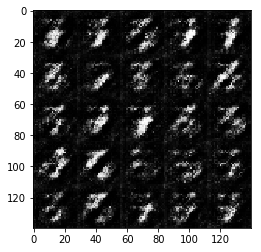

Epoch 1/5... Discriminator Loss: 1.8152... Generator Loss: 1.1816
Epoch 1/5... Discriminator Loss: 1.7456... Generator Loss: 0.7826
Epoch 1/5... Discriminator Loss: 1.0871... Generator Loss: 1.4259
Epoch 1/5... Discriminator Loss: 1.0717... Generator Loss: 1.6354
Epoch 1/5... Discriminator Loss: 1.1210... Generator Loss: 1.2430
Epoch 1/5... Discriminator Loss: 1.4000... Generator Loss: 0.9158
Epoch 1/5... Discriminator Loss: 1.4496... Generator Loss: 1.7171
Epoch 1/5... Discriminator Loss: 1.0912... Generator Loss: 1.2496
Epoch 1/5... Discriminator Loss: 1.4538... Generator Loss: 1.0268
Epoch 1/5... Discriminator Loss: 1.3916... Generator Loss: 1.3541


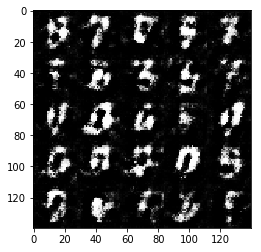

Epoch 1/5... Discriminator Loss: 1.5341... Generator Loss: 0.7705
Epoch 1/5... Discriminator Loss: 1.4262... Generator Loss: 1.6787
Epoch 1/5... Discriminator Loss: 1.2739... Generator Loss: 1.3514
Epoch 1/5... Discriminator Loss: 1.2192... Generator Loss: 1.6895
Epoch 1/5... Discriminator Loss: 1.6142... Generator Loss: 0.6219
Epoch 1/5... Discriminator Loss: 1.4403... Generator Loss: 0.7260
Epoch 1/5... Discriminator Loss: 1.8204... Generator Loss: 0.5348
Epoch 1/5... Discriminator Loss: 1.4663... Generator Loss: 0.7915
Epoch 1/5... Discriminator Loss: 1.0692... Generator Loss: 1.4382
Epoch 1/5... Discriminator Loss: 1.3612... Generator Loss: 0.8201


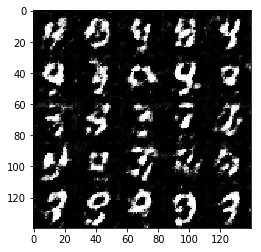

Epoch 1/5... Discriminator Loss: 1.2396... Generator Loss: 0.8683
Epoch 1/5... Discriminator Loss: 1.4284... Generator Loss: 0.7339
Epoch 1/5... Discriminator Loss: 1.2216... Generator Loss: 1.1706
Epoch 1/5... Discriminator Loss: 1.3088... Generator Loss: 0.8274
Epoch 1/5... Discriminator Loss: 1.5975... Generator Loss: 1.4815
Epoch 1/5... Discriminator Loss: 1.2681... Generator Loss: 0.7330
Epoch 1/5... Discriminator Loss: 1.1805... Generator Loss: 1.0815
Epoch 1/5... Discriminator Loss: 1.4635... Generator Loss: 1.4774
Epoch 1/5... Discriminator Loss: 1.3888... Generator Loss: 1.3198
Epoch 1/5... Discriminator Loss: 1.1422... Generator Loss: 1.0630


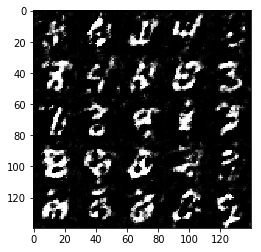

Epoch 1/5... Discriminator Loss: 1.3569... Generator Loss: 0.8137
Epoch 1/5... Discriminator Loss: 1.1903... Generator Loss: 1.1885
Epoch 1/5... Discriminator Loss: 1.2796... Generator Loss: 0.9722
Epoch 1/5... Discriminator Loss: 1.3171... Generator Loss: 0.8748
Epoch 1/5... Discriminator Loss: 1.3779... Generator Loss: 0.9347
Epoch 1/5... Discriminator Loss: 1.4693... Generator Loss: 0.9798
Epoch 1/5... Discriminator Loss: 1.4297... Generator Loss: 0.7744
Epoch 1/5... Discriminator Loss: 1.2490... Generator Loss: 1.5321
Epoch 1/5... Discriminator Loss: 1.3352... Generator Loss: 0.8136
Epoch 1/5... Discriminator Loss: 1.4492... Generator Loss: 0.5516


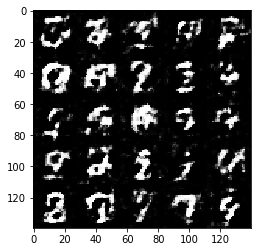

Epoch 1/5... Discriminator Loss: 1.1189... Generator Loss: 1.1706
Epoch 1/5... Discriminator Loss: 1.1384... Generator Loss: 0.9046
Epoch 1/5... Discriminator Loss: 1.6104... Generator Loss: 1.9145
Epoch 1/5... Discriminator Loss: 1.2453... Generator Loss: 1.0343
Epoch 1/5... Discriminator Loss: 1.1917... Generator Loss: 1.2151
Epoch 1/5... Discriminator Loss: 1.3021... Generator Loss: 0.9010
Epoch 1/5... Discriminator Loss: 1.1982... Generator Loss: 1.0137
Epoch 1/5... Discriminator Loss: 1.1860... Generator Loss: 1.2259
Epoch 1/5... Discriminator Loss: 1.0330... Generator Loss: 1.0322
Epoch 1/5... Discriminator Loss: 1.5476... Generator Loss: 0.7584


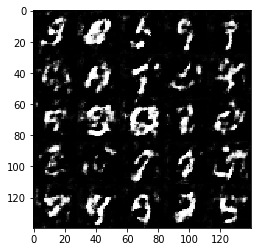

Epoch 1/5... Discriminator Loss: 1.1977... Generator Loss: 0.8426
Epoch 1/5... Discriminator Loss: 1.1480... Generator Loss: 0.7031
Epoch 1/5... Discriminator Loss: 1.2802... Generator Loss: 1.0689
Epoch 1/5... Discriminator Loss: 1.1574... Generator Loss: 1.0179
Epoch 1/5... Discriminator Loss: 0.9867... Generator Loss: 1.1304
Epoch 1/5... Discriminator Loss: 1.2939... Generator Loss: 0.9276
Epoch 1/5... Discriminator Loss: 1.1641... Generator Loss: 1.2643
Epoch 1/5... Discriminator Loss: 1.1897... Generator Loss: 0.9723
Epoch 1/5... Discriminator Loss: 1.2227... Generator Loss: 1.0121
Epoch 1/5... Discriminator Loss: 1.4250... Generator Loss: 1.9670


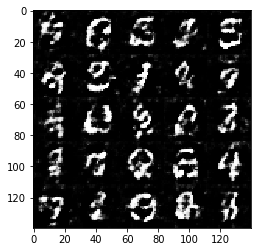

Epoch 1/5... Discriminator Loss: 1.1741... Generator Loss: 1.2219
Epoch 1/5... Discriminator Loss: 1.0566... Generator Loss: 1.0376
Epoch 1/5... Discriminator Loss: 1.1794... Generator Loss: 0.9112
Epoch 1/5... Discriminator Loss: 1.1398... Generator Loss: 1.9341
Epoch 1/5... Discriminator Loss: 1.0397... Generator Loss: 1.1491
Epoch 1/5... Discriminator Loss: 1.4234... Generator Loss: 0.7200
Epoch 1/5... Discriminator Loss: 1.0363... Generator Loss: 1.4731
Epoch 1/5... Discriminator Loss: 1.2276... Generator Loss: 1.2856
Epoch 1/5... Discriminator Loss: 1.1285... Generator Loss: 1.3204
Epoch 1/5... Discriminator Loss: 1.1498... Generator Loss: 1.1794


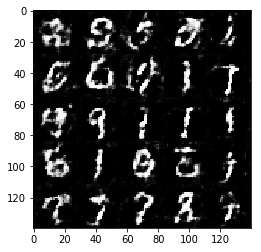

Epoch 1/5... Discriminator Loss: 1.2794... Generator Loss: 0.7581
Epoch 1/5... Discriminator Loss: 1.3247... Generator Loss: 1.0884
Epoch 1/5... Discriminator Loss: 1.1640... Generator Loss: 1.0154
Epoch 1/5... Discriminator Loss: 1.4331... Generator Loss: 0.6389
Epoch 1/5... Discriminator Loss: 1.1258... Generator Loss: 1.0097
Epoch 1/5... Discriminator Loss: 1.2464... Generator Loss: 0.9662
Epoch 1/5... Discriminator Loss: 1.3501... Generator Loss: 0.7154
Epoch 1/5... Discriminator Loss: 1.3456... Generator Loss: 1.4808
Epoch 1/5... Discriminator Loss: 1.0955... Generator Loss: 1.2074
Epoch 1/5... Discriminator Loss: 1.0572... Generator Loss: 0.8829


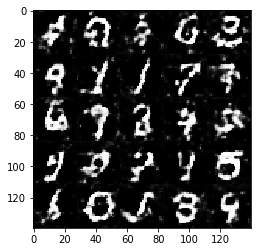

Epoch 1/5... Discriminator Loss: 1.2079... Generator Loss: 2.4270
Epoch 1/5... Discriminator Loss: 1.2042... Generator Loss: 0.7273
Epoch 1/5... Discriminator Loss: 1.3381... Generator Loss: 0.8053
Epoch 1/5... Discriminator Loss: 1.1275... Generator Loss: 1.4474
Epoch 1/5... Discriminator Loss: 1.0495... Generator Loss: 1.1839
Epoch 1/5... Discriminator Loss: 1.2537... Generator Loss: 0.5899
Epoch 1/5... Discriminator Loss: 0.9088... Generator Loss: 1.3840
Epoch 1/5... Discriminator Loss: 1.1884... Generator Loss: 1.8805
Epoch 1/5... Discriminator Loss: 0.9998... Generator Loss: 1.2158
Epoch 1/5... Discriminator Loss: 0.9779... Generator Loss: 1.0929


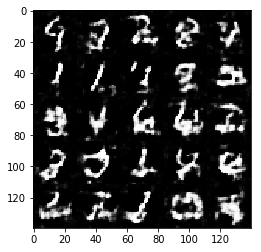

Epoch 1/5... Discriminator Loss: 1.1501... Generator Loss: 1.2728
Epoch 1/5... Discriminator Loss: 1.1654... Generator Loss: 0.9269
Epoch 1/5... Discriminator Loss: 1.2040... Generator Loss: 1.1685
Epoch 1/5... Discriminator Loss: 1.2487... Generator Loss: 0.7404
Epoch 1/5... Discriminator Loss: 1.1427... Generator Loss: 1.0680
Epoch 1/5... Discriminator Loss: 0.9881... Generator Loss: 1.5265
Epoch 1/5... Discriminator Loss: 1.2385... Generator Loss: 1.5346
Epoch 1/5... Discriminator Loss: 1.2555... Generator Loss: 0.9351
Epoch 1/5... Discriminator Loss: 1.0345... Generator Loss: 0.8848
Epoch 1/5... Discriminator Loss: 1.7887... Generator Loss: 0.6809


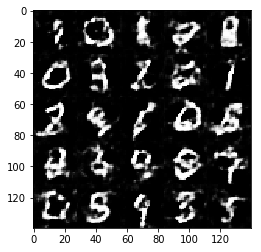

Epoch 1/5... Discriminator Loss: 1.2411... Generator Loss: 1.0314
Epoch 1/5... Discriminator Loss: 1.1940... Generator Loss: 1.2388
Epoch 1/5... Discriminator Loss: 1.6658... Generator Loss: 0.7202
Epoch 1/5... Discriminator Loss: 1.5434... Generator Loss: 0.7669
Epoch 1/5... Discriminator Loss: 1.1597... Generator Loss: 1.1323
Epoch 1/5... Discriminator Loss: 1.1529... Generator Loss: 1.4567
Epoch 1/5... Discriminator Loss: 1.1931... Generator Loss: 1.3358
Epoch 1/5... Discriminator Loss: 1.2422... Generator Loss: 0.7382
Epoch 1/5... Discriminator Loss: 1.1746... Generator Loss: 0.8263
Epoch 1/5... Discriminator Loss: 1.1919... Generator Loss: 0.9973


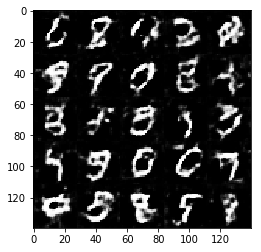

Epoch 1/5... Discriminator Loss: 1.1757... Generator Loss: 1.0890
Epoch 1/5... Discriminator Loss: 1.1349... Generator Loss: 0.9474
Epoch 1/5... Discriminator Loss: 1.1805... Generator Loss: 0.7880
Epoch 1/5... Discriminator Loss: 1.4370... Generator Loss: 1.3182
Epoch 1/5... Discriminator Loss: 0.9978... Generator Loss: 1.1551
Epoch 1/5... Discriminator Loss: 1.0393... Generator Loss: 1.0224
Epoch 1/5... Discriminator Loss: 0.9902... Generator Loss: 1.2491
Epoch 1/5... Discriminator Loss: 1.1405... Generator Loss: 0.7319
Epoch 1/5... Discriminator Loss: 1.3242... Generator Loss: 1.8108
Epoch 1/5... Discriminator Loss: 1.0865... Generator Loss: 1.4133


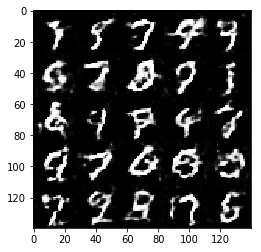

Epoch 1/5... Discriminator Loss: 1.3254... Generator Loss: 0.6905
Epoch 1/5... Discriminator Loss: 1.1496... Generator Loss: 1.6038
Epoch 1/5... Discriminator Loss: 1.0401... Generator Loss: 1.2521
Epoch 1/5... Discriminator Loss: 1.2275... Generator Loss: 0.7259
Epoch 1/5... Discriminator Loss: 1.0407... Generator Loss: 1.0098
Epoch 1/5... Discriminator Loss: 1.3034... Generator Loss: 1.4822
Epoch 1/5... Discriminator Loss: 1.2688... Generator Loss: 0.9998
Epoch 1/5... Discriminator Loss: 1.0894... Generator Loss: 1.4243
Epoch 1/5... Discriminator Loss: 1.2113... Generator Loss: 0.9779
Epoch 1/5... Discriminator Loss: 1.2067... Generator Loss: 1.1727


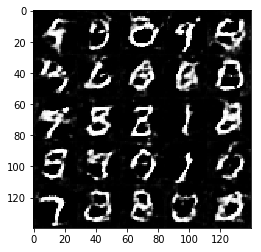

Epoch 1/5... Discriminator Loss: 1.1081... Generator Loss: 1.0964
Epoch 1/5... Discriminator Loss: 1.0529... Generator Loss: 1.4400
Epoch 1/5... Discriminator Loss: 1.0313... Generator Loss: 1.7924
Epoch 1/5... Discriminator Loss: 1.1323... Generator Loss: 1.2552
Epoch 1/5... Discriminator Loss: 1.2277... Generator Loss: 0.8534
Epoch 1/5... Discriminator Loss: 1.2304... Generator Loss: 1.1873
Epoch 1/5... Discriminator Loss: 1.1511... Generator Loss: 0.8873
Epoch 1/5... Discriminator Loss: 1.0325... Generator Loss: 1.5395
Epoch 1/5... Discriminator Loss: 1.1071... Generator Loss: 0.9035
Epoch 1/5... Discriminator Loss: 0.9990... Generator Loss: 0.9512


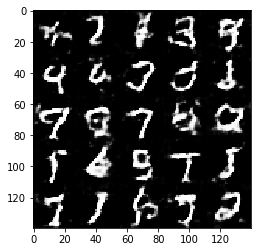

Epoch 1/5... Discriminator Loss: 1.2319... Generator Loss: 1.2320
Epoch 1/5... Discriminator Loss: 1.0525... Generator Loss: 1.0351
Epoch 1/5... Discriminator Loss: 1.1410... Generator Loss: 0.8870
Epoch 1/5... Discriminator Loss: 0.9106... Generator Loss: 1.1668
Epoch 1/5... Discriminator Loss: 1.2294... Generator Loss: 0.8703
Epoch 1/5... Discriminator Loss: 1.0858... Generator Loss: 1.1808
Epoch 1/5... Discriminator Loss: 0.9969... Generator Loss: 1.0740
Epoch 1/5... Discriminator Loss: 1.0675... Generator Loss: 1.0400
Epoch 1/5... Discriminator Loss: 1.1924... Generator Loss: 1.7596
Epoch 1/5... Discriminator Loss: 1.0960... Generator Loss: 1.2404


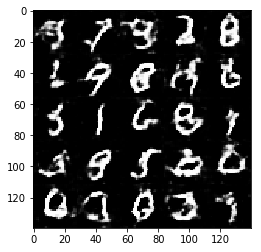

Epoch 1/5... Discriminator Loss: 1.1842... Generator Loss: 1.0083
Epoch 1/5... Discriminator Loss: 1.0628... Generator Loss: 1.1262
Epoch 1/5... Discriminator Loss: 1.2005... Generator Loss: 1.2126
Epoch 1/5... Discriminator Loss: 1.2653... Generator Loss: 1.7960
Epoch 1/5... Discriminator Loss: 1.3424... Generator Loss: 0.8791
Epoch 1/5... Discriminator Loss: 1.3588... Generator Loss: 1.7727
Epoch 1/5... Discriminator Loss: 1.3949... Generator Loss: 0.6050
Epoch 1/5... Discriminator Loss: 1.3512... Generator Loss: 0.6398
Epoch 1/5... Discriminator Loss: 1.4275... Generator Loss: 1.6814
Epoch 1/5... Discriminator Loss: 1.1289... Generator Loss: 1.1284


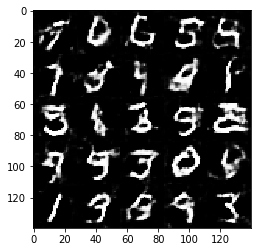

Epoch 1/5... Discriminator Loss: 1.1082... Generator Loss: 1.0686
Epoch 1/5... Discriminator Loss: 1.0999... Generator Loss: 1.0226
Epoch 1/5... Discriminator Loss: 1.0652... Generator Loss: 1.6203
Epoch 1/5... Discriminator Loss: 1.0577... Generator Loss: 1.1280
Epoch 1/5... Discriminator Loss: 1.1371... Generator Loss: 0.8363
Epoch 1/5... Discriminator Loss: 1.0185... Generator Loss: 1.4478
Epoch 1/5... Discriminator Loss: 1.1473... Generator Loss: 1.4235
Epoch 1/5... Discriminator Loss: 1.1849... Generator Loss: 1.9316
Epoch 1/5... Discriminator Loss: 1.0374... Generator Loss: 1.1409
Epoch 1/5... Discriminator Loss: 1.0375... Generator Loss: 1.1274


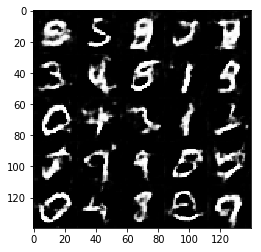

Epoch 1/5... Discriminator Loss: 1.2341... Generator Loss: 0.9825
Epoch 1/5... Discriminator Loss: 1.1944... Generator Loss: 0.7868
Epoch 1/5... Discriminator Loss: 1.2599... Generator Loss: 0.8780
Epoch 1/5... Discriminator Loss: 0.9646... Generator Loss: 1.4467
Epoch 1/5... Discriminator Loss: 0.9712... Generator Loss: 1.0978
Epoch 1/5... Discriminator Loss: 1.0354... Generator Loss: 1.0854
Epoch 1/5... Discriminator Loss: 1.2546... Generator Loss: 1.6631
Epoch 2/5... Discriminator Loss: 0.9747... Generator Loss: 1.1063
Epoch 2/5... Discriminator Loss: 1.5301... Generator Loss: 0.7997
Epoch 2/5... Discriminator Loss: 0.8831... Generator Loss: 1.1729


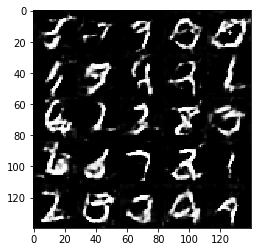

Epoch 2/5... Discriminator Loss: 1.7213... Generator Loss: 2.4005
Epoch 2/5... Discriminator Loss: 1.0929... Generator Loss: 1.9188
Epoch 2/5... Discriminator Loss: 1.0645... Generator Loss: 0.8334
Epoch 2/5... Discriminator Loss: 1.1187... Generator Loss: 1.0020
Epoch 2/5... Discriminator Loss: 1.1733... Generator Loss: 1.1570
Epoch 2/5... Discriminator Loss: 1.0187... Generator Loss: 0.9013
Epoch 2/5... Discriminator Loss: 1.0956... Generator Loss: 0.7668
Epoch 2/5... Discriminator Loss: 1.0326... Generator Loss: 1.0546
Epoch 2/5... Discriminator Loss: 1.4449... Generator Loss: 1.9986
Epoch 2/5... Discriminator Loss: 1.0391... Generator Loss: 1.2313


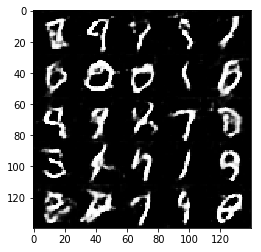

Epoch 2/5... Discriminator Loss: 1.0239... Generator Loss: 1.8463
Epoch 2/5... Discriminator Loss: 0.9692... Generator Loss: 1.2174
Epoch 2/5... Discriminator Loss: 1.0705... Generator Loss: 1.3365
Epoch 2/5... Discriminator Loss: 0.9532... Generator Loss: 1.3811
Epoch 2/5... Discriminator Loss: 1.2575... Generator Loss: 1.4980
Epoch 2/5... Discriminator Loss: 1.1021... Generator Loss: 1.5217
Epoch 2/5... Discriminator Loss: 1.0790... Generator Loss: 1.1044
Epoch 2/5... Discriminator Loss: 0.9684... Generator Loss: 1.4888
Epoch 2/5... Discriminator Loss: 1.0617... Generator Loss: 1.2863
Epoch 2/5... Discriminator Loss: 1.2215... Generator Loss: 1.3532


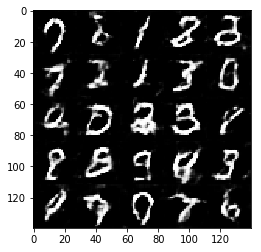

Epoch 2/5... Discriminator Loss: 1.3621... Generator Loss: 0.6514
Epoch 2/5... Discriminator Loss: 1.0525... Generator Loss: 1.2043
Epoch 2/5... Discriminator Loss: 1.3980... Generator Loss: 1.8289
Epoch 2/5... Discriminator Loss: 1.0629... Generator Loss: 1.6610
Epoch 2/5... Discriminator Loss: 1.1847... Generator Loss: 1.1017
Epoch 2/5... Discriminator Loss: 0.9630... Generator Loss: 0.9846
Epoch 2/5... Discriminator Loss: 1.1967... Generator Loss: 0.6808
Epoch 2/5... Discriminator Loss: 0.9153... Generator Loss: 1.6042
Epoch 2/5... Discriminator Loss: 1.0340... Generator Loss: 0.9096
Epoch 2/5... Discriminator Loss: 1.0708... Generator Loss: 1.2680


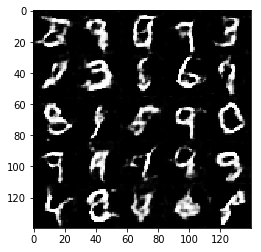

Epoch 2/5... Discriminator Loss: 1.2520... Generator Loss: 1.2398
Epoch 2/5... Discriminator Loss: 1.0442... Generator Loss: 0.9081
Epoch 2/5... Discriminator Loss: 1.0519... Generator Loss: 1.1719
Epoch 2/5... Discriminator Loss: 0.9815... Generator Loss: 0.9471
Epoch 2/5... Discriminator Loss: 1.1276... Generator Loss: 1.0169
Epoch 2/5... Discriminator Loss: 0.9286... Generator Loss: 1.2143
Epoch 2/5... Discriminator Loss: 1.3041... Generator Loss: 1.4640
Epoch 2/5... Discriminator Loss: 1.0539... Generator Loss: 1.1347
Epoch 2/5... Discriminator Loss: 1.1504... Generator Loss: 0.8636
Epoch 2/5... Discriminator Loss: 1.0475... Generator Loss: 0.9741


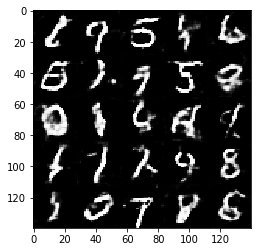

Epoch 2/5... Discriminator Loss: 1.2523... Generator Loss: 0.7225
Epoch 2/5... Discriminator Loss: 1.1026... Generator Loss: 1.3574
Epoch 2/5... Discriminator Loss: 1.0885... Generator Loss: 1.2065
Epoch 2/5... Discriminator Loss: 0.8603... Generator Loss: 0.8652
Epoch 2/5... Discriminator Loss: 1.1948... Generator Loss: 1.3098
Epoch 2/5... Discriminator Loss: 1.1624... Generator Loss: 1.7832
Epoch 2/5... Discriminator Loss: 0.9833... Generator Loss: 1.0847
Epoch 2/5... Discriminator Loss: 1.2292... Generator Loss: 0.8132
Epoch 2/5... Discriminator Loss: 1.2836... Generator Loss: 0.6668
Epoch 2/5... Discriminator Loss: 0.9183... Generator Loss: 1.4953


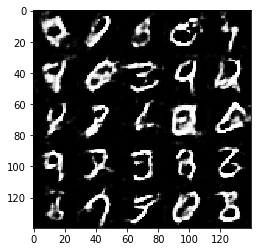

Epoch 2/5... Discriminator Loss: 1.1817... Generator Loss: 0.9090
Epoch 2/5... Discriminator Loss: 1.2500... Generator Loss: 0.7409
Epoch 2/5... Discriminator Loss: 0.9636... Generator Loss: 1.2625
Epoch 2/5... Discriminator Loss: 1.0875... Generator Loss: 1.0998
Epoch 2/5... Discriminator Loss: 1.1441... Generator Loss: 0.8484
Epoch 2/5... Discriminator Loss: 1.1266... Generator Loss: 1.5318
Epoch 2/5... Discriminator Loss: 1.0498... Generator Loss: 1.5623
Epoch 2/5... Discriminator Loss: 0.9985... Generator Loss: 1.1548
Epoch 2/5... Discriminator Loss: 1.1351... Generator Loss: 1.5203
Epoch 2/5... Discriminator Loss: 0.9969... Generator Loss: 1.3812


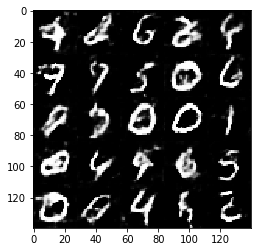

Epoch 2/5... Discriminator Loss: 1.2023... Generator Loss: 1.4070
Epoch 2/5... Discriminator Loss: 0.9395... Generator Loss: 1.2159
Epoch 2/5... Discriminator Loss: 1.0241... Generator Loss: 1.6118
Epoch 2/5... Discriminator Loss: 1.0779... Generator Loss: 0.8333
Epoch 2/5... Discriminator Loss: 0.9898... Generator Loss: 1.5097
Epoch 2/5... Discriminator Loss: 1.1548... Generator Loss: 0.8443
Epoch 2/5... Discriminator Loss: 0.9589... Generator Loss: 1.3210
Epoch 2/5... Discriminator Loss: 0.8889... Generator Loss: 1.4853
Epoch 2/5... Discriminator Loss: 0.9674... Generator Loss: 1.2927
Epoch 2/5... Discriminator Loss: 1.1288... Generator Loss: 1.3286


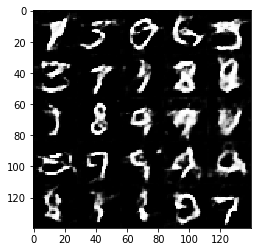

Epoch 2/5... Discriminator Loss: 0.9882... Generator Loss: 2.0906
Epoch 2/5... Discriminator Loss: 1.0189... Generator Loss: 1.3387
Epoch 2/5... Discriminator Loss: 1.0514... Generator Loss: 1.3962
Epoch 2/5... Discriminator Loss: 1.0635... Generator Loss: 1.2700
Epoch 2/5... Discriminator Loss: 1.1881... Generator Loss: 1.9295
Epoch 2/5... Discriminator Loss: 1.0042... Generator Loss: 1.2961
Epoch 2/5... Discriminator Loss: 1.3472... Generator Loss: 0.8374
Epoch 2/5... Discriminator Loss: 0.9128... Generator Loss: 1.0356
Epoch 2/5... Discriminator Loss: 0.8890... Generator Loss: 1.2847
Epoch 2/5... Discriminator Loss: 0.9096... Generator Loss: 1.4753


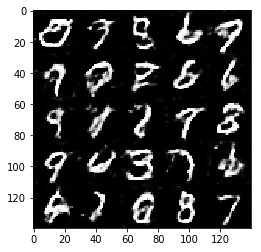

Epoch 2/5... Discriminator Loss: 1.0923... Generator Loss: 1.1397
Epoch 2/5... Discriminator Loss: 0.9962... Generator Loss: 1.3325
Epoch 2/5... Discriminator Loss: 1.0584... Generator Loss: 2.0376
Epoch 2/5... Discriminator Loss: 0.9652... Generator Loss: 1.4756
Epoch 2/5... Discriminator Loss: 0.9800... Generator Loss: 1.0999
Epoch 2/5... Discriminator Loss: 0.9862... Generator Loss: 1.4005
Epoch 2/5... Discriminator Loss: 1.3259... Generator Loss: 0.7481
Epoch 2/5... Discriminator Loss: 1.0394... Generator Loss: 1.4910
Epoch 2/5... Discriminator Loss: 0.8141... Generator Loss: 1.6730
Epoch 2/5... Discriminator Loss: 1.0871... Generator Loss: 0.7296


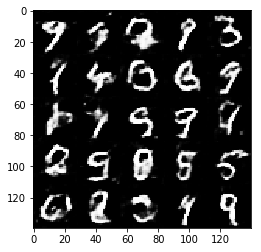

Epoch 2/5... Discriminator Loss: 1.0715... Generator Loss: 0.8737
Epoch 2/5... Discriminator Loss: 1.0727... Generator Loss: 1.6785
Epoch 2/5... Discriminator Loss: 1.1412... Generator Loss: 1.0087
Epoch 2/5... Discriminator Loss: 1.0917... Generator Loss: 1.1733
Epoch 2/5... Discriminator Loss: 0.9252... Generator Loss: 1.3352
Epoch 2/5... Discriminator Loss: 1.0597... Generator Loss: 1.0360
Epoch 2/5... Discriminator Loss: 1.0477... Generator Loss: 0.9290
Epoch 2/5... Discriminator Loss: 1.1046... Generator Loss: 2.5516
Epoch 2/5... Discriminator Loss: 1.1544... Generator Loss: 0.9656
Epoch 2/5... Discriminator Loss: 0.9345... Generator Loss: 1.3908


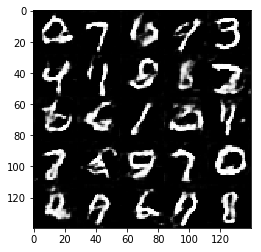

Epoch 2/5... Discriminator Loss: 1.0404... Generator Loss: 0.9531
Epoch 2/5... Discriminator Loss: 1.0889... Generator Loss: 1.3946
Epoch 2/5... Discriminator Loss: 0.9034... Generator Loss: 0.8088
Epoch 2/5... Discriminator Loss: 0.9449... Generator Loss: 1.7678
Epoch 2/5... Discriminator Loss: 0.8848... Generator Loss: 1.2565
Epoch 2/5... Discriminator Loss: 0.9570... Generator Loss: 1.9375
Epoch 2/5... Discriminator Loss: 0.9404... Generator Loss: 1.9238
Epoch 2/5... Discriminator Loss: 0.8700... Generator Loss: 0.9490
Epoch 2/5... Discriminator Loss: 1.0922... Generator Loss: 0.8031
Epoch 2/5... Discriminator Loss: 0.9981... Generator Loss: 1.3218


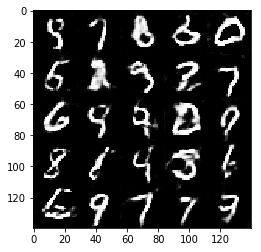

Epoch 2/5... Discriminator Loss: 0.9673... Generator Loss: 1.1234
Epoch 2/5... Discriminator Loss: 0.9254... Generator Loss: 1.3894
Epoch 2/5... Discriminator Loss: 0.9755... Generator Loss: 1.1106
Epoch 2/5... Discriminator Loss: 1.0903... Generator Loss: 1.1879
Epoch 2/5... Discriminator Loss: 0.9800... Generator Loss: 1.2119
Epoch 2/5... Discriminator Loss: 1.3067... Generator Loss: 0.9456
Epoch 2/5... Discriminator Loss: 1.0092... Generator Loss: 1.3898
Epoch 2/5... Discriminator Loss: 1.2244... Generator Loss: 0.9760
Epoch 2/5... Discriminator Loss: 0.8546... Generator Loss: 1.1737
Epoch 2/5... Discriminator Loss: 0.8653... Generator Loss: 1.4460


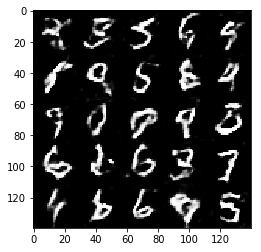

Epoch 2/5... Discriminator Loss: 1.4872... Generator Loss: 0.9161
Epoch 2/5... Discriminator Loss: 1.0239... Generator Loss: 0.7964
Epoch 2/5... Discriminator Loss: 0.9648... Generator Loss: 1.4947
Epoch 2/5... Discriminator Loss: 0.9149... Generator Loss: 1.6783
Epoch 2/5... Discriminator Loss: 1.0514... Generator Loss: 1.4575
Epoch 2/5... Discriminator Loss: 1.0450... Generator Loss: 1.4056
Epoch 2/5... Discriminator Loss: 0.9313... Generator Loss: 1.7066
Epoch 2/5... Discriminator Loss: 0.8626... Generator Loss: 1.3670
Epoch 2/5... Discriminator Loss: 0.7900... Generator Loss: 1.3818
Epoch 2/5... Discriminator Loss: 0.8987... Generator Loss: 1.2212


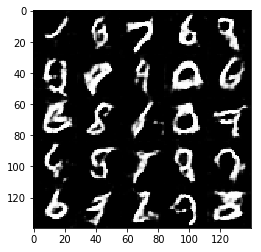

Epoch 2/5... Discriminator Loss: 0.9821... Generator Loss: 1.5872
Epoch 2/5... Discriminator Loss: 1.1062... Generator Loss: 0.9163
Epoch 2/5... Discriminator Loss: 0.7845... Generator Loss: 1.8230
Epoch 2/5... Discriminator Loss: 1.2984... Generator Loss: 0.8536
Epoch 2/5... Discriminator Loss: 0.9468... Generator Loss: 1.3370
Epoch 2/5... Discriminator Loss: 1.1207... Generator Loss: 0.9074
Epoch 2/5... Discriminator Loss: 0.8231... Generator Loss: 1.6129
Epoch 2/5... Discriminator Loss: 1.1168... Generator Loss: 1.1446
Epoch 2/5... Discriminator Loss: 0.8570... Generator Loss: 0.8779
Epoch 2/5... Discriminator Loss: 0.8410... Generator Loss: 1.3923


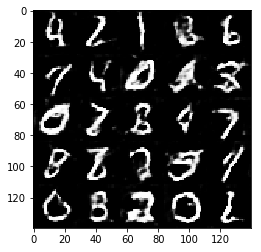

Epoch 2/5... Discriminator Loss: 1.0208... Generator Loss: 2.0240
Epoch 2/5... Discriminator Loss: 0.9357... Generator Loss: 1.3199
Epoch 2/5... Discriminator Loss: 0.8869... Generator Loss: 1.1150
Epoch 2/5... Discriminator Loss: 1.0099... Generator Loss: 1.2743
Epoch 2/5... Discriminator Loss: 0.8529... Generator Loss: 1.5104
Epoch 2/5... Discriminator Loss: 1.0548... Generator Loss: 0.9703
Epoch 2/5... Discriminator Loss: 0.8803... Generator Loss: 1.2056
Epoch 2/5... Discriminator Loss: 0.9101... Generator Loss: 1.9527
Epoch 2/5... Discriminator Loss: 0.7597... Generator Loss: 1.9993
Epoch 2/5... Discriminator Loss: 0.9107... Generator Loss: 1.2964


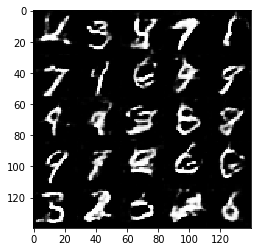

Epoch 2/5... Discriminator Loss: 0.9934... Generator Loss: 1.0238
Epoch 2/5... Discriminator Loss: 1.0616... Generator Loss: 0.9912
Epoch 2/5... Discriminator Loss: 0.9262... Generator Loss: 1.7146
Epoch 2/5... Discriminator Loss: 0.9155... Generator Loss: 1.6694
Epoch 2/5... Discriminator Loss: 0.7659... Generator Loss: 1.6292
Epoch 2/5... Discriminator Loss: 0.8037... Generator Loss: 1.1146
Epoch 2/5... Discriminator Loss: 0.9088... Generator Loss: 1.5462
Epoch 2/5... Discriminator Loss: 0.7935... Generator Loss: 1.9233
Epoch 2/5... Discriminator Loss: 0.9477... Generator Loss: 1.1878
Epoch 2/5... Discriminator Loss: 0.9517... Generator Loss: 1.4021


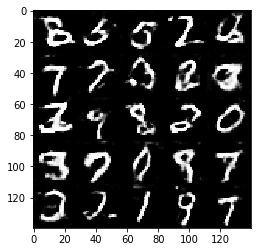

Epoch 2/5... Discriminator Loss: 0.9725... Generator Loss: 2.0000
Epoch 2/5... Discriminator Loss: 1.1065... Generator Loss: 1.2288
Epoch 2/5... Discriminator Loss: 0.9340... Generator Loss: 1.0776
Epoch 2/5... Discriminator Loss: 1.2240... Generator Loss: 2.4972
Epoch 2/5... Discriminator Loss: 1.0155... Generator Loss: 1.1801
Epoch 2/5... Discriminator Loss: 0.8380... Generator Loss: 1.9137
Epoch 2/5... Discriminator Loss: 0.7951... Generator Loss: 0.9923
Epoch 2/5... Discriminator Loss: 0.7619... Generator Loss: 2.1031
Epoch 2/5... Discriminator Loss: 0.9421... Generator Loss: 0.9441
Epoch 2/5... Discriminator Loss: 0.8861... Generator Loss: 1.1939


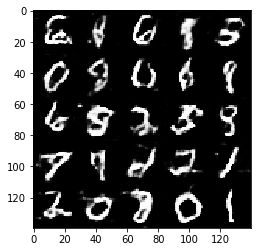

Epoch 2/5... Discriminator Loss: 0.7243... Generator Loss: 1.4994
Epoch 2/5... Discriminator Loss: 0.8920... Generator Loss: 2.3028
Epoch 2/5... Discriminator Loss: 0.8507... Generator Loss: 1.7653
Epoch 2/5... Discriminator Loss: 0.8952... Generator Loss: 1.3043
Epoch 2/5... Discriminator Loss: 1.0567... Generator Loss: 1.7804
Epoch 2/5... Discriminator Loss: 0.8446... Generator Loss: 2.0430
Epoch 2/5... Discriminator Loss: 1.1986... Generator Loss: 0.9578
Epoch 2/5... Discriminator Loss: 0.8550... Generator Loss: 1.5470
Epoch 2/5... Discriminator Loss: 0.7266... Generator Loss: 2.0735
Epoch 2/5... Discriminator Loss: 0.7167... Generator Loss: 1.6406


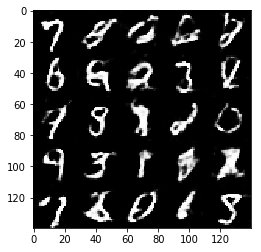

Epoch 2/5... Discriminator Loss: 0.8589... Generator Loss: 1.4442
Epoch 2/5... Discriminator Loss: 1.0487... Generator Loss: 2.2284
Epoch 2/5... Discriminator Loss: 0.8116... Generator Loss: 1.4681
Epoch 2/5... Discriminator Loss: 0.8068... Generator Loss: 1.2571
Epoch 2/5... Discriminator Loss: 0.7607... Generator Loss: 1.3160
Epoch 3/5... Discriminator Loss: 0.7352... Generator Loss: 1.6055
Epoch 3/5... Discriminator Loss: 0.8614... Generator Loss: 1.7418
Epoch 3/5... Discriminator Loss: 0.9153... Generator Loss: 1.4337
Epoch 3/5... Discriminator Loss: 0.9294... Generator Loss: 1.2551
Epoch 3/5... Discriminator Loss: 0.8465... Generator Loss: 1.6923


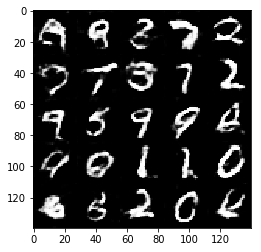

Epoch 3/5... Discriminator Loss: 0.8495... Generator Loss: 1.2328
Epoch 3/5... Discriminator Loss: 0.7596... Generator Loss: 1.3312
Epoch 3/5... Discriminator Loss: 0.7265... Generator Loss: 1.8414
Epoch 3/5... Discriminator Loss: 1.0092... Generator Loss: 1.0309
Epoch 3/5... Discriminator Loss: 1.4393... Generator Loss: 3.3251
Epoch 3/5... Discriminator Loss: 0.8295... Generator Loss: 1.7490
Epoch 3/5... Discriminator Loss: 1.0240... Generator Loss: 2.4723
Epoch 3/5... Discriminator Loss: 0.9918... Generator Loss: 1.1349
Epoch 3/5... Discriminator Loss: 0.7916... Generator Loss: 2.0041
Epoch 3/5... Discriminator Loss: 0.7507... Generator Loss: 1.5529


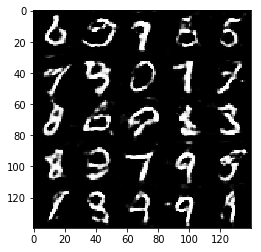

Epoch 3/5... Discriminator Loss: 0.6463... Generator Loss: 1.8684
Epoch 3/5... Discriminator Loss: 0.8844... Generator Loss: 1.1341
Epoch 3/5... Discriminator Loss: 0.8748... Generator Loss: 1.2631
Epoch 3/5... Discriminator Loss: 1.0478... Generator Loss: 2.7631
Epoch 3/5... Discriminator Loss: 0.7967... Generator Loss: 1.9490
Epoch 3/5... Discriminator Loss: 1.0034... Generator Loss: 1.0422
Epoch 3/5... Discriminator Loss: 0.7413... Generator Loss: 2.3059
Epoch 3/5... Discriminator Loss: 0.7946... Generator Loss: 1.2902
Epoch 3/5... Discriminator Loss: 0.8196... Generator Loss: 1.2772
Epoch 3/5... Discriminator Loss: 0.9669... Generator Loss: 1.0535


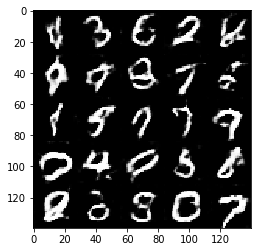

Epoch 3/5... Discriminator Loss: 0.8249... Generator Loss: 1.5874
Epoch 3/5... Discriminator Loss: 0.8421... Generator Loss: 3.0074
Epoch 3/5... Discriminator Loss: 0.6791... Generator Loss: 2.0656
Epoch 3/5... Discriminator Loss: 1.0077... Generator Loss: 1.3003
Epoch 3/5... Discriminator Loss: 0.6123... Generator Loss: 1.6591
Epoch 3/5... Discriminator Loss: 0.8539... Generator Loss: 1.8490
Epoch 3/5... Discriminator Loss: 0.8333... Generator Loss: 2.4253
Epoch 3/5... Discriminator Loss: 0.6702... Generator Loss: 1.6420
Epoch 3/5... Discriminator Loss: 1.9013... Generator Loss: 0.7206
Epoch 3/5... Discriminator Loss: 0.7573... Generator Loss: 1.6559


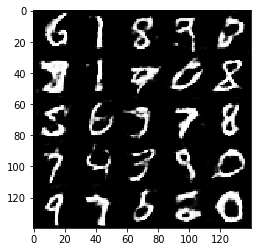

Epoch 3/5... Discriminator Loss: 0.7312... Generator Loss: 1.7052
Epoch 3/5... Discriminator Loss: 0.7322... Generator Loss: 1.4745
Epoch 3/5... Discriminator Loss: 1.2403... Generator Loss: 2.3869
Epoch 3/5... Discriminator Loss: 0.8243... Generator Loss: 1.1133
Epoch 3/5... Discriminator Loss: 0.6805... Generator Loss: 1.5462
Epoch 3/5... Discriminator Loss: 0.6692... Generator Loss: 2.3948
Epoch 3/5... Discriminator Loss: 0.7378... Generator Loss: 1.8837
Epoch 3/5... Discriminator Loss: 0.9147... Generator Loss: 2.6122
Epoch 3/5... Discriminator Loss: 0.6994... Generator Loss: 1.7111
Epoch 3/5... Discriminator Loss: 0.8766... Generator Loss: 1.5425


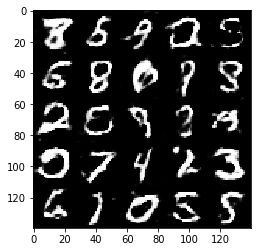

Epoch 3/5... Discriminator Loss: 0.8145... Generator Loss: 1.5621
Epoch 3/5... Discriminator Loss: 0.8075... Generator Loss: 2.3311
Epoch 3/5... Discriminator Loss: 0.7207... Generator Loss: 2.1549
Epoch 3/5... Discriminator Loss: 1.3503... Generator Loss: 0.5549
Epoch 3/5... Discriminator Loss: 0.8543... Generator Loss: 1.9068
Epoch 3/5... Discriminator Loss: 0.7959... Generator Loss: 1.9988
Epoch 3/5... Discriminator Loss: 0.6733... Generator Loss: 1.9779
Epoch 3/5... Discriminator Loss: 0.7907... Generator Loss: 1.7453
Epoch 3/5... Discriminator Loss: 0.7028... Generator Loss: 1.5083
Epoch 3/5... Discriminator Loss: 0.6496... Generator Loss: 1.6503


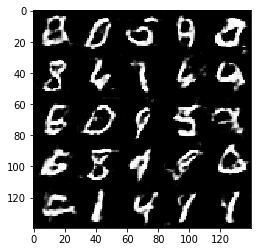

Epoch 3/5... Discriminator Loss: 0.7559... Generator Loss: 2.2183
Epoch 3/5... Discriminator Loss: 0.9279... Generator Loss: 2.5093
Epoch 3/5... Discriminator Loss: 0.7501... Generator Loss: 1.9926
Epoch 3/5... Discriminator Loss: 0.8146... Generator Loss: 1.8556
Epoch 3/5... Discriminator Loss: 0.6429... Generator Loss: 2.0736
Epoch 3/5... Discriminator Loss: 0.8085... Generator Loss: 1.1770
Epoch 3/5... Discriminator Loss: 0.6693... Generator Loss: 1.7051
Epoch 3/5... Discriminator Loss: 0.9377... Generator Loss: 0.9595
Epoch 3/5... Discriminator Loss: 0.9501... Generator Loss: 1.2384
Epoch 3/5... Discriminator Loss: 0.7115... Generator Loss: 1.8615


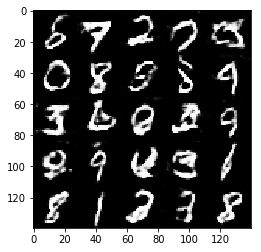

Epoch 3/5... Discriminator Loss: 0.7777... Generator Loss: 1.8265
Epoch 3/5... Discriminator Loss: 0.9476... Generator Loss: 1.8080
Epoch 3/5... Discriminator Loss: 0.7415... Generator Loss: 2.2341
Epoch 3/5... Discriminator Loss: 0.8632... Generator Loss: 1.3070
Epoch 3/5... Discriminator Loss: 0.9443... Generator Loss: 1.6623
Epoch 3/5... Discriminator Loss: 0.7684... Generator Loss: 1.7776
Epoch 3/5... Discriminator Loss: 0.7344... Generator Loss: 2.0743
Epoch 3/5... Discriminator Loss: 0.8768... Generator Loss: 1.3555
Epoch 3/5... Discriminator Loss: 0.6692... Generator Loss: 2.1663
Epoch 3/5... Discriminator Loss: 1.7649... Generator Loss: 2.9558


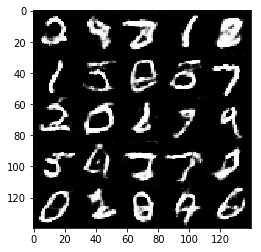

Epoch 3/5... Discriminator Loss: 0.7207... Generator Loss: 1.5669
Epoch 3/5... Discriminator Loss: 0.8473... Generator Loss: 1.4817
Epoch 3/5... Discriminator Loss: 1.0470... Generator Loss: 1.8086
Epoch 3/5... Discriminator Loss: 0.7608... Generator Loss: 1.8024
Epoch 3/5... Discriminator Loss: 0.7108... Generator Loss: 2.2977
Epoch 3/5... Discriminator Loss: 1.4254... Generator Loss: 3.2964
Epoch 3/5... Discriminator Loss: 0.8396... Generator Loss: 1.7325
Epoch 3/5... Discriminator Loss: 0.8378... Generator Loss: 1.4064
Epoch 3/5... Discriminator Loss: 0.6626... Generator Loss: 1.2829
Epoch 3/5... Discriminator Loss: 0.8020... Generator Loss: 2.4492


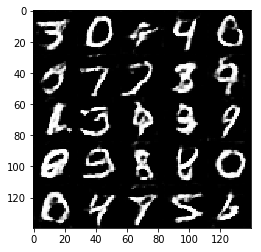

Epoch 3/5... Discriminator Loss: 0.8152... Generator Loss: 1.7837
Epoch 3/5... Discriminator Loss: 0.8147... Generator Loss: 1.8170
Epoch 3/5... Discriminator Loss: 0.8425... Generator Loss: 2.0608
Epoch 3/5... Discriminator Loss: 0.7125... Generator Loss: 2.4652
Epoch 3/5... Discriminator Loss: 0.6969... Generator Loss: 2.1311
Epoch 3/5... Discriminator Loss: 0.7284... Generator Loss: 2.2252
Epoch 3/5... Discriminator Loss: 0.7293... Generator Loss: 1.6688
Epoch 3/5... Discriminator Loss: 0.8298... Generator Loss: 3.0883
Epoch 3/5... Discriminator Loss: 0.6590... Generator Loss: 1.9123
Epoch 3/5... Discriminator Loss: 0.7466... Generator Loss: 2.3397


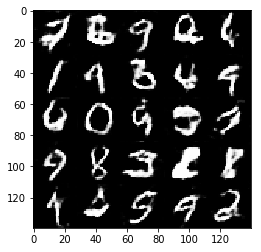

Epoch 3/5... Discriminator Loss: 0.8568... Generator Loss: 1.5923
Epoch 3/5... Discriminator Loss: 0.8930... Generator Loss: 3.5814
Epoch 3/5... Discriminator Loss: 0.7261... Generator Loss: 1.6629
Epoch 3/5... Discriminator Loss: 0.7585... Generator Loss: 1.8175
Epoch 3/5... Discriminator Loss: 0.7150... Generator Loss: 2.1784
Epoch 3/5... Discriminator Loss: 0.7881... Generator Loss: 1.8056
Epoch 3/5... Discriminator Loss: 0.8032... Generator Loss: 1.4522
Epoch 3/5... Discriminator Loss: 0.8744... Generator Loss: 2.4016
Epoch 3/5... Discriminator Loss: 0.7662... Generator Loss: 1.5756
Epoch 3/5... Discriminator Loss: 0.6556... Generator Loss: 2.1698


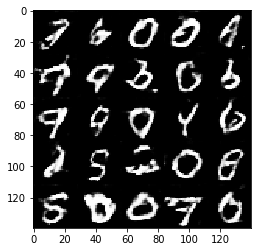

Epoch 3/5... Discriminator Loss: 0.8077... Generator Loss: 2.6708
Epoch 3/5... Discriminator Loss: 0.7643... Generator Loss: 1.8125
Epoch 3/5... Discriminator Loss: 0.6949... Generator Loss: 1.9002
Epoch 3/5... Discriminator Loss: 0.7410... Generator Loss: 1.5715
Epoch 3/5... Discriminator Loss: 0.7361... Generator Loss: 2.2015
Epoch 3/5... Discriminator Loss: 0.8316... Generator Loss: 1.4218
Epoch 3/5... Discriminator Loss: 1.1864... Generator Loss: 1.0196
Epoch 3/5... Discriminator Loss: 0.7044... Generator Loss: 1.9148
Epoch 3/5... Discriminator Loss: 0.7275... Generator Loss: 1.5194
Epoch 3/5... Discriminator Loss: 0.8810... Generator Loss: 1.8233


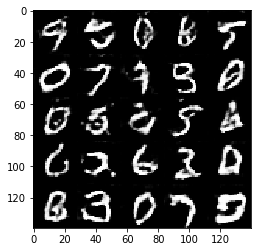

Epoch 3/5... Discriminator Loss: 0.9921... Generator Loss: 2.5385
Epoch 3/5... Discriminator Loss: 0.7023... Generator Loss: 1.5984
Epoch 3/5... Discriminator Loss: 0.6924... Generator Loss: 2.8119
Epoch 3/5... Discriminator Loss: 0.6694... Generator Loss: 2.1450
Epoch 3/5... Discriminator Loss: 0.6900... Generator Loss: 2.2798
Epoch 3/5... Discriminator Loss: 0.7999... Generator Loss: 1.7702
Epoch 3/5... Discriminator Loss: 1.0426... Generator Loss: 2.7000
Epoch 3/5... Discriminator Loss: 0.5803... Generator Loss: 2.0223
Epoch 3/5... Discriminator Loss: 1.1840... Generator Loss: 0.9654
Epoch 3/5... Discriminator Loss: 0.6167... Generator Loss: 2.4353


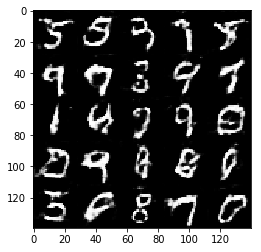

Epoch 3/5... Discriminator Loss: 0.7987... Generator Loss: 2.0995
Epoch 3/5... Discriminator Loss: 0.7208... Generator Loss: 1.5806
Epoch 3/5... Discriminator Loss: 0.6315... Generator Loss: 2.4322
Epoch 3/5... Discriminator Loss: 0.7171... Generator Loss: 2.4450
Epoch 3/5... Discriminator Loss: 0.6826... Generator Loss: 2.6426
Epoch 3/5... Discriminator Loss: 0.8155... Generator Loss: 1.3320
Epoch 3/5... Discriminator Loss: 1.0300... Generator Loss: 0.9958
Epoch 3/5... Discriminator Loss: 0.8496... Generator Loss: 2.7628
Epoch 3/5... Discriminator Loss: 0.6203... Generator Loss: 2.3810
Epoch 3/5... Discriminator Loss: 0.5691... Generator Loss: 2.0249


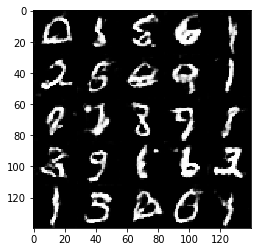

Epoch 3/5... Discriminator Loss: 0.7380... Generator Loss: 1.8936
Epoch 3/5... Discriminator Loss: 0.7748... Generator Loss: 1.2160
Epoch 3/5... Discriminator Loss: 0.8220... Generator Loss: 1.7499
Epoch 3/5... Discriminator Loss: 0.8365... Generator Loss: 2.1460
Epoch 3/5... Discriminator Loss: 0.7887... Generator Loss: 2.5127
Epoch 3/5... Discriminator Loss: 0.9566... Generator Loss: 1.7459
Epoch 3/5... Discriminator Loss: 0.7680... Generator Loss: 2.1622
Epoch 3/5... Discriminator Loss: 0.6700... Generator Loss: 2.8150
Epoch 3/5... Discriminator Loss: 0.7612... Generator Loss: 1.7824
Epoch 3/5... Discriminator Loss: 0.7040... Generator Loss: 1.4973


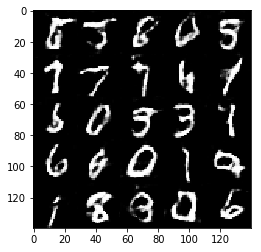

Epoch 3/5... Discriminator Loss: 0.8179... Generator Loss: 1.9781
Epoch 3/5... Discriminator Loss: 0.6286... Generator Loss: 1.9892
Epoch 3/5... Discriminator Loss: 0.7948... Generator Loss: 2.9078
Epoch 3/5... Discriminator Loss: 0.7738... Generator Loss: 2.2601
Epoch 3/5... Discriminator Loss: 0.8867... Generator Loss: 0.8715
Epoch 3/5... Discriminator Loss: 0.7371... Generator Loss: 1.2741
Epoch 3/5... Discriminator Loss: 0.9552... Generator Loss: 1.5959
Epoch 3/5... Discriminator Loss: 0.8268... Generator Loss: 1.7760
Epoch 3/5... Discriminator Loss: 0.8957... Generator Loss: 2.2283
Epoch 3/5... Discriminator Loss: 0.7507... Generator Loss: 2.2102


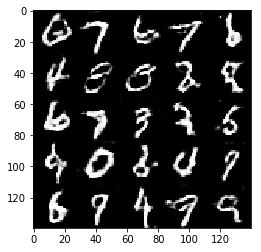

Epoch 3/5... Discriminator Loss: 0.7895... Generator Loss: 2.1331
Epoch 3/5... Discriminator Loss: 0.6949... Generator Loss: 2.3192
Epoch 3/5... Discriminator Loss: 0.7020... Generator Loss: 1.7208
Epoch 3/5... Discriminator Loss: 0.6851... Generator Loss: 2.2694
Epoch 3/5... Discriminator Loss: 0.7045... Generator Loss: 2.7476
Epoch 3/5... Discriminator Loss: 0.8135... Generator Loss: 2.8225
Epoch 3/5... Discriminator Loss: 0.7418... Generator Loss: 3.5611
Epoch 3/5... Discriminator Loss: 0.6133... Generator Loss: 2.3365
Epoch 3/5... Discriminator Loss: 0.7046... Generator Loss: 1.9834
Epoch 3/5... Discriminator Loss: 0.7712... Generator Loss: 2.6803


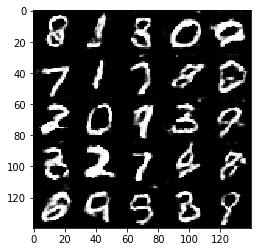

Epoch 3/5... Discriminator Loss: 0.7197... Generator Loss: 1.6871
Epoch 3/5... Discriminator Loss: 0.7159... Generator Loss: 2.2392
Epoch 3/5... Discriminator Loss: 0.6560... Generator Loss: 1.4608
Epoch 3/5... Discriminator Loss: 0.6951... Generator Loss: 1.9369
Epoch 3/5... Discriminator Loss: 0.9088... Generator Loss: 1.7610
Epoch 3/5... Discriminator Loss: 0.6607... Generator Loss: 1.8688
Epoch 3/5... Discriminator Loss: 0.7599... Generator Loss: 1.6752
Epoch 3/5... Discriminator Loss: 0.6368... Generator Loss: 3.1184
Epoch 3/5... Discriminator Loss: 0.8147... Generator Loss: 1.5492
Epoch 3/5... Discriminator Loss: 0.8888... Generator Loss: 2.8133


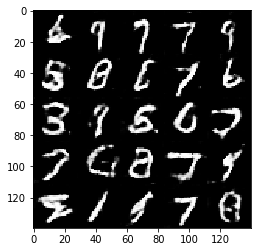

Epoch 3/5... Discriminator Loss: 0.7818... Generator Loss: 2.1329
Epoch 3/5... Discriminator Loss: 0.7697... Generator Loss: 2.3315
Epoch 3/5... Discriminator Loss: 0.8398... Generator Loss: 1.7264
Epoch 3/5... Discriminator Loss: 0.8414... Generator Loss: 1.1373
Epoch 3/5... Discriminator Loss: 0.7619... Generator Loss: 2.1709
Epoch 3/5... Discriminator Loss: 0.7448... Generator Loss: 1.8681
Epoch 3/5... Discriminator Loss: 0.7147... Generator Loss: 2.8329
Epoch 3/5... Discriminator Loss: 0.6820... Generator Loss: 2.3013
Epoch 3/5... Discriminator Loss: 0.7710... Generator Loss: 2.4479
Epoch 3/5... Discriminator Loss: 0.8749... Generator Loss: 2.4042


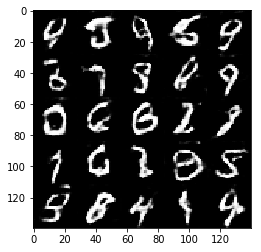

Epoch 3/5... Discriminator Loss: 0.7001... Generator Loss: 2.0142
Epoch 3/5... Discriminator Loss: 0.6960... Generator Loss: 2.3953
Epoch 4/5... Discriminator Loss: 0.7228... Generator Loss: 2.0421
Epoch 4/5... Discriminator Loss: 0.7005... Generator Loss: 3.4506
Epoch 4/5... Discriminator Loss: 0.6524... Generator Loss: 2.8848
Epoch 4/5... Discriminator Loss: 0.8153... Generator Loss: 1.4537
Epoch 4/5... Discriminator Loss: 0.7210... Generator Loss: 1.4422
Epoch 4/5... Discriminator Loss: 0.6367... Generator Loss: 1.2734
Epoch 4/5... Discriminator Loss: 0.7985... Generator Loss: 2.5719
Epoch 4/5... Discriminator Loss: 0.6656... Generator Loss: 2.3733


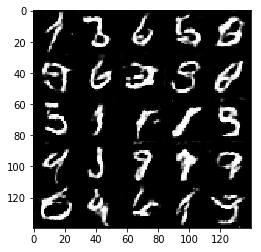

Epoch 4/5... Discriminator Loss: 0.6751... Generator Loss: 2.5198
Epoch 4/5... Discriminator Loss: 0.6742... Generator Loss: 2.4064
Epoch 4/5... Discriminator Loss: 0.7631... Generator Loss: 1.7419
Epoch 4/5... Discriminator Loss: 1.0571... Generator Loss: 1.4232
Epoch 4/5... Discriminator Loss: 0.9316... Generator Loss: 1.1828
Epoch 4/5... Discriminator Loss: 0.6823... Generator Loss: 1.9806
Epoch 4/5... Discriminator Loss: 0.6386... Generator Loss: 2.2545
Epoch 4/5... Discriminator Loss: 0.7387... Generator Loss: 1.8321
Epoch 4/5... Discriminator Loss: 0.6918... Generator Loss: 2.4194
Epoch 4/5... Discriminator Loss: 0.8001... Generator Loss: 1.0169


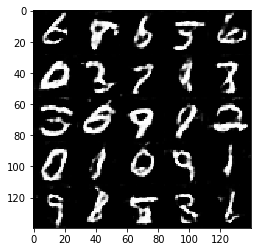

Epoch 4/5... Discriminator Loss: 0.6359... Generator Loss: 2.4498
Epoch 4/5... Discriminator Loss: 0.7906... Generator Loss: 2.1761
Epoch 4/5... Discriminator Loss: 0.5684... Generator Loss: 2.6571
Epoch 4/5... Discriminator Loss: 0.8935... Generator Loss: 2.4590
Epoch 4/5... Discriminator Loss: 0.7572... Generator Loss: 1.9168
Epoch 4/5... Discriminator Loss: 0.7162... Generator Loss: 2.0230
Epoch 4/5... Discriminator Loss: 0.6902... Generator Loss: 1.7480
Epoch 4/5... Discriminator Loss: 0.7802... Generator Loss: 2.3982
Epoch 4/5... Discriminator Loss: 0.6438... Generator Loss: 2.8808
Epoch 4/5... Discriminator Loss: 0.5854... Generator Loss: 2.7947


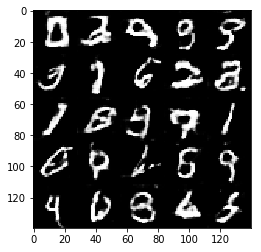

Epoch 4/5... Discriminator Loss: 0.6879... Generator Loss: 2.2224
Epoch 4/5... Discriminator Loss: 0.7386... Generator Loss: 2.4222
Epoch 4/5... Discriminator Loss: 0.6257... Generator Loss: 2.5710
Epoch 4/5... Discriminator Loss: 1.0224... Generator Loss: 1.3899
Epoch 4/5... Discriminator Loss: 0.5790... Generator Loss: 2.9905
Epoch 4/5... Discriminator Loss: 0.6458... Generator Loss: 2.1812
Epoch 4/5... Discriminator Loss: 0.5409... Generator Loss: 2.5869
Epoch 4/5... Discriminator Loss: 0.7128... Generator Loss: 2.2257
Epoch 4/5... Discriminator Loss: 0.5925... Generator Loss: 2.2981
Epoch 4/5... Discriminator Loss: 0.6691... Generator Loss: 1.9527


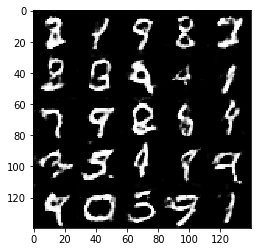

Epoch 4/5... Discriminator Loss: 0.7749... Generator Loss: 2.4562
Epoch 4/5... Discriminator Loss: 0.6610... Generator Loss: 1.5457
Epoch 4/5... Discriminator Loss: 0.8381... Generator Loss: 2.3999
Epoch 4/5... Discriminator Loss: 1.2822... Generator Loss: 0.7696
Epoch 4/5... Discriminator Loss: 0.6506... Generator Loss: 1.4590
Epoch 4/5... Discriminator Loss: 0.7173... Generator Loss: 2.0475
Epoch 4/5... Discriminator Loss: 1.0884... Generator Loss: 1.0771
Epoch 4/5... Discriminator Loss: 0.6867... Generator Loss: 2.5960
Epoch 4/5... Discriminator Loss: 0.6804... Generator Loss: 2.1377
Epoch 4/5... Discriminator Loss: 0.7334... Generator Loss: 2.3687


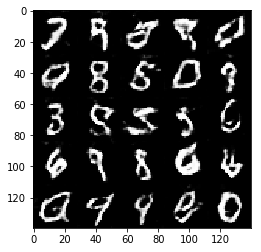

Epoch 4/5... Discriminator Loss: 0.7813... Generator Loss: 1.9958
Epoch 4/5... Discriminator Loss: 0.6053... Generator Loss: 1.6463
Epoch 4/5... Discriminator Loss: 0.9793... Generator Loss: 1.2382
Epoch 4/5... Discriminator Loss: 0.8022... Generator Loss: 1.2995
Epoch 4/5... Discriminator Loss: 0.6218... Generator Loss: 2.2522
Epoch 4/5... Discriminator Loss: 0.8099... Generator Loss: 1.6454
Epoch 4/5... Discriminator Loss: 0.8601... Generator Loss: 1.8372
Epoch 4/5... Discriminator Loss: 0.7372... Generator Loss: 1.6717
Epoch 4/5... Discriminator Loss: 0.6500... Generator Loss: 1.3455
Epoch 4/5... Discriminator Loss: 0.6833... Generator Loss: 2.6485


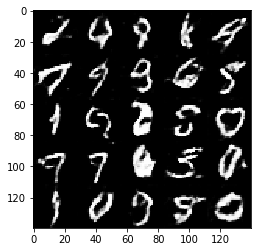

Epoch 4/5... Discriminator Loss: 0.6947... Generator Loss: 2.3508
Epoch 4/5... Discriminator Loss: 0.7286... Generator Loss: 1.9855
Epoch 4/5... Discriminator Loss: 0.7231... Generator Loss: 2.1982
Epoch 4/5... Discriminator Loss: 0.7864... Generator Loss: 2.7162
Epoch 4/5... Discriminator Loss: 1.0071... Generator Loss: 3.4437
Epoch 4/5... Discriminator Loss: 0.6969... Generator Loss: 1.9604
Epoch 4/5... Discriminator Loss: 0.6019... Generator Loss: 2.1348
Epoch 4/5... Discriminator Loss: 0.7528... Generator Loss: 2.2677
Epoch 4/5... Discriminator Loss: 0.6115... Generator Loss: 2.2423
Epoch 4/5... Discriminator Loss: 0.7670... Generator Loss: 1.5067


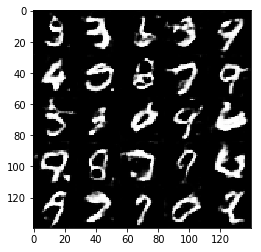

Epoch 4/5... Discriminator Loss: 0.7244... Generator Loss: 1.7603
Epoch 4/5... Discriminator Loss: 0.6388... Generator Loss: 2.1649
Epoch 4/5... Discriminator Loss: 0.7065... Generator Loss: 2.6881
Epoch 4/5... Discriminator Loss: 0.6847... Generator Loss: 2.9786
Epoch 4/5... Discriminator Loss: 0.8353... Generator Loss: 1.5264
Epoch 4/5... Discriminator Loss: 0.8439... Generator Loss: 2.5361
Epoch 4/5... Discriminator Loss: 0.8059... Generator Loss: 2.4788
Epoch 4/5... Discriminator Loss: 0.7062... Generator Loss: 2.3950
Epoch 4/5... Discriminator Loss: 0.8499... Generator Loss: 2.0036
Epoch 4/5... Discriminator Loss: 0.7296... Generator Loss: 2.5100


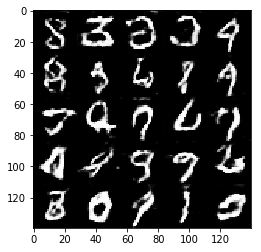

Epoch 4/5... Discriminator Loss: 0.7119... Generator Loss: 2.2534
Epoch 4/5... Discriminator Loss: 0.6292... Generator Loss: 2.2340
Epoch 4/5... Discriminator Loss: 0.7515... Generator Loss: 2.3639
Epoch 4/5... Discriminator Loss: 0.6003... Generator Loss: 2.5380
Epoch 4/5... Discriminator Loss: 0.7052... Generator Loss: 2.1416
Epoch 4/5... Discriminator Loss: 0.8296... Generator Loss: 2.5728
Epoch 4/5... Discriminator Loss: 0.6507... Generator Loss: 1.6172
Epoch 4/5... Discriminator Loss: 0.6559... Generator Loss: 1.6815
Epoch 4/5... Discriminator Loss: 0.5494... Generator Loss: 1.9050
Epoch 4/5... Discriminator Loss: 0.6970... Generator Loss: 2.4154


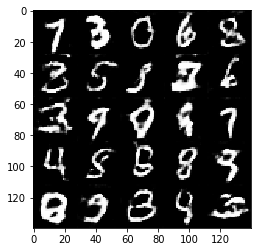

Epoch 4/5... Discriminator Loss: 0.8858... Generator Loss: 3.2273
Epoch 4/5... Discriminator Loss: 1.1964... Generator Loss: 1.4792
Epoch 4/5... Discriminator Loss: 1.0018... Generator Loss: 3.0681
Epoch 4/5... Discriminator Loss: 0.6783... Generator Loss: 3.7278
Epoch 4/5... Discriminator Loss: 0.7276... Generator Loss: 2.7115
Epoch 4/5... Discriminator Loss: 0.9828... Generator Loss: 1.9677
Epoch 4/5... Discriminator Loss: 0.8786... Generator Loss: 1.7840
Epoch 4/5... Discriminator Loss: 0.7652... Generator Loss: 1.1244
Epoch 4/5... Discriminator Loss: 0.6521... Generator Loss: 1.5046
Epoch 4/5... Discriminator Loss: 0.8722... Generator Loss: 1.3946


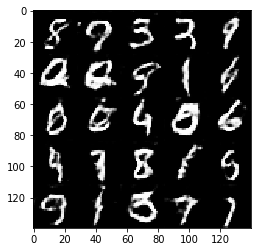

Epoch 4/5... Discriminator Loss: 0.7518... Generator Loss: 2.7129
Epoch 4/5... Discriminator Loss: 0.7669... Generator Loss: 1.1093
Epoch 4/5... Discriminator Loss: 0.5579... Generator Loss: 3.2918
Epoch 4/5... Discriminator Loss: 0.9187... Generator Loss: 1.0943
Epoch 4/5... Discriminator Loss: 0.6141... Generator Loss: 3.2354
Epoch 4/5... Discriminator Loss: 0.9665... Generator Loss: 2.0811
Epoch 4/5... Discriminator Loss: 0.6670... Generator Loss: 2.1235
Epoch 4/5... Discriminator Loss: 0.7023... Generator Loss: 2.3764
Epoch 4/5... Discriminator Loss: 0.8486... Generator Loss: 2.0572
Epoch 4/5... Discriminator Loss: 0.7200... Generator Loss: 2.1596


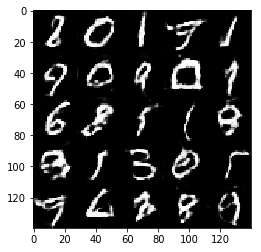

Epoch 4/5... Discriminator Loss: 0.6612... Generator Loss: 2.4163
Epoch 4/5... Discriminator Loss: 0.8623... Generator Loss: 3.7492
Epoch 4/5... Discriminator Loss: 0.9454... Generator Loss: 2.4908
Epoch 4/5... Discriminator Loss: 0.7058... Generator Loss: 2.1186
Epoch 4/5... Discriminator Loss: 0.8511... Generator Loss: 1.6852
Epoch 4/5... Discriminator Loss: 0.6362... Generator Loss: 2.7858
Epoch 4/5... Discriminator Loss: 0.6280... Generator Loss: 2.3071
Epoch 4/5... Discriminator Loss: 0.6399... Generator Loss: 2.2252
Epoch 4/5... Discriminator Loss: 0.6674... Generator Loss: 2.5058
Epoch 4/5... Discriminator Loss: 0.6584... Generator Loss: 1.9696


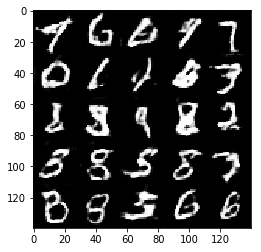

Epoch 4/5... Discriminator Loss: 0.6935... Generator Loss: 1.7662
Epoch 4/5... Discriminator Loss: 0.6044... Generator Loss: 2.3102
Epoch 4/5... Discriminator Loss: 0.7431... Generator Loss: 1.3865
Epoch 4/5... Discriminator Loss: 0.6816... Generator Loss: 2.6601
Epoch 4/5... Discriminator Loss: 0.6472... Generator Loss: 2.5281
Epoch 4/5... Discriminator Loss: 0.7055... Generator Loss: 2.9669
Epoch 4/5... Discriminator Loss: 0.9823... Generator Loss: 1.3455
Epoch 4/5... Discriminator Loss: 0.7309... Generator Loss: 1.7703
Epoch 4/5... Discriminator Loss: 0.6838... Generator Loss: 2.1897
Epoch 4/5... Discriminator Loss: 0.7747... Generator Loss: 1.9574


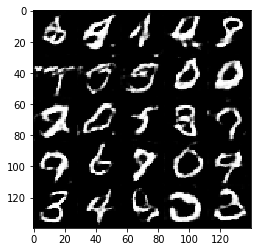

Epoch 4/5... Discriminator Loss: 0.7102... Generator Loss: 1.9681
Epoch 4/5... Discriminator Loss: 0.7330... Generator Loss: 3.1183
Epoch 4/5... Discriminator Loss: 0.7913... Generator Loss: 1.6655
Epoch 4/5... Discriminator Loss: 0.9001... Generator Loss: 1.5651
Epoch 4/5... Discriminator Loss: 1.1009... Generator Loss: 1.7804
Epoch 4/5... Discriminator Loss: 0.8228... Generator Loss: 2.0179
Epoch 4/5... Discriminator Loss: 0.6422... Generator Loss: 2.7108
Epoch 4/5... Discriminator Loss: 0.7925... Generator Loss: 2.0242
Epoch 4/5... Discriminator Loss: 0.7973... Generator Loss: 1.6488
Epoch 4/5... Discriminator Loss: 0.5879... Generator Loss: 2.5381


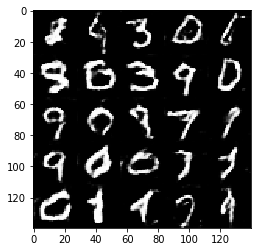

Epoch 4/5... Discriminator Loss: 0.7058... Generator Loss: 2.5875
Epoch 4/5... Discriminator Loss: 0.8028... Generator Loss: 1.2684
Epoch 4/5... Discriminator Loss: 0.6728... Generator Loss: 2.2252
Epoch 4/5... Discriminator Loss: 0.6783... Generator Loss: 2.3262
Epoch 4/5... Discriminator Loss: 0.7028... Generator Loss: 1.7529
Epoch 4/5... Discriminator Loss: 0.5783... Generator Loss: 2.1537
Epoch 4/5... Discriminator Loss: 0.6611... Generator Loss: 2.2212
Epoch 4/5... Discriminator Loss: 0.7253... Generator Loss: 1.6671
Epoch 4/5... Discriminator Loss: 0.6818... Generator Loss: 1.6475
Epoch 4/5... Discriminator Loss: 0.6606... Generator Loss: 1.6782


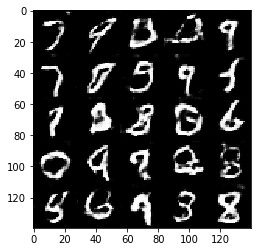

Epoch 4/5... Discriminator Loss: 0.8587... Generator Loss: 1.0607
Epoch 4/5... Discriminator Loss: 0.7682... Generator Loss: 1.3450
Epoch 4/5... Discriminator Loss: 0.7814... Generator Loss: 1.5811
Epoch 4/5... Discriminator Loss: 0.7707... Generator Loss: 1.6931
Epoch 4/5... Discriminator Loss: 0.6764... Generator Loss: 1.7479
Epoch 4/5... Discriminator Loss: 0.7535... Generator Loss: 2.0893
Epoch 4/5... Discriminator Loss: 0.7719... Generator Loss: 2.4424
Epoch 4/5... Discriminator Loss: 0.7283... Generator Loss: 2.2371
Epoch 4/5... Discriminator Loss: 0.8131... Generator Loss: 2.4571
Epoch 4/5... Discriminator Loss: 0.9408... Generator Loss: 1.5630


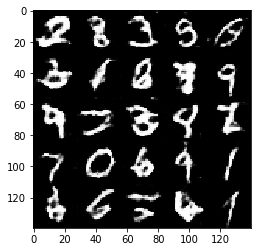

Epoch 4/5... Discriminator Loss: 0.6787... Generator Loss: 1.7156
Epoch 4/5... Discriminator Loss: 0.7329... Generator Loss: 2.6319
Epoch 4/5... Discriminator Loss: 0.7674... Generator Loss: 2.3803
Epoch 4/5... Discriminator Loss: 0.6083... Generator Loss: 2.1016
Epoch 4/5... Discriminator Loss: 0.7078... Generator Loss: 2.1117
Epoch 4/5... Discriminator Loss: 0.8045... Generator Loss: 2.3826
Epoch 4/5... Discriminator Loss: 0.7749... Generator Loss: 2.0743
Epoch 4/5... Discriminator Loss: 0.6856... Generator Loss: 2.7911
Epoch 4/5... Discriminator Loss: 0.7998... Generator Loss: 1.6584
Epoch 4/5... Discriminator Loss: 0.7070... Generator Loss: 2.3310


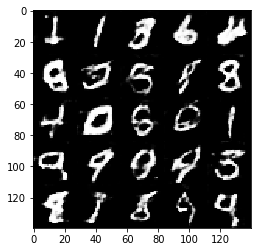

Epoch 4/5... Discriminator Loss: 0.7132... Generator Loss: 3.3506
Epoch 4/5... Discriminator Loss: 0.6976... Generator Loss: 2.7634
Epoch 4/5... Discriminator Loss: 0.6744... Generator Loss: 3.1148
Epoch 4/5... Discriminator Loss: 2.5874... Generator Loss: 0.4800
Epoch 4/5... Discriminator Loss: 0.7236... Generator Loss: 1.8582
Epoch 4/5... Discriminator Loss: 0.5595... Generator Loss: 2.9920
Epoch 4/5... Discriminator Loss: 0.7207... Generator Loss: 2.3667
Epoch 4/5... Discriminator Loss: 0.7360... Generator Loss: 2.5233
Epoch 4/5... Discriminator Loss: 0.8131... Generator Loss: 2.7589
Epoch 4/5... Discriminator Loss: 0.7011... Generator Loss: 1.9214


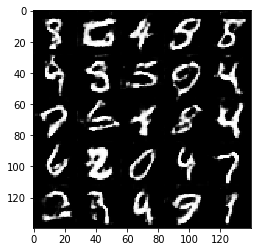

Epoch 4/5... Discriminator Loss: 0.6032... Generator Loss: 2.3828
Epoch 4/5... Discriminator Loss: 0.7251... Generator Loss: 2.0367
Epoch 4/5... Discriminator Loss: 0.7435... Generator Loss: 2.8755
Epoch 4/5... Discriminator Loss: 0.6769... Generator Loss: 2.9889
Epoch 4/5... Discriminator Loss: 0.6486... Generator Loss: 2.3890
Epoch 4/5... Discriminator Loss: 0.6490... Generator Loss: 1.4742
Epoch 4/5... Discriminator Loss: 0.7739... Generator Loss: 2.4284
Epoch 4/5... Discriminator Loss: 0.5815... Generator Loss: 2.4359
Epoch 4/5... Discriminator Loss: 0.6454... Generator Loss: 2.7155
Epoch 4/5... Discriminator Loss: 0.6459... Generator Loss: 1.6265


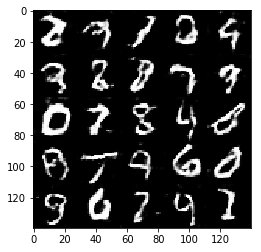

Epoch 5/5... Discriminator Loss: 0.6730... Generator Loss: 3.0514
Epoch 5/5... Discriminator Loss: 0.6246... Generator Loss: 2.2622
Epoch 5/5... Discriminator Loss: 0.6285... Generator Loss: 1.7208
Epoch 5/5... Discriminator Loss: 0.6984... Generator Loss: 2.6635
Epoch 5/5... Discriminator Loss: 0.6603... Generator Loss: 3.2867
Epoch 5/5... Discriminator Loss: 0.7470... Generator Loss: 1.5331
Epoch 5/5... Discriminator Loss: 0.6978... Generator Loss: 2.3739
Epoch 5/5... Discriminator Loss: 0.6841... Generator Loss: 2.7493
Epoch 5/5... Discriminator Loss: 0.8132... Generator Loss: 1.1569
Epoch 5/5... Discriminator Loss: 0.6880... Generator Loss: 2.6136


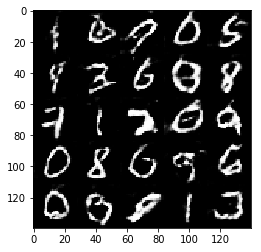

Epoch 5/5... Discriminator Loss: 0.6317... Generator Loss: 2.7162
Epoch 5/5... Discriminator Loss: 0.6588... Generator Loss: 1.9510
Epoch 5/5... Discriminator Loss: 0.9034... Generator Loss: 1.3577
Epoch 5/5... Discriminator Loss: 0.6735... Generator Loss: 2.7641
Epoch 5/5... Discriminator Loss: 0.6513... Generator Loss: 2.1317
Epoch 5/5... Discriminator Loss: 0.6510... Generator Loss: 2.7964
Epoch 5/5... Discriminator Loss: 1.3804... Generator Loss: 4.2356
Epoch 5/5... Discriminator Loss: 0.8862... Generator Loss: 1.1129
Epoch 5/5... Discriminator Loss: 0.7479... Generator Loss: 1.8115
Epoch 5/5... Discriminator Loss: 0.7264... Generator Loss: 1.7697


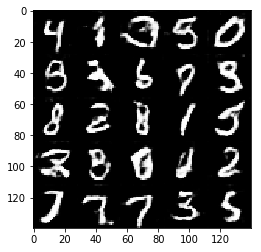

Epoch 5/5... Discriminator Loss: 0.7482... Generator Loss: 2.2501
Epoch 5/5... Discriminator Loss: 0.5884... Generator Loss: 2.3935
Epoch 5/5... Discriminator Loss: 0.6438... Generator Loss: 2.5320
Epoch 5/5... Discriminator Loss: 0.7634... Generator Loss: 2.9610
Epoch 5/5... Discriminator Loss: 0.6620... Generator Loss: 2.9783
Epoch 5/5... Discriminator Loss: 0.6233... Generator Loss: 2.2209
Epoch 5/5... Discriminator Loss: 0.5868... Generator Loss: 3.2103
Epoch 5/5... Discriminator Loss: 0.5951... Generator Loss: 2.2780
Epoch 5/5... Discriminator Loss: 0.7095... Generator Loss: 1.8513
Epoch 5/5... Discriminator Loss: 0.5965... Generator Loss: 2.5058


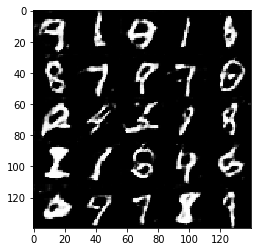

Epoch 5/5... Discriminator Loss: 1.9177... Generator Loss: 0.5849
Epoch 5/5... Discriminator Loss: 0.6424... Generator Loss: 1.9232
Epoch 5/5... Discriminator Loss: 0.7305... Generator Loss: 2.5009
Epoch 5/5... Discriminator Loss: 0.8228... Generator Loss: 1.7587
Epoch 5/5... Discriminator Loss: 0.5876... Generator Loss: 2.3410
Epoch 5/5... Discriminator Loss: 0.7098... Generator Loss: 3.0560
Epoch 5/5... Discriminator Loss: 0.6817... Generator Loss: 2.7498
Epoch 5/5... Discriminator Loss: 0.7256... Generator Loss: 1.2449
Epoch 5/5... Discriminator Loss: 0.7116... Generator Loss: 3.5796
Epoch 5/5... Discriminator Loss: 0.5058... Generator Loss: 2.9877


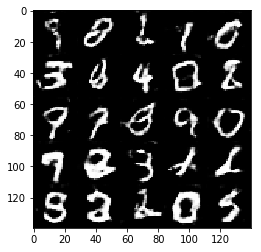

Epoch 5/5... Discriminator Loss: 0.6879... Generator Loss: 2.3979
Epoch 5/5... Discriminator Loss: 0.6390... Generator Loss: 2.6634
Epoch 5/5... Discriminator Loss: 0.6687... Generator Loss: 2.1845
Epoch 5/5... Discriminator Loss: 0.7814... Generator Loss: 2.9876
Epoch 5/5... Discriminator Loss: 0.7762... Generator Loss: 1.9204
Epoch 5/5... Discriminator Loss: 0.5605... Generator Loss: 2.0957
Epoch 5/5... Discriminator Loss: 0.6846... Generator Loss: 2.3608
Epoch 5/5... Discriminator Loss: 0.6742... Generator Loss: 2.5278
Epoch 5/5... Discriminator Loss: 0.6423... Generator Loss: 3.3462
Epoch 5/5... Discriminator Loss: 0.6889... Generator Loss: 2.8229


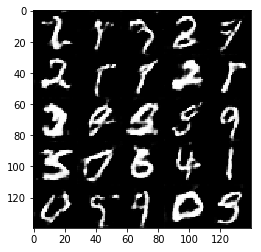

Epoch 5/5... Discriminator Loss: 0.7491... Generator Loss: 2.3075
Epoch 5/5... Discriminator Loss: 0.6461... Generator Loss: 2.3964
Epoch 5/5... Discriminator Loss: 0.5858... Generator Loss: 2.8867
Epoch 5/5... Discriminator Loss: 0.6266... Generator Loss: 2.5195
Epoch 5/5... Discriminator Loss: 0.6176... Generator Loss: 2.3030
Epoch 5/5... Discriminator Loss: 0.6869... Generator Loss: 1.8386
Epoch 5/5... Discriminator Loss: 0.7200... Generator Loss: 2.4538
Epoch 5/5... Discriminator Loss: 0.7522... Generator Loss: 2.4424
Epoch 5/5... Discriminator Loss: 0.6525... Generator Loss: 1.9302
Epoch 5/5... Discriminator Loss: 0.6105... Generator Loss: 3.6721


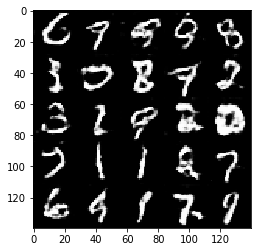

Epoch 5/5... Discriminator Loss: 0.5229... Generator Loss: 2.4121
Epoch 5/5... Discriminator Loss: 0.7588... Generator Loss: 2.9771
Epoch 5/5... Discriminator Loss: 1.7471... Generator Loss: 0.7916
Epoch 5/5... Discriminator Loss: 0.6475... Generator Loss: 2.9476
Epoch 5/5... Discriminator Loss: 0.6652... Generator Loss: 1.5434
Epoch 5/5... Discriminator Loss: 0.8028... Generator Loss: 1.9547
Epoch 5/5... Discriminator Loss: 0.7708... Generator Loss: 3.8571
Epoch 5/5... Discriminator Loss: 0.7893... Generator Loss: 2.0393
Epoch 5/5... Discriminator Loss: 0.5686... Generator Loss: 2.4950
Epoch 5/5... Discriminator Loss: 0.6088... Generator Loss: 2.2250


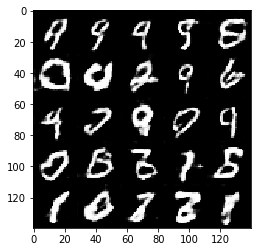

Epoch 5/5... Discriminator Loss: 0.6892... Generator Loss: 2.5672
Epoch 5/5... Discriminator Loss: 0.5829... Generator Loss: 2.3672
Epoch 5/5... Discriminator Loss: 0.6256... Generator Loss: 2.9305
Epoch 5/5... Discriminator Loss: 0.7519... Generator Loss: 2.2645
Epoch 5/5... Discriminator Loss: 0.7719... Generator Loss: 3.5852
Epoch 5/5... Discriminator Loss: 0.5675... Generator Loss: 2.2840
Epoch 5/5... Discriminator Loss: 0.6887... Generator Loss: 2.9845
Epoch 5/5... Discriminator Loss: 0.7664... Generator Loss: 1.3977
Epoch 5/5... Discriminator Loss: 0.6612... Generator Loss: 2.6186
Epoch 5/5... Discriminator Loss: 0.5811... Generator Loss: 2.5816


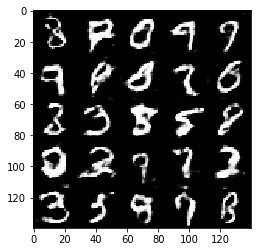

Epoch 5/5... Discriminator Loss: 0.9174... Generator Loss: 1.5717
Epoch 5/5... Discriminator Loss: 0.6658... Generator Loss: 2.5108
Epoch 5/5... Discriminator Loss: 0.6231... Generator Loss: 2.0367
Epoch 5/5... Discriminator Loss: 0.5698... Generator Loss: 2.8025
Epoch 5/5... Discriminator Loss: 0.5406... Generator Loss: 2.5824
Epoch 5/5... Discriminator Loss: 0.7961... Generator Loss: 2.2194
Epoch 5/5... Discriminator Loss: 0.6348... Generator Loss: 3.1911
Epoch 5/5... Discriminator Loss: 0.5789... Generator Loss: 3.1102
Epoch 5/5... Discriminator Loss: 0.5761... Generator Loss: 3.0214
Epoch 5/5... Discriminator Loss: 0.6158... Generator Loss: 2.3539


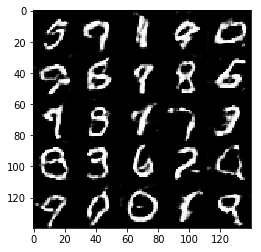

Epoch 5/5... Discriminator Loss: 0.7701... Generator Loss: 1.2485
Epoch 5/5... Discriminator Loss: 0.7862... Generator Loss: 3.0681
Epoch 5/5... Discriminator Loss: 1.0874... Generator Loss: 3.0643
Epoch 5/5... Discriminator Loss: 1.0273... Generator Loss: 2.6468
Epoch 5/5... Discriminator Loss: 0.6783... Generator Loss: 2.9852
Epoch 5/5... Discriminator Loss: 0.5658... Generator Loss: 2.0984
Epoch 5/5... Discriminator Loss: 0.6286... Generator Loss: 2.1543
Epoch 5/5... Discriminator Loss: 0.8136... Generator Loss: 2.3950
Epoch 5/5... Discriminator Loss: 0.7390... Generator Loss: 1.8018
Epoch 5/5... Discriminator Loss: 0.6508... Generator Loss: 2.6709


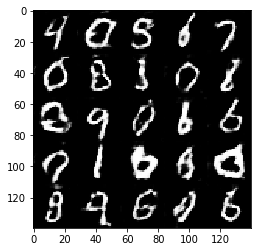

Epoch 5/5... Discriminator Loss: 0.6357... Generator Loss: 2.7860
Epoch 5/5... Discriminator Loss: 0.6703... Generator Loss: 2.5906
Epoch 5/5... Discriminator Loss: 0.6103... Generator Loss: 2.5326
Epoch 5/5... Discriminator Loss: 0.8318... Generator Loss: 3.3468
Epoch 5/5... Discriminator Loss: 0.5845... Generator Loss: 3.3031
Epoch 5/5... Discriminator Loss: 0.6342... Generator Loss: 2.6826
Epoch 5/5... Discriminator Loss: 0.6932... Generator Loss: 2.3443
Epoch 5/5... Discriminator Loss: 1.2102... Generator Loss: 3.6216
Epoch 5/5... Discriminator Loss: 0.6014... Generator Loss: 2.5381
Epoch 5/5... Discriminator Loss: 0.9516... Generator Loss: 1.7274


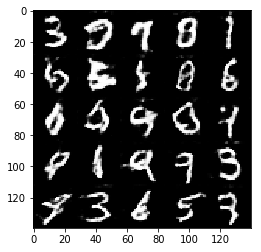

Epoch 5/5... Discriminator Loss: 0.6018... Generator Loss: 2.6366
Epoch 5/5... Discriminator Loss: 0.6186... Generator Loss: 1.8363
Epoch 5/5... Discriminator Loss: 0.5773... Generator Loss: 2.2698
Epoch 5/5... Discriminator Loss: 0.6839... Generator Loss: 1.9803
Epoch 5/5... Discriminator Loss: 0.7120... Generator Loss: 2.5512
Epoch 5/5... Discriminator Loss: 0.6552... Generator Loss: 2.5871
Epoch 5/5... Discriminator Loss: 0.5287... Generator Loss: 2.4909
Epoch 5/5... Discriminator Loss: 0.7846... Generator Loss: 3.3712
Epoch 5/5... Discriminator Loss: 0.7361... Generator Loss: 2.2121
Epoch 5/5... Discriminator Loss: 0.6266... Generator Loss: 2.0256


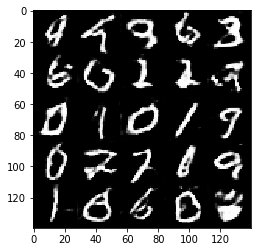

Epoch 5/5... Discriminator Loss: 0.7905... Generator Loss: 3.3762
Epoch 5/5... Discriminator Loss: 0.6246... Generator Loss: 2.9570
Epoch 5/5... Discriminator Loss: 0.6363... Generator Loss: 2.1329
Epoch 5/5... Discriminator Loss: 0.7564... Generator Loss: 2.6084
Epoch 5/5... Discriminator Loss: 0.7615... Generator Loss: 3.7452
Epoch 5/5... Discriminator Loss: 0.8273... Generator Loss: 2.6031
Epoch 5/5... Discriminator Loss: 0.6717... Generator Loss: 3.0900
Epoch 5/5... Discriminator Loss: 0.5679... Generator Loss: 2.0491
Epoch 5/5... Discriminator Loss: 0.7478... Generator Loss: 2.9898
Epoch 5/5... Discriminator Loss: 0.6359... Generator Loss: 4.1094


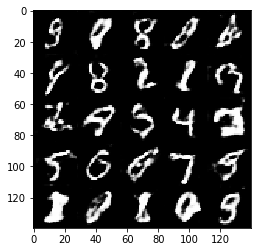

Epoch 5/5... Discriminator Loss: 0.7334... Generator Loss: 1.7115
Epoch 5/5... Discriminator Loss: 0.6805... Generator Loss: 3.4205
Epoch 5/5... Discriminator Loss: 0.7504... Generator Loss: 3.1588
Epoch 5/5... Discriminator Loss: 0.6281... Generator Loss: 2.2680
Epoch 5/5... Discriminator Loss: 0.8824... Generator Loss: 3.0130
Epoch 5/5... Discriminator Loss: 0.8130... Generator Loss: 1.3562
Epoch 5/5... Discriminator Loss: 0.6923... Generator Loss: 1.7354
Epoch 5/5... Discriminator Loss: 0.6064... Generator Loss: 2.4192
Epoch 5/5... Discriminator Loss: 0.7543... Generator Loss: 2.3183
Epoch 5/5... Discriminator Loss: 0.6184... Generator Loss: 2.7224


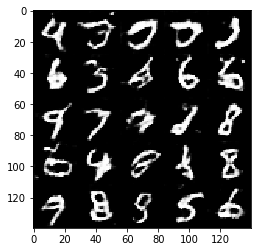

Epoch 5/5... Discriminator Loss: 0.8597... Generator Loss: 1.7579
Epoch 5/5... Discriminator Loss: 0.7072... Generator Loss: 2.3308
Epoch 5/5... Discriminator Loss: 0.5259... Generator Loss: 3.2492
Epoch 5/5... Discriminator Loss: 0.6197... Generator Loss: 2.3318
Epoch 5/5... Discriminator Loss: 0.6774... Generator Loss: 2.0341
Epoch 5/5... Discriminator Loss: 0.7120... Generator Loss: 2.9996
Epoch 5/5... Discriminator Loss: 0.8034... Generator Loss: 2.1528
Epoch 5/5... Discriminator Loss: 0.6067... Generator Loss: 3.1913
Epoch 5/5... Discriminator Loss: 1.5101... Generator Loss: 1.1291
Epoch 5/5... Discriminator Loss: 0.6114... Generator Loss: 2.0015


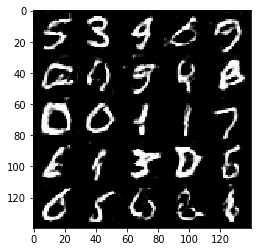

Epoch 5/5... Discriminator Loss: 0.6537... Generator Loss: 2.4067
Epoch 5/5... Discriminator Loss: 0.6723... Generator Loss: 2.1112
Epoch 5/5... Discriminator Loss: 0.6717... Generator Loss: 1.6007
Epoch 5/5... Discriminator Loss: 0.6313... Generator Loss: 3.3657
Epoch 5/5... Discriminator Loss: 0.6519... Generator Loss: 2.4226
Epoch 5/5... Discriminator Loss: 0.5444... Generator Loss: 2.9330
Epoch 5/5... Discriminator Loss: 0.5862... Generator Loss: 3.5936
Epoch 5/5... Discriminator Loss: 0.5960... Generator Loss: 2.9653
Epoch 5/5... Discriminator Loss: 0.5988... Generator Loss: 3.1665
Epoch 5/5... Discriminator Loss: 0.5374... Generator Loss: 2.7370


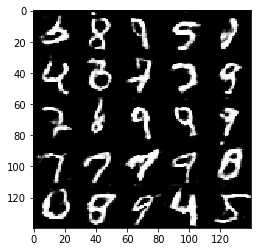

Epoch 5/5... Discriminator Loss: 0.6683... Generator Loss: 1.7689
Epoch 5/5... Discriminator Loss: 0.6329... Generator Loss: 3.6704
Epoch 5/5... Discriminator Loss: 0.7868... Generator Loss: 1.6906
Epoch 5/5... Discriminator Loss: 0.7127... Generator Loss: 3.3503
Epoch 5/5... Discriminator Loss: 0.7136... Generator Loss: 2.7318
Epoch 5/5... Discriminator Loss: 1.1931... Generator Loss: 4.8867
Epoch 5/5... Discriminator Loss: 0.9687... Generator Loss: 3.8782
Epoch 5/5... Discriminator Loss: 0.7063... Generator Loss: 2.5446
Epoch 5/5... Discriminator Loss: 0.6165... Generator Loss: 2.5211
Epoch 5/5... Discriminator Loss: 0.8618... Generator Loss: 3.1614


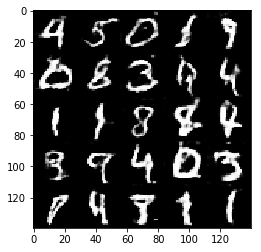

Epoch 5/5... Discriminator Loss: 0.5463... Generator Loss: 3.1848
Epoch 5/5... Discriminator Loss: 0.9534... Generator Loss: 1.9661
Epoch 5/5... Discriminator Loss: 0.6682... Generator Loss: 2.8413
Epoch 5/5... Discriminator Loss: 0.7237... Generator Loss: 1.9590
Epoch 5/5... Discriminator Loss: 0.6825... Generator Loss: 1.5405
Epoch 5/5... Discriminator Loss: 0.7781... Generator Loss: 2.0625
Epoch 5/5... Discriminator Loss: 0.7578... Generator Loss: 1.9983
Epoch 5/5... Discriminator Loss: 0.8152... Generator Loss: 2.3064
Epoch 5/5... Discriminator Loss: 0.6718... Generator Loss: 1.9946
Epoch 5/5... Discriminator Loss: 0.7150... Generator Loss: 1.9944


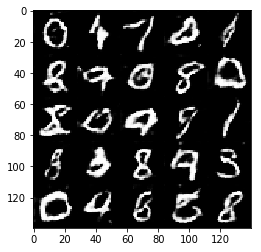

Epoch 5/5... Discriminator Loss: 0.6075... Generator Loss: 1.4023
Epoch 5/5... Discriminator Loss: 0.6696... Generator Loss: 1.9951
Epoch 5/5... Discriminator Loss: 0.6533... Generator Loss: 2.4413
Epoch 5/5... Discriminator Loss: 0.8488... Generator Loss: 1.7410
Epoch 5/5... Discriminator Loss: 0.6681... Generator Loss: 1.3919
Epoch 5/5... Discriminator Loss: 0.7052... Generator Loss: 2.2496
Epoch 5/5... Discriminator Loss: 0.7434... Generator Loss: 2.2539


In [15]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Discriminator Loss: 0.9472... Generator Loss: 2.1614
Epoch 1/2... Discriminator Loss: 1.9095... Generator Loss: 0.6176
Epoch 1/2... Discriminator Loss: 0.9277... Generator Loss: 2.5319
Epoch 1/2... Discriminator Loss: 1.0260... Generator Loss: 2.3705
Epoch 1/2... Discriminator Loss: 1.6402... Generator Loss: 1.2342
Epoch 1/2... Discriminator Loss: 2.1283... Generator Loss: 0.5272
Epoch 1/2... Discriminator Loss: 1.1333... Generator Loss: 4.3287
Epoch 1/2... Discriminator Loss: 1.0682... Generator Loss: 1.7071
Epoch 1/2... Discriminator Loss: 1.0132... Generator Loss: 1.7653
Epoch 1/2... Discriminator Loss: 0.9003... Generator Loss: 1.4157


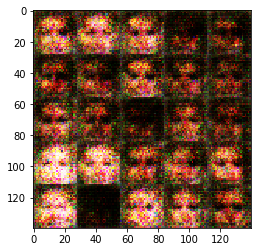

Epoch 1/2... Discriminator Loss: 1.0535... Generator Loss: 1.3390
Epoch 1/2... Discriminator Loss: 1.0773... Generator Loss: 1.2080
Epoch 1/2... Discriminator Loss: 1.0267... Generator Loss: 2.5822
Epoch 1/2... Discriminator Loss: 0.7797... Generator Loss: 2.0038
Epoch 1/2... Discriminator Loss: 0.9953... Generator Loss: 2.5389
Epoch 1/2... Discriminator Loss: 1.1538... Generator Loss: 1.1471
Epoch 1/2... Discriminator Loss: 0.9660... Generator Loss: 1.1617
Epoch 1/2... Discriminator Loss: 0.8838... Generator Loss: 1.8944
Epoch 1/2... Discriminator Loss: 2.2287... Generator Loss: 0.5555
Epoch 1/2... Discriminator Loss: 0.7805... Generator Loss: 1.5942


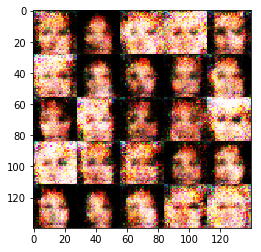

Epoch 1/2... Discriminator Loss: 1.0569... Generator Loss: 1.5327
Epoch 1/2... Discriminator Loss: 0.7897... Generator Loss: 1.9522
Epoch 1/2... Discriminator Loss: 1.4510... Generator Loss: 2.9610
Epoch 1/2... Discriminator Loss: 1.2771... Generator Loss: 0.8316
Epoch 1/2... Discriminator Loss: 0.8942... Generator Loss: 2.3350
Epoch 1/2... Discriminator Loss: 1.0723... Generator Loss: 1.2100
Epoch 1/2... Discriminator Loss: 1.1318... Generator Loss: 0.9154
Epoch 1/2... Discriminator Loss: 1.0164... Generator Loss: 2.4290
Epoch 1/2... Discriminator Loss: 1.3082... Generator Loss: 0.8083
Epoch 1/2... Discriminator Loss: 1.2279... Generator Loss: 2.4841


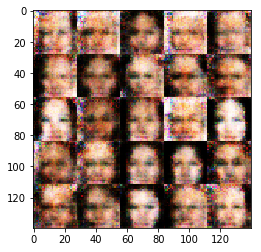

Epoch 1/2... Discriminator Loss: 1.5571... Generator Loss: 0.7173
Epoch 1/2... Discriminator Loss: 0.9456... Generator Loss: 1.6267
Epoch 1/2... Discriminator Loss: 1.9307... Generator Loss: 0.6246
Epoch 1/2... Discriminator Loss: 1.1614... Generator Loss: 1.8207
Epoch 1/2... Discriminator Loss: 1.2405... Generator Loss: 1.0086
Epoch 1/2... Discriminator Loss: 1.7136... Generator Loss: 2.4594
Epoch 1/2... Discriminator Loss: 1.2877... Generator Loss: 1.4629
Epoch 1/2... Discriminator Loss: 1.0784... Generator Loss: 1.3167
Epoch 1/2... Discriminator Loss: 1.0491... Generator Loss: 1.7415
Epoch 1/2... Discriminator Loss: 1.1849... Generator Loss: 0.9127


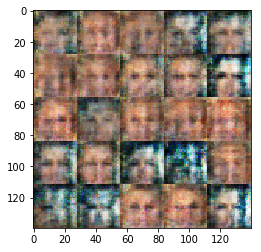

Epoch 1/2... Discriminator Loss: 1.2020... Generator Loss: 1.5474
Epoch 1/2... Discriminator Loss: 1.1388... Generator Loss: 0.9117
Epoch 1/2... Discriminator Loss: 1.0719... Generator Loss: 1.4641
Epoch 1/2... Discriminator Loss: 1.0842... Generator Loss: 1.8562
Epoch 1/2... Discriminator Loss: 1.0044... Generator Loss: 1.6554
Epoch 1/2... Discriminator Loss: 1.0642... Generator Loss: 1.7611
Epoch 1/2... Discriminator Loss: 1.2821... Generator Loss: 0.7759
Epoch 1/2... Discriminator Loss: 1.3096... Generator Loss: 0.9676
Epoch 1/2... Discriminator Loss: 1.2021... Generator Loss: 1.1383
Epoch 1/2... Discriminator Loss: 1.3438... Generator Loss: 1.3218


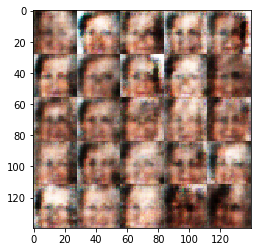

Epoch 1/2... Discriminator Loss: 1.7293... Generator Loss: 1.0976
Epoch 1/2... Discriminator Loss: 1.4507... Generator Loss: 0.7895
Epoch 1/2... Discriminator Loss: 1.0449... Generator Loss: 1.1355
Epoch 1/2... Discriminator Loss: 1.1427... Generator Loss: 1.1516
Epoch 1/2... Discriminator Loss: 1.4004... Generator Loss: 0.6183
Epoch 1/2... Discriminator Loss: 1.5494... Generator Loss: 0.7347
Epoch 1/2... Discriminator Loss: 0.8655... Generator Loss: 1.2973
Epoch 1/2... Discriminator Loss: 1.0703... Generator Loss: 1.2049
Epoch 1/2... Discriminator Loss: 1.4005... Generator Loss: 1.0119
Epoch 1/2... Discriminator Loss: 1.6174... Generator Loss: 1.4992


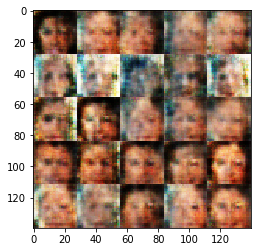

Epoch 1/2... Discriminator Loss: 1.0547... Generator Loss: 1.2576
Epoch 1/2... Discriminator Loss: 1.0442... Generator Loss: 0.9491
Epoch 1/2... Discriminator Loss: 1.0984... Generator Loss: 1.5227
Epoch 1/2... Discriminator Loss: 1.0921... Generator Loss: 1.1717
Epoch 1/2... Discriminator Loss: 1.3876... Generator Loss: 0.9504
Epoch 1/2... Discriminator Loss: 1.2184... Generator Loss: 0.8969
Epoch 1/2... Discriminator Loss: 1.1501... Generator Loss: 1.0237
Epoch 1/2... Discriminator Loss: 1.0875... Generator Loss: 1.0325
Epoch 1/2... Discriminator Loss: 1.1881... Generator Loss: 1.0680
Epoch 1/2... Discriminator Loss: 1.3398... Generator Loss: 0.9459


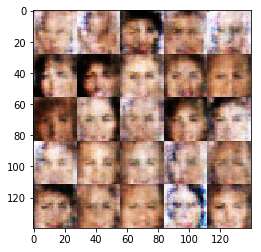

Epoch 1/2... Discriminator Loss: 1.6082... Generator Loss: 0.7144
Epoch 1/2... Discriminator Loss: 1.1498... Generator Loss: 1.2005
Epoch 1/2... Discriminator Loss: 1.3004... Generator Loss: 1.1448
Epoch 1/2... Discriminator Loss: 1.1800... Generator Loss: 0.8762
Epoch 1/2... Discriminator Loss: 1.3163... Generator Loss: 0.7967
Epoch 1/2... Discriminator Loss: 1.1673... Generator Loss: 1.3496
Epoch 1/2... Discriminator Loss: 1.2274... Generator Loss: 1.0668
Epoch 1/2... Discriminator Loss: 1.2672... Generator Loss: 1.0510
Epoch 1/2... Discriminator Loss: 1.2981... Generator Loss: 0.8676
Epoch 1/2... Discriminator Loss: 1.1060... Generator Loss: 1.0575


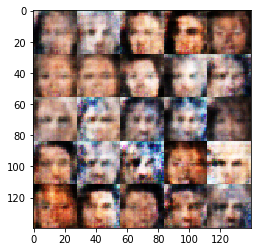

Epoch 1/2... Discriminator Loss: 1.4109... Generator Loss: 1.1348
Epoch 1/2... Discriminator Loss: 1.5436... Generator Loss: 1.8239
Epoch 1/2... Discriminator Loss: 1.0077... Generator Loss: 0.9944
Epoch 1/2... Discriminator Loss: 1.2479... Generator Loss: 1.3148
Epoch 1/2... Discriminator Loss: 1.2974... Generator Loss: 1.3898
Epoch 1/2... Discriminator Loss: 1.2983... Generator Loss: 0.8678
Epoch 1/2... Discriminator Loss: 0.9975... Generator Loss: 1.2613
Epoch 1/2... Discriminator Loss: 1.1894... Generator Loss: 1.1487
Epoch 1/2... Discriminator Loss: 1.3728... Generator Loss: 0.9612
Epoch 1/2... Discriminator Loss: 1.1452... Generator Loss: 0.9573


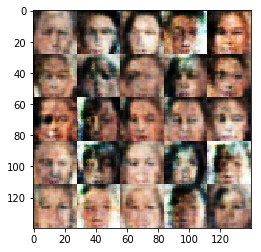

Epoch 1/2... Discriminator Loss: 1.2306... Generator Loss: 0.8492
Epoch 1/2... Discriminator Loss: 1.4209... Generator Loss: 0.9200
Epoch 1/2... Discriminator Loss: 1.1433... Generator Loss: 1.0686
Epoch 1/2... Discriminator Loss: 1.3993... Generator Loss: 1.0352
Epoch 1/2... Discriminator Loss: 1.3890... Generator Loss: 0.8784
Epoch 1/2... Discriminator Loss: 1.2042... Generator Loss: 0.9628
Epoch 1/2... Discriminator Loss: 1.0349... Generator Loss: 0.9408
Epoch 1/2... Discriminator Loss: 1.3272... Generator Loss: 0.7762
Epoch 1/2... Discriminator Loss: 1.3753... Generator Loss: 1.2732
Epoch 1/2... Discriminator Loss: 1.1873... Generator Loss: 0.9561


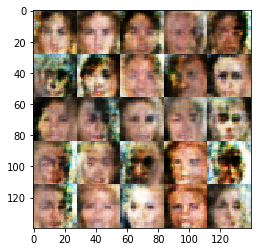

Epoch 1/2... Discriminator Loss: 1.2681... Generator Loss: 1.3292
Epoch 1/2... Discriminator Loss: 1.4111... Generator Loss: 0.7727
Epoch 1/2... Discriminator Loss: 1.4224... Generator Loss: 0.9535
Epoch 1/2... Discriminator Loss: 1.3753... Generator Loss: 0.9215
Epoch 1/2... Discriminator Loss: 1.2860... Generator Loss: 1.4037
Epoch 1/2... Discriminator Loss: 1.1874... Generator Loss: 1.1404
Epoch 1/2... Discriminator Loss: 1.3281... Generator Loss: 0.8463
Epoch 1/2... Discriminator Loss: 1.2481... Generator Loss: 0.9306
Epoch 1/2... Discriminator Loss: 1.4012... Generator Loss: 0.8150
Epoch 1/2... Discriminator Loss: 1.2820... Generator Loss: 0.9255


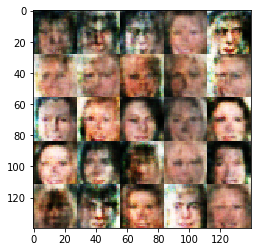

Epoch 1/2... Discriminator Loss: 1.2730... Generator Loss: 0.9839
Epoch 1/2... Discriminator Loss: 1.4913... Generator Loss: 0.8751
Epoch 1/2... Discriminator Loss: 1.4191... Generator Loss: 1.0476
Epoch 1/2... Discriminator Loss: 1.3466... Generator Loss: 1.0035
Epoch 1/2... Discriminator Loss: 1.2786... Generator Loss: 1.0480
Epoch 1/2... Discriminator Loss: 1.1434... Generator Loss: 1.0476
Epoch 1/2... Discriminator Loss: 1.3571... Generator Loss: 1.1134
Epoch 1/2... Discriminator Loss: 1.2075... Generator Loss: 1.1531
Epoch 1/2... Discriminator Loss: 1.3262... Generator Loss: 0.7572
Epoch 1/2... Discriminator Loss: 1.3196... Generator Loss: 1.3750


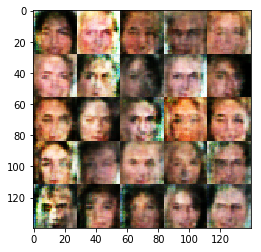

Epoch 1/2... Discriminator Loss: 1.2381... Generator Loss: 0.9110
Epoch 1/2... Discriminator Loss: 1.3251... Generator Loss: 0.9220
Epoch 1/2... Discriminator Loss: 1.4753... Generator Loss: 0.7299
Epoch 1/2... Discriminator Loss: 1.2250... Generator Loss: 1.0712
Epoch 1/2... Discriminator Loss: 1.2734... Generator Loss: 1.0812
Epoch 1/2... Discriminator Loss: 1.1684... Generator Loss: 1.4677
Epoch 1/2... Discriminator Loss: 1.3304... Generator Loss: 0.7744
Epoch 1/2... Discriminator Loss: 1.2566... Generator Loss: 0.7605
Epoch 1/2... Discriminator Loss: 1.1318... Generator Loss: 0.8971
Epoch 1/2... Discriminator Loss: 1.2405... Generator Loss: 0.9905


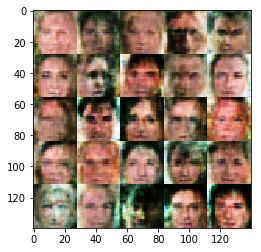

Epoch 1/2... Discriminator Loss: 1.3051... Generator Loss: 0.9175
Epoch 1/2... Discriminator Loss: 1.1407... Generator Loss: 0.9632
Epoch 1/2... Discriminator Loss: 1.1695... Generator Loss: 1.0684
Epoch 1/2... Discriminator Loss: 1.3083... Generator Loss: 0.8168
Epoch 1/2... Discriminator Loss: 1.1534... Generator Loss: 1.0778
Epoch 1/2... Discriminator Loss: 1.3296... Generator Loss: 0.9807
Epoch 1/2... Discriminator Loss: 1.2516... Generator Loss: 1.1114
Epoch 1/2... Discriminator Loss: 1.3051... Generator Loss: 0.6713
Epoch 1/2... Discriminator Loss: 1.1807... Generator Loss: 0.9898
Epoch 1/2... Discriminator Loss: 1.1229... Generator Loss: 1.3035


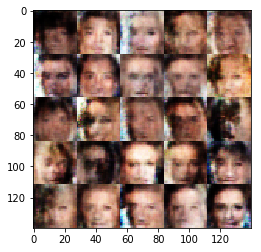

Epoch 1/2... Discriminator Loss: 1.1831... Generator Loss: 1.5387
Epoch 1/2... Discriminator Loss: 1.1940... Generator Loss: 1.2396
Epoch 1/2... Discriminator Loss: 1.2113... Generator Loss: 1.2804
Epoch 1/2... Discriminator Loss: 1.3377... Generator Loss: 1.0758
Epoch 1/2... Discriminator Loss: 1.3146... Generator Loss: 0.8391
Epoch 1/2... Discriminator Loss: 1.2784... Generator Loss: 1.1169
Epoch 1/2... Discriminator Loss: 1.4568... Generator Loss: 0.6483
Epoch 1/2... Discriminator Loss: 1.2565... Generator Loss: 0.9454
Epoch 1/2... Discriminator Loss: 1.1921... Generator Loss: 1.0398
Epoch 1/2... Discriminator Loss: 1.3178... Generator Loss: 1.0019


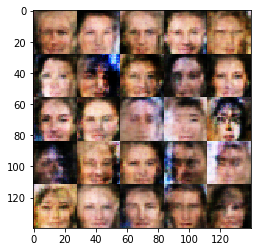

Epoch 1/2... Discriminator Loss: 1.1692... Generator Loss: 1.0514
Epoch 1/2... Discriminator Loss: 1.2093... Generator Loss: 1.0418
Epoch 1/2... Discriminator Loss: 1.4333... Generator Loss: 0.6772
Epoch 1/2... Discriminator Loss: 1.2248... Generator Loss: 0.9811
Epoch 1/2... Discriminator Loss: 1.5064... Generator Loss: 0.7981
Epoch 1/2... Discriminator Loss: 1.1175... Generator Loss: 0.9941
Epoch 1/2... Discriminator Loss: 1.0924... Generator Loss: 1.1981
Epoch 1/2... Discriminator Loss: 1.2808... Generator Loss: 0.6785
Epoch 1/2... Discriminator Loss: 1.2624... Generator Loss: 0.9403
Epoch 1/2... Discriminator Loss: 1.2365... Generator Loss: 1.0453


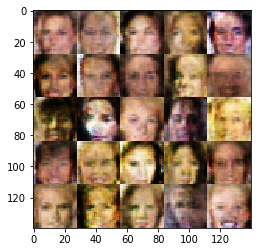

Epoch 1/2... Discriminator Loss: 1.2311... Generator Loss: 0.9323
Epoch 1/2... Discriminator Loss: 1.2808... Generator Loss: 0.9190
Epoch 1/2... Discriminator Loss: 1.1010... Generator Loss: 0.7747
Epoch 1/2... Discriminator Loss: 1.2728... Generator Loss: 0.6848
Epoch 1/2... Discriminator Loss: 1.1208... Generator Loss: 1.0732
Epoch 1/2... Discriminator Loss: 1.2362... Generator Loss: 0.9005
Epoch 1/2... Discriminator Loss: 1.0683... Generator Loss: 0.9414
Epoch 1/2... Discriminator Loss: 1.2555... Generator Loss: 1.3003
Epoch 1/2... Discriminator Loss: 1.3699... Generator Loss: 0.6815
Epoch 1/2... Discriminator Loss: 1.2335... Generator Loss: 0.8576


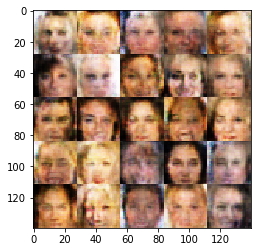

Epoch 1/2... Discriminator Loss: 1.2819... Generator Loss: 0.8633
Epoch 1/2... Discriminator Loss: 1.2648... Generator Loss: 0.7403
Epoch 1/2... Discriminator Loss: 1.1476... Generator Loss: 1.2748
Epoch 1/2... Discriminator Loss: 1.1773... Generator Loss: 1.0539
Epoch 1/2... Discriminator Loss: 1.2425... Generator Loss: 1.1029
Epoch 1/2... Discriminator Loss: 1.2612... Generator Loss: 0.8173
Epoch 1/2... Discriminator Loss: 1.1734... Generator Loss: 1.0014
Epoch 1/2... Discriminator Loss: 1.1906... Generator Loss: 1.1863
Epoch 1/2... Discriminator Loss: 1.3915... Generator Loss: 0.7400
Epoch 1/2... Discriminator Loss: 1.2662... Generator Loss: 1.3483


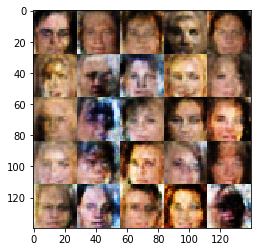

Epoch 1/2... Discriminator Loss: 1.3102... Generator Loss: 0.9354
Epoch 1/2... Discriminator Loss: 1.2288... Generator Loss: 0.7716
Epoch 1/2... Discriminator Loss: 1.2315... Generator Loss: 1.0207
Epoch 1/2... Discriminator Loss: 1.4083... Generator Loss: 0.5842
Epoch 1/2... Discriminator Loss: 1.2298... Generator Loss: 0.8772
Epoch 1/2... Discriminator Loss: 1.2378... Generator Loss: 0.8030
Epoch 1/2... Discriminator Loss: 1.1332... Generator Loss: 1.0300
Epoch 1/2... Discriminator Loss: 1.1976... Generator Loss: 1.2544
Epoch 1/2... Discriminator Loss: 1.4054... Generator Loss: 0.6541
Epoch 1/2... Discriminator Loss: 1.5876... Generator Loss: 0.6418


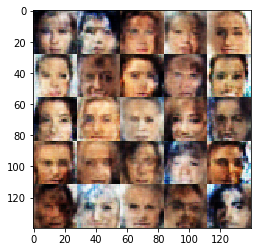

Epoch 1/2... Discriminator Loss: 1.3164... Generator Loss: 0.9613
Epoch 1/2... Discriminator Loss: 1.2024... Generator Loss: 0.8841
Epoch 1/2... Discriminator Loss: 1.1933... Generator Loss: 0.8801
Epoch 1/2... Discriminator Loss: 1.2443... Generator Loss: 1.0209
Epoch 1/2... Discriminator Loss: 1.1071... Generator Loss: 1.1189
Epoch 1/2... Discriminator Loss: 1.1144... Generator Loss: 1.0848
Epoch 1/2... Discriminator Loss: 1.1002... Generator Loss: 1.1454
Epoch 1/2... Discriminator Loss: 1.4218... Generator Loss: 1.1529
Epoch 1/2... Discriminator Loss: 1.1956... Generator Loss: 0.7852
Epoch 1/2... Discriminator Loss: 1.2010... Generator Loss: 1.0111


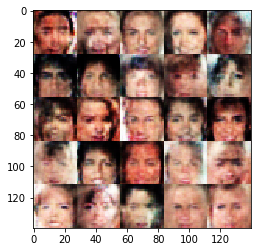

Epoch 1/2... Discriminator Loss: 1.1940... Generator Loss: 0.9765
Epoch 1/2... Discriminator Loss: 1.2539... Generator Loss: 1.0213
Epoch 1/2... Discriminator Loss: 1.1570... Generator Loss: 0.9479
Epoch 1/2... Discriminator Loss: 1.0939... Generator Loss: 1.4057
Epoch 1/2... Discriminator Loss: 1.2685... Generator Loss: 0.7430
Epoch 1/2... Discriminator Loss: 1.1494... Generator Loss: 1.0382
Epoch 1/2... Discriminator Loss: 1.1588... Generator Loss: 1.1964
Epoch 1/2... Discriminator Loss: 1.2092... Generator Loss: 1.0450
Epoch 1/2... Discriminator Loss: 1.2067... Generator Loss: 1.1036
Epoch 1/2... Discriminator Loss: 1.2311... Generator Loss: 1.1169


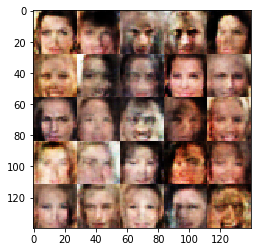

Epoch 1/2... Discriminator Loss: 1.1508... Generator Loss: 1.1148
Epoch 1/2... Discriminator Loss: 1.2788... Generator Loss: 0.7626
Epoch 1/2... Discriminator Loss: 1.3004... Generator Loss: 0.9571
Epoch 1/2... Discriminator Loss: 1.0765... Generator Loss: 1.1648
Epoch 1/2... Discriminator Loss: 1.2284... Generator Loss: 0.7783
Epoch 1/2... Discriminator Loss: 1.3499... Generator Loss: 1.1606
Epoch 1/2... Discriminator Loss: 1.2247... Generator Loss: 1.0976
Epoch 1/2... Discriminator Loss: 1.0888... Generator Loss: 0.9960
Epoch 1/2... Discriminator Loss: 1.2323... Generator Loss: 0.8232
Epoch 1/2... Discriminator Loss: 1.3272... Generator Loss: 1.1504


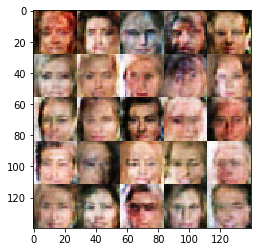

Epoch 1/2... Discriminator Loss: 1.2143... Generator Loss: 1.1945
Epoch 1/2... Discriminator Loss: 1.0830... Generator Loss: 0.8492
Epoch 1/2... Discriminator Loss: 1.2989... Generator Loss: 0.6664
Epoch 1/2... Discriminator Loss: 1.1915... Generator Loss: 0.9708
Epoch 1/2... Discriminator Loss: 1.2711... Generator Loss: 0.8789
Epoch 1/2... Discriminator Loss: 1.1811... Generator Loss: 0.9886
Epoch 1/2... Discriminator Loss: 1.3113... Generator Loss: 0.7612
Epoch 1/2... Discriminator Loss: 1.2096... Generator Loss: 1.0156
Epoch 1/2... Discriminator Loss: 1.2434... Generator Loss: 1.0798
Epoch 1/2... Discriminator Loss: 1.3199... Generator Loss: 0.8259


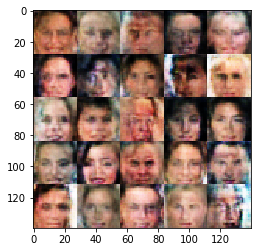

Epoch 1/2... Discriminator Loss: 1.1233... Generator Loss: 0.9467
Epoch 1/2... Discriminator Loss: 1.1847... Generator Loss: 1.2557
Epoch 1/2... Discriminator Loss: 1.2893... Generator Loss: 0.7892
Epoch 1/2... Discriminator Loss: 1.3862... Generator Loss: 1.0827
Epoch 1/2... Discriminator Loss: 1.2582... Generator Loss: 0.8721
Epoch 1/2... Discriminator Loss: 1.2664... Generator Loss: 0.9779
Epoch 1/2... Discriminator Loss: 1.2583... Generator Loss: 0.8736
Epoch 1/2... Discriminator Loss: 1.2140... Generator Loss: 1.1362
Epoch 1/2... Discriminator Loss: 1.1529... Generator Loss: 1.1643
Epoch 1/2... Discriminator Loss: 1.2916... Generator Loss: 0.7829


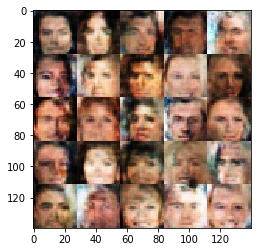

Epoch 1/2... Discriminator Loss: 1.1268... Generator Loss: 1.0886
Epoch 1/2... Discriminator Loss: 1.1826... Generator Loss: 1.0422
Epoch 1/2... Discriminator Loss: 1.1753... Generator Loss: 0.8906
Epoch 1/2... Discriminator Loss: 1.1093... Generator Loss: 0.7977
Epoch 1/2... Discriminator Loss: 1.2898... Generator Loss: 0.9366
Epoch 1/2... Discriminator Loss: 1.2058... Generator Loss: 1.0394
Epoch 1/2... Discriminator Loss: 1.4256... Generator Loss: 0.7072
Epoch 1/2... Discriminator Loss: 1.2061... Generator Loss: 0.8478
Epoch 1/2... Discriminator Loss: 1.2122... Generator Loss: 0.7684
Epoch 1/2... Discriminator Loss: 1.2107... Generator Loss: 0.9492


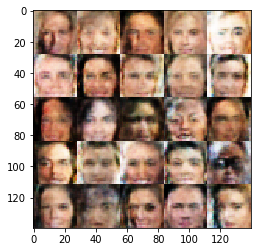

Epoch 1/2... Discriminator Loss: 1.1361... Generator Loss: 1.2277
Epoch 1/2... Discriminator Loss: 1.1517... Generator Loss: 1.3488
Epoch 1/2... Discriminator Loss: 1.1484... Generator Loss: 0.8909
Epoch 1/2... Discriminator Loss: 1.2095... Generator Loss: 0.9384
Epoch 1/2... Discriminator Loss: 1.2684... Generator Loss: 0.8583
Epoch 1/2... Discriminator Loss: 1.1327... Generator Loss: 1.2466
Epoch 1/2... Discriminator Loss: 1.2356... Generator Loss: 0.7346
Epoch 1/2... Discriminator Loss: 1.1025... Generator Loss: 1.1907
Epoch 1/2... Discriminator Loss: 1.0917... Generator Loss: 1.0609
Epoch 1/2... Discriminator Loss: 1.1755... Generator Loss: 1.3775


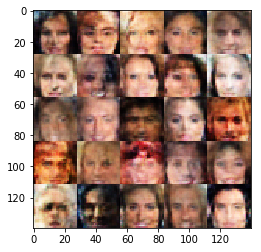

Epoch 1/2... Discriminator Loss: 1.3430... Generator Loss: 1.2370
Epoch 1/2... Discriminator Loss: 1.2831... Generator Loss: 0.7351
Epoch 1/2... Discriminator Loss: 1.0455... Generator Loss: 1.2338
Epoch 1/2... Discriminator Loss: 1.2902... Generator Loss: 0.8273
Epoch 1/2... Discriminator Loss: 1.1350... Generator Loss: 1.0234
Epoch 1/2... Discriminator Loss: 1.1031... Generator Loss: 1.1218
Epoch 1/2... Discriminator Loss: 1.3099... Generator Loss: 1.0314
Epoch 1/2... Discriminator Loss: 1.1809... Generator Loss: 0.9744
Epoch 1/2... Discriminator Loss: 1.0949... Generator Loss: 0.7250
Epoch 1/2... Discriminator Loss: 1.0865... Generator Loss: 0.9835


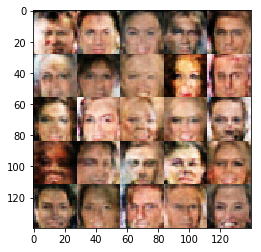

Epoch 1/2... Discriminator Loss: 1.2734... Generator Loss: 0.9618
Epoch 1/2... Discriminator Loss: 1.4108... Generator Loss: 0.6315
Epoch 1/2... Discriminator Loss: 1.1763... Generator Loss: 1.0949
Epoch 1/2... Discriminator Loss: 1.4563... Generator Loss: 1.2530
Epoch 1/2... Discriminator Loss: 1.1647... Generator Loss: 1.0335
Epoch 1/2... Discriminator Loss: 1.1132... Generator Loss: 1.5229
Epoch 1/2... Discriminator Loss: 1.1553... Generator Loss: 0.8987
Epoch 1/2... Discriminator Loss: 1.2712... Generator Loss: 1.0157
Epoch 1/2... Discriminator Loss: 1.1526... Generator Loss: 0.9171
Epoch 1/2... Discriminator Loss: 1.1910... Generator Loss: 1.0730


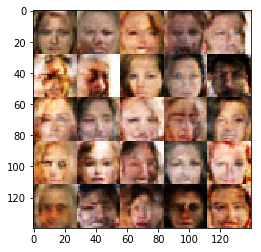

Epoch 1/2... Discriminator Loss: 1.3369... Generator Loss: 0.9961
Epoch 1/2... Discriminator Loss: 1.1437... Generator Loss: 1.3366
Epoch 1/2... Discriminator Loss: 1.2154... Generator Loss: 1.2868
Epoch 1/2... Discriminator Loss: 1.2906... Generator Loss: 0.7129
Epoch 1/2... Discriminator Loss: 1.1984... Generator Loss: 1.5050
Epoch 1/2... Discriminator Loss: 1.1834... Generator Loss: 0.8344
Epoch 1/2... Discriminator Loss: 1.0592... Generator Loss: 1.1177
Epoch 1/2... Discriminator Loss: 1.2203... Generator Loss: 0.9747
Epoch 1/2... Discriminator Loss: 1.2118... Generator Loss: 1.1524
Epoch 1/2... Discriminator Loss: 1.2655... Generator Loss: 0.6977


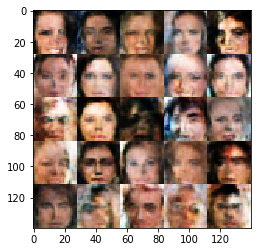

Epoch 1/2... Discriminator Loss: 1.1285... Generator Loss: 1.2382
Epoch 1/2... Discriminator Loss: 1.2037... Generator Loss: 1.2181
Epoch 1/2... Discriminator Loss: 1.1738... Generator Loss: 1.0960
Epoch 1/2... Discriminator Loss: 1.1390... Generator Loss: 1.2769
Epoch 1/2... Discriminator Loss: 1.3856... Generator Loss: 1.1147
Epoch 1/2... Discriminator Loss: 1.2261... Generator Loss: 1.2387
Epoch 1/2... Discriminator Loss: 1.1783... Generator Loss: 1.0477
Epoch 1/2... Discriminator Loss: 1.3456... Generator Loss: 1.0557
Epoch 1/2... Discriminator Loss: 1.2827... Generator Loss: 0.7932
Epoch 1/2... Discriminator Loss: 1.1674... Generator Loss: 1.0184


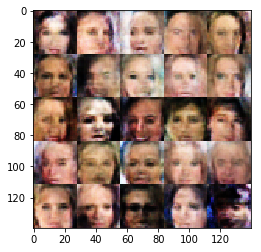

Epoch 1/2... Discriminator Loss: 1.1801... Generator Loss: 0.9570
Epoch 1/2... Discriminator Loss: 1.0619... Generator Loss: 0.8505
Epoch 1/2... Discriminator Loss: 1.2186... Generator Loss: 1.3395
Epoch 1/2... Discriminator Loss: 1.2429... Generator Loss: 1.0901
Epoch 1/2... Discriminator Loss: 1.2741... Generator Loss: 0.8664
Epoch 1/2... Discriminator Loss: 1.2081... Generator Loss: 1.1079
Epoch 1/2... Discriminator Loss: 1.1354... Generator Loss: 1.0033
Epoch 1/2... Discriminator Loss: 1.3471... Generator Loss: 1.4914
Epoch 1/2... Discriminator Loss: 1.1182... Generator Loss: 1.0364
Epoch 1/2... Discriminator Loss: 1.2125... Generator Loss: 1.1415


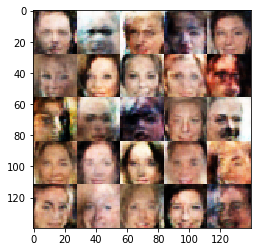

Epoch 1/2... Discriminator Loss: 1.1716... Generator Loss: 1.0000
Epoch 1/2... Discriminator Loss: 1.2770... Generator Loss: 1.2843
Epoch 1/2... Discriminator Loss: 1.1581... Generator Loss: 0.8838
Epoch 1/2... Discriminator Loss: 1.2521... Generator Loss: 0.7925
Epoch 1/2... Discriminator Loss: 1.1716... Generator Loss: 0.8350
Epoch 1/2... Discriminator Loss: 1.1971... Generator Loss: 0.9801
Epoch 1/2... Discriminator Loss: 1.2142... Generator Loss: 0.8060
Epoch 1/2... Discriminator Loss: 1.1161... Generator Loss: 0.7782
Epoch 1/2... Discriminator Loss: 1.0925... Generator Loss: 0.8190
Epoch 1/2... Discriminator Loss: 1.0863... Generator Loss: 0.7930


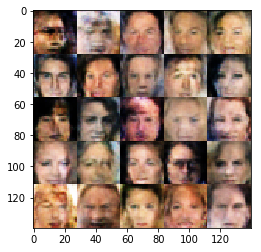

Epoch 1/2... Discriminator Loss: 1.1925... Generator Loss: 0.9629
Epoch 1/2... Discriminator Loss: 1.1309... Generator Loss: 0.9891
Epoch 1/2... Discriminator Loss: 1.2388... Generator Loss: 1.2371
Epoch 1/2... Discriminator Loss: 1.5300... Generator Loss: 1.7101
Epoch 1/2... Discriminator Loss: 1.1212... Generator Loss: 0.9075
Epoch 1/2... Discriminator Loss: 1.1617... Generator Loss: 1.0805
Epoch 1/2... Discriminator Loss: 1.3312... Generator Loss: 0.6682
Epoch 1/2... Discriminator Loss: 1.1198... Generator Loss: 1.1300
Epoch 1/2... Discriminator Loss: 1.2677... Generator Loss: 1.1296
Epoch 1/2... Discriminator Loss: 1.2786... Generator Loss: 0.8237


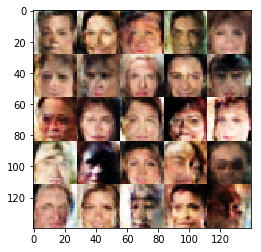

Epoch 1/2... Discriminator Loss: 1.1458... Generator Loss: 0.9622
Epoch 1/2... Discriminator Loss: 1.2839... Generator Loss: 0.8671
Epoch 1/2... Discriminator Loss: 1.1908... Generator Loss: 0.7699
Epoch 1/2... Discriminator Loss: 1.2051... Generator Loss: 0.8822
Epoch 1/2... Discriminator Loss: 1.0082... Generator Loss: 1.1804
Epoch 1/2... Discriminator Loss: 1.1115... Generator Loss: 1.0380
Epoch 1/2... Discriminator Loss: 1.1597... Generator Loss: 0.9120
Epoch 1/2... Discriminator Loss: 1.0956... Generator Loss: 1.1751
Epoch 1/2... Discriminator Loss: 1.1045... Generator Loss: 1.0473
Epoch 1/2... Discriminator Loss: 1.1341... Generator Loss: 1.1493


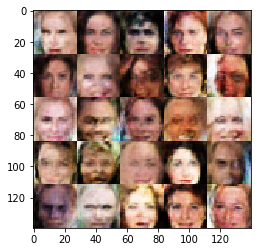

Epoch 1/2... Discriminator Loss: 1.1499... Generator Loss: 0.8368
Epoch 1/2... Discriminator Loss: 1.2661... Generator Loss: 0.6836
Epoch 1/2... Discriminator Loss: 1.1894... Generator Loss: 0.7910
Epoch 1/2... Discriminator Loss: 1.2081... Generator Loss: 0.8139
Epoch 1/2... Discriminator Loss: 1.2428... Generator Loss: 0.8702
Epoch 1/2... Discriminator Loss: 1.1906... Generator Loss: 1.0244
Epoch 1/2... Discriminator Loss: 1.2196... Generator Loss: 0.9950
Epoch 1/2... Discriminator Loss: 1.3258... Generator Loss: 1.2964
Epoch 1/2... Discriminator Loss: 1.3145... Generator Loss: 0.7100
Epoch 1/2... Discriminator Loss: 1.1177... Generator Loss: 0.8512


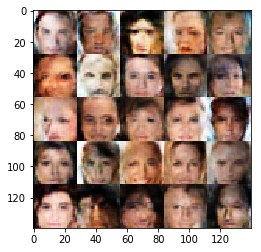

Epoch 1/2... Discriminator Loss: 1.3070... Generator Loss: 1.2823
Epoch 1/2... Discriminator Loss: 1.2923... Generator Loss: 1.3278
Epoch 1/2... Discriminator Loss: 1.1330... Generator Loss: 1.3601
Epoch 1/2... Discriminator Loss: 1.1846... Generator Loss: 1.0829
Epoch 1/2... Discriminator Loss: 1.1905... Generator Loss: 1.3537
Epoch 1/2... Discriminator Loss: 1.0707... Generator Loss: 0.9878
Epoch 1/2... Discriminator Loss: 1.0745... Generator Loss: 1.1999
Epoch 1/2... Discriminator Loss: 1.3099... Generator Loss: 0.7837
Epoch 1/2... Discriminator Loss: 1.2145... Generator Loss: 1.1996
Epoch 1/2... Discriminator Loss: 1.2127... Generator Loss: 0.9356


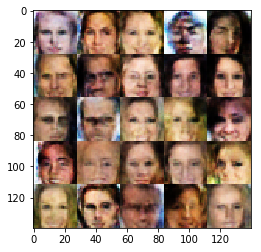

Epoch 1/2... Discriminator Loss: 1.0292... Generator Loss: 1.0688
Epoch 1/2... Discriminator Loss: 1.1699... Generator Loss: 0.9172
Epoch 1/2... Discriminator Loss: 1.1023... Generator Loss: 0.9536
Epoch 1/2... Discriminator Loss: 1.1125... Generator Loss: 0.9238
Epoch 1/2... Discriminator Loss: 1.2744... Generator Loss: 0.9803
Epoch 1/2... Discriminator Loss: 1.3404... Generator Loss: 0.8186
Epoch 1/2... Discriminator Loss: 1.1100... Generator Loss: 0.8909
Epoch 1/2... Discriminator Loss: 1.1677... Generator Loss: 1.1434
Epoch 1/2... Discriminator Loss: 1.0225... Generator Loss: 0.9531
Epoch 1/2... Discriminator Loss: 1.1481... Generator Loss: 1.0735


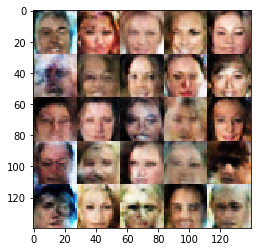

Epoch 1/2... Discriminator Loss: 1.1906... Generator Loss: 1.3033
Epoch 1/2... Discriminator Loss: 1.2960... Generator Loss: 0.7590
Epoch 1/2... Discriminator Loss: 1.1833... Generator Loss: 1.1276
Epoch 1/2... Discriminator Loss: 1.1318... Generator Loss: 1.1647
Epoch 1/2... Discriminator Loss: 1.0917... Generator Loss: 1.0318
Epoch 1/2... Discriminator Loss: 1.2835... Generator Loss: 0.7704
Epoch 1/2... Discriminator Loss: 1.2217... Generator Loss: 1.3122
Epoch 1/2... Discriminator Loss: 1.2392... Generator Loss: 0.8696
Epoch 1/2... Discriminator Loss: 1.0176... Generator Loss: 1.1873
Epoch 1/2... Discriminator Loss: 1.1443... Generator Loss: 1.0354


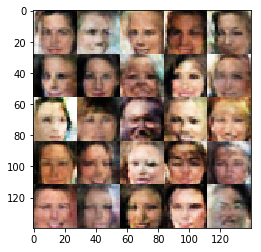

Epoch 1/2... Discriminator Loss: 1.1620... Generator Loss: 1.0288
Epoch 1/2... Discriminator Loss: 1.3250... Generator Loss: 0.9101
Epoch 1/2... Discriminator Loss: 1.1348... Generator Loss: 1.0742
Epoch 1/2... Discriminator Loss: 1.2248... Generator Loss: 0.9102
Epoch 1/2... Discriminator Loss: 1.3962... Generator Loss: 0.5836
Epoch 1/2... Discriminator Loss: 1.1618... Generator Loss: 0.9772
Epoch 1/2... Discriminator Loss: 1.2372... Generator Loss: 0.7317
Epoch 1/2... Discriminator Loss: 1.0683... Generator Loss: 1.0286
Epoch 1/2... Discriminator Loss: 1.3338... Generator Loss: 0.7584
Epoch 1/2... Discriminator Loss: 1.2023... Generator Loss: 1.1206


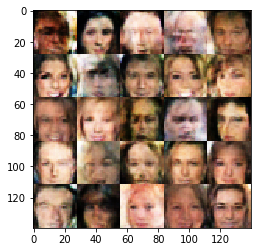

Epoch 1/2... Discriminator Loss: 1.1418... Generator Loss: 1.0879
Epoch 1/2... Discriminator Loss: 1.1879... Generator Loss: 0.9417
Epoch 1/2... Discriminator Loss: 1.1276... Generator Loss: 1.1472
Epoch 1/2... Discriminator Loss: 1.3783... Generator Loss: 0.7495
Epoch 1/2... Discriminator Loss: 1.0544... Generator Loss: 0.9631
Epoch 1/2... Discriminator Loss: 1.2304... Generator Loss: 0.8982
Epoch 1/2... Discriminator Loss: 1.1463... Generator Loss: 0.8612
Epoch 1/2... Discriminator Loss: 1.1001... Generator Loss: 1.1948
Epoch 1/2... Discriminator Loss: 1.2827... Generator Loss: 1.1558
Epoch 1/2... Discriminator Loss: 1.1902... Generator Loss: 1.3793


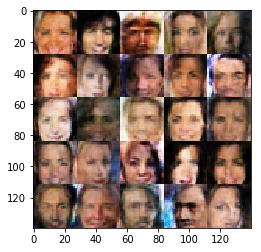

Epoch 1/2... Discriminator Loss: 1.0687... Generator Loss: 1.0309
Epoch 1/2... Discriminator Loss: 1.1158... Generator Loss: 1.0618
Epoch 1/2... Discriminator Loss: 1.2437... Generator Loss: 1.4944
Epoch 1/2... Discriminator Loss: 1.2320... Generator Loss: 0.9131
Epoch 1/2... Discriminator Loss: 1.0963... Generator Loss: 1.0360
Epoch 1/2... Discriminator Loss: 1.0623... Generator Loss: 0.8747
Epoch 1/2... Discriminator Loss: 1.4158... Generator Loss: 0.5164
Epoch 1/2... Discriminator Loss: 1.2159... Generator Loss: 0.8880
Epoch 1/2... Discriminator Loss: 1.1321... Generator Loss: 0.9886
Epoch 1/2... Discriminator Loss: 1.0950... Generator Loss: 0.9545


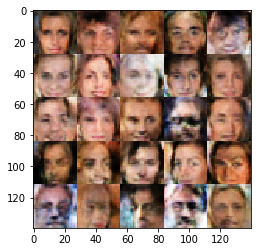

Epoch 1/2... Discriminator Loss: 1.2178... Generator Loss: 1.0108
Epoch 1/2... Discriminator Loss: 1.4909... Generator Loss: 0.6284
Epoch 1/2... Discriminator Loss: 1.2604... Generator Loss: 0.8385
Epoch 1/2... Discriminator Loss: 1.0148... Generator Loss: 1.5674
Epoch 1/2... Discriminator Loss: 1.1599... Generator Loss: 0.8602
Epoch 1/2... Discriminator Loss: 1.0803... Generator Loss: 1.0488
Epoch 1/2... Discriminator Loss: 1.1452... Generator Loss: 1.4400
Epoch 1/2... Discriminator Loss: 1.1330... Generator Loss: 1.3907
Epoch 1/2... Discriminator Loss: 1.0721... Generator Loss: 0.9243
Epoch 1/2... Discriminator Loss: 1.1786... Generator Loss: 0.8737


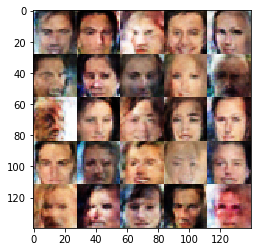

Epoch 1/2... Discriminator Loss: 1.1856... Generator Loss: 1.2638
Epoch 1/2... Discriminator Loss: 1.0513... Generator Loss: 1.0841
Epoch 1/2... Discriminator Loss: 1.1696... Generator Loss: 1.0312
Epoch 1/2... Discriminator Loss: 1.0816... Generator Loss: 1.1228
Epoch 1/2... Discriminator Loss: 1.2243... Generator Loss: 1.0521
Epoch 1/2... Discriminator Loss: 1.1983... Generator Loss: 0.8120
Epoch 1/2... Discriminator Loss: 1.1148... Generator Loss: 1.0287
Epoch 1/2... Discriminator Loss: 1.3829... Generator Loss: 1.3607
Epoch 1/2... Discriminator Loss: 1.1945... Generator Loss: 0.9029
Epoch 1/2... Discriminator Loss: 0.9763... Generator Loss: 1.2858


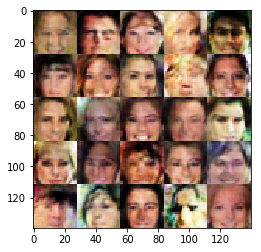

Epoch 1/2... Discriminator Loss: 1.0642... Generator Loss: 1.3245
Epoch 1/2... Discriminator Loss: 1.0822... Generator Loss: 1.0394
Epoch 1/2... Discriminator Loss: 1.0209... Generator Loss: 0.8843
Epoch 1/2... Discriminator Loss: 1.3007... Generator Loss: 1.2567
Epoch 1/2... Discriminator Loss: 1.1029... Generator Loss: 1.0720
Epoch 1/2... Discriminator Loss: 1.2787... Generator Loss: 0.7534
Epoch 1/2... Discriminator Loss: 1.1745... Generator Loss: 1.2386
Epoch 1/2... Discriminator Loss: 1.0598... Generator Loss: 1.3501
Epoch 1/2... Discriminator Loss: 1.0598... Generator Loss: 0.9485
Epoch 1/2... Discriminator Loss: 1.0616... Generator Loss: 1.5126


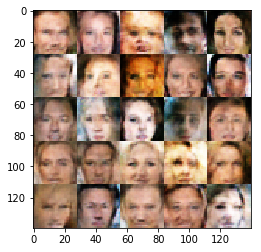

Epoch 1/2... Discriminator Loss: 1.0700... Generator Loss: 0.8314
Epoch 1/2... Discriminator Loss: 1.1178... Generator Loss: 0.9268
Epoch 1/2... Discriminator Loss: 1.0001... Generator Loss: 1.1849
Epoch 1/2... Discriminator Loss: 1.2163... Generator Loss: 0.7822
Epoch 1/2... Discriminator Loss: 1.2608... Generator Loss: 1.0807
Epoch 1/2... Discriminator Loss: 1.1496... Generator Loss: 0.8110
Epoch 1/2... Discriminator Loss: 1.1351... Generator Loss: 1.0191
Epoch 1/2... Discriminator Loss: 1.1285... Generator Loss: 0.9384
Epoch 1/2... Discriminator Loss: 1.1968... Generator Loss: 0.7217
Epoch 1/2... Discriminator Loss: 1.0934... Generator Loss: 1.1646


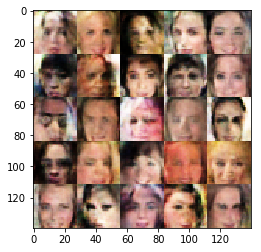

Epoch 1/2... Discriminator Loss: 1.1543... Generator Loss: 0.7775
Epoch 1/2... Discriminator Loss: 1.1160... Generator Loss: 0.8688
Epoch 1/2... Discriminator Loss: 1.0709... Generator Loss: 0.8841
Epoch 1/2... Discriminator Loss: 1.0913... Generator Loss: 0.9917
Epoch 1/2... Discriminator Loss: 1.2127... Generator Loss: 0.7504
Epoch 1/2... Discriminator Loss: 1.2875... Generator Loss: 0.7618
Epoch 1/2... Discriminator Loss: 1.1110... Generator Loss: 1.1665
Epoch 1/2... Discriminator Loss: 1.1202... Generator Loss: 1.3076
Epoch 1/2... Discriminator Loss: 1.0826... Generator Loss: 0.9327
Epoch 1/2... Discriminator Loss: 0.9853... Generator Loss: 1.2650


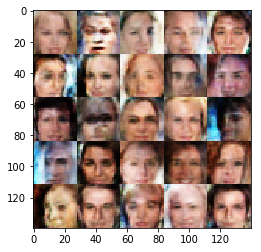

Epoch 1/2... Discriminator Loss: 1.6118... Generator Loss: 0.5302
Epoch 1/2... Discriminator Loss: 1.2421... Generator Loss: 0.9721
Epoch 1/2... Discriminator Loss: 1.2071... Generator Loss: 0.8107
Epoch 1/2... Discriminator Loss: 1.0931... Generator Loss: 0.8730
Epoch 1/2... Discriminator Loss: 1.0742... Generator Loss: 1.0839
Epoch 1/2... Discriminator Loss: 1.2664... Generator Loss: 0.8762
Epoch 1/2... Discriminator Loss: 1.1492... Generator Loss: 1.0389
Epoch 1/2... Discriminator Loss: 1.0436... Generator Loss: 1.2068
Epoch 1/2... Discriminator Loss: 1.1714... Generator Loss: 1.1435
Epoch 1/2... Discriminator Loss: 1.2282... Generator Loss: 1.1342


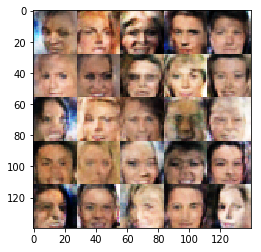

Epoch 1/2... Discriminator Loss: 1.0179... Generator Loss: 1.1793
Epoch 1/2... Discriminator Loss: 1.2775... Generator Loss: 1.1170
Epoch 1/2... Discriminator Loss: 1.3949... Generator Loss: 0.8670
Epoch 1/2... Discriminator Loss: 1.2189... Generator Loss: 1.1296
Epoch 1/2... Discriminator Loss: 1.2381... Generator Loss: 1.6212
Epoch 1/2... Discriminator Loss: 1.0984... Generator Loss: 0.9383
Epoch 1/2... Discriminator Loss: 1.0841... Generator Loss: 0.9609
Epoch 1/2... Discriminator Loss: 1.0587... Generator Loss: 0.9236
Epoch 1/2... Discriminator Loss: 1.0928... Generator Loss: 1.2233
Epoch 1/2... Discriminator Loss: 1.2058... Generator Loss: 0.8035


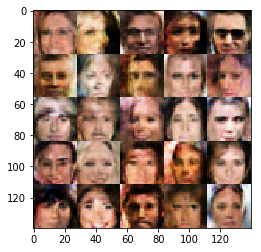

Epoch 1/2... Discriminator Loss: 1.2050... Generator Loss: 0.9436
Epoch 1/2... Discriminator Loss: 1.2006... Generator Loss: 1.1102
Epoch 1/2... Discriminator Loss: 1.3787... Generator Loss: 0.7564
Epoch 1/2... Discriminator Loss: 1.1856... Generator Loss: 0.9758
Epoch 1/2... Discriminator Loss: 1.2829... Generator Loss: 0.7209
Epoch 1/2... Discriminator Loss: 1.1497... Generator Loss: 1.3675
Epoch 1/2... Discriminator Loss: 1.2110... Generator Loss: 1.5058
Epoch 1/2... Discriminator Loss: 1.2546... Generator Loss: 1.1868
Epoch 1/2... Discriminator Loss: 1.0483... Generator Loss: 0.9891
Epoch 1/2... Discriminator Loss: 1.2065... Generator Loss: 0.7769


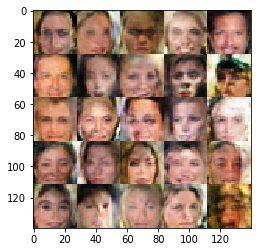

Epoch 1/2... Discriminator Loss: 1.1267... Generator Loss: 1.0212
Epoch 1/2... Discriminator Loss: 1.1080... Generator Loss: 0.8510
Epoch 1/2... Discriminator Loss: 1.0514... Generator Loss: 1.1289
Epoch 1/2... Discriminator Loss: 1.1607... Generator Loss: 0.9795
Epoch 1/2... Discriminator Loss: 1.2118... Generator Loss: 1.3104
Epoch 1/2... Discriminator Loss: 1.1596... Generator Loss: 1.4920
Epoch 1/2... Discriminator Loss: 1.1562... Generator Loss: 0.9779
Epoch 1/2... Discriminator Loss: 1.1809... Generator Loss: 1.1391
Epoch 1/2... Discriminator Loss: 1.2541... Generator Loss: 1.2636
Epoch 1/2... Discriminator Loss: 1.1113... Generator Loss: 1.2366


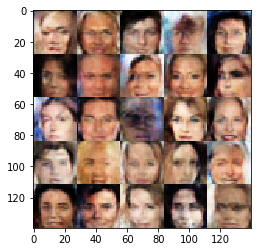

Epoch 1/2... Discriminator Loss: 1.3108... Generator Loss: 0.7217
Epoch 1/2... Discriminator Loss: 1.0564... Generator Loss: 1.2200
Epoch 1/2... Discriminator Loss: 1.1352... Generator Loss: 1.4085
Epoch 1/2... Discriminator Loss: 1.0676... Generator Loss: 1.0616
Epoch 1/2... Discriminator Loss: 1.0688... Generator Loss: 0.9160
Epoch 1/2... Discriminator Loss: 1.1854... Generator Loss: 1.0402
Epoch 1/2... Discriminator Loss: 1.2651... Generator Loss: 0.7318
Epoch 1/2... Discriminator Loss: 1.0888... Generator Loss: 1.5137
Epoch 1/2... Discriminator Loss: 1.0228... Generator Loss: 1.1036
Epoch 1/2... Discriminator Loss: 1.0191... Generator Loss: 1.1070


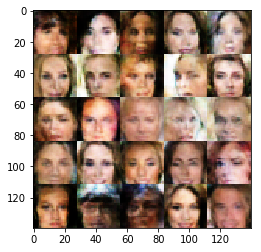

Epoch 1/2... Discriminator Loss: 1.0753... Generator Loss: 0.9733
Epoch 1/2... Discriminator Loss: 1.1309... Generator Loss: 1.3399
Epoch 1/2... Discriminator Loss: 1.2384... Generator Loss: 0.7159
Epoch 1/2... Discriminator Loss: 0.9944... Generator Loss: 1.1140
Epoch 1/2... Discriminator Loss: 1.0509... Generator Loss: 1.1469
Epoch 1/2... Discriminator Loss: 1.0063... Generator Loss: 0.7134
Epoch 1/2... Discriminator Loss: 1.0425... Generator Loss: 1.2635
Epoch 1/2... Discriminator Loss: 1.0424... Generator Loss: 1.1425
Epoch 1/2... Discriminator Loss: 1.1824... Generator Loss: 1.1738
Epoch 1/2... Discriminator Loss: 1.6766... Generator Loss: 0.6845


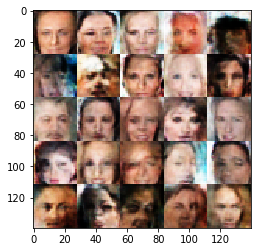

Epoch 1/2... Discriminator Loss: 1.0877... Generator Loss: 0.7810
Epoch 1/2... Discriminator Loss: 1.2433... Generator Loss: 1.4854
Epoch 1/2... Discriminator Loss: 1.1628... Generator Loss: 0.7839
Epoch 1/2... Discriminator Loss: 1.2289... Generator Loss: 0.8363
Epoch 1/2... Discriminator Loss: 0.9024... Generator Loss: 1.0880
Epoch 1/2... Discriminator Loss: 1.2680... Generator Loss: 1.6537
Epoch 1/2... Discriminator Loss: 1.2458... Generator Loss: 0.6020
Epoch 1/2... Discriminator Loss: 1.0546... Generator Loss: 1.3316
Epoch 1/2... Discriminator Loss: 1.1264... Generator Loss: 1.1487
Epoch 1/2... Discriminator Loss: 1.0797... Generator Loss: 1.1770


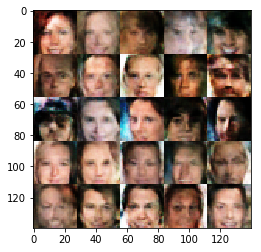

Epoch 1/2... Discriminator Loss: 1.1545... Generator Loss: 0.9993
Epoch 1/2... Discriminator Loss: 1.1605... Generator Loss: 1.6676
Epoch 1/2... Discriminator Loss: 1.1000... Generator Loss: 1.1169
Epoch 1/2... Discriminator Loss: 0.9410... Generator Loss: 1.4965
Epoch 1/2... Discriminator Loss: 1.1058... Generator Loss: 0.9026
Epoch 1/2... Discriminator Loss: 1.0883... Generator Loss: 1.2608
Epoch 1/2... Discriminator Loss: 1.1045... Generator Loss: 1.0153
Epoch 1/2... Discriminator Loss: 0.9669... Generator Loss: 1.3700
Epoch 1/2... Discriminator Loss: 1.0437... Generator Loss: 1.1605
Epoch 1/2... Discriminator Loss: 1.0613... Generator Loss: 1.4546


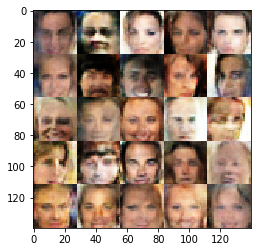

Epoch 1/2... Discriminator Loss: 1.2595... Generator Loss: 1.5799
Epoch 1/2... Discriminator Loss: 1.1511... Generator Loss: 1.1630
Epoch 1/2... Discriminator Loss: 1.3216... Generator Loss: 0.9021
Epoch 1/2... Discriminator Loss: 1.4903... Generator Loss: 0.5280
Epoch 1/2... Discriminator Loss: 0.9479... Generator Loss: 1.0542
Epoch 1/2... Discriminator Loss: 1.1465... Generator Loss: 1.1882
Epoch 1/2... Discriminator Loss: 1.1203... Generator Loss: 0.8703
Epoch 1/2... Discriminator Loss: 1.0714... Generator Loss: 1.0344
Epoch 1/2... Discriminator Loss: 1.2917... Generator Loss: 1.8255
Epoch 1/2... Discriminator Loss: 1.0916... Generator Loss: 1.2160


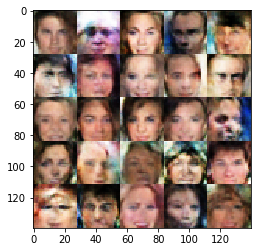

Epoch 1/2... Discriminator Loss: 1.0821... Generator Loss: 1.1004
Epoch 1/2... Discriminator Loss: 1.0941... Generator Loss: 1.4362
Epoch 1/2... Discriminator Loss: 1.1981... Generator Loss: 1.0571
Epoch 1/2... Discriminator Loss: 1.2933... Generator Loss: 0.8088
Epoch 1/2... Discriminator Loss: 1.0226... Generator Loss: 1.3587
Epoch 1/2... Discriminator Loss: 0.9531... Generator Loss: 1.2054
Epoch 1/2... Discriminator Loss: 1.1674... Generator Loss: 0.7989
Epoch 1/2... Discriminator Loss: 0.8678... Generator Loss: 1.1740
Epoch 1/2... Discriminator Loss: 1.2195... Generator Loss: 0.8796
Epoch 1/2... Discriminator Loss: 0.9911... Generator Loss: 1.1349


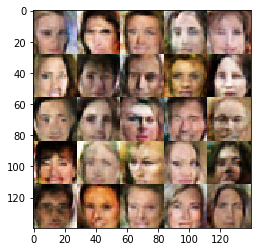

Epoch 1/2... Discriminator Loss: 0.9953... Generator Loss: 1.1260
Epoch 1/2... Discriminator Loss: 1.0051... Generator Loss: 0.9099
Epoch 1/2... Discriminator Loss: 0.9674... Generator Loss: 0.9471
Epoch 1/2... Discriminator Loss: 1.2720... Generator Loss: 0.6818
Epoch 1/2... Discriminator Loss: 1.1378... Generator Loss: 1.2517
Epoch 1/2... Discriminator Loss: 1.0244... Generator Loss: 1.2307
Epoch 1/2... Discriminator Loss: 0.9118... Generator Loss: 0.9438
Epoch 1/2... Discriminator Loss: 1.0956... Generator Loss: 1.5446
Epoch 1/2... Discriminator Loss: 1.1244... Generator Loss: 0.9504
Epoch 1/2... Discriminator Loss: 1.0280... Generator Loss: 1.1467


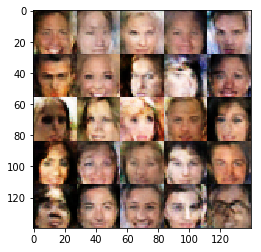

Epoch 1/2... Discriminator Loss: 1.0319... Generator Loss: 0.9377
Epoch 1/2... Discriminator Loss: 1.1177... Generator Loss: 1.0405
Epoch 1/2... Discriminator Loss: 1.1214... Generator Loss: 1.3311
Epoch 1/2... Discriminator Loss: 1.0478... Generator Loss: 1.1427
Epoch 1/2... Discriminator Loss: 0.9832... Generator Loss: 1.4498
Epoch 1/2... Discriminator Loss: 1.1633... Generator Loss: 1.4944
Epoch 1/2... Discriminator Loss: 1.0462... Generator Loss: 1.3331
Epoch 1/2... Discriminator Loss: 0.9864... Generator Loss: 1.3412
Epoch 1/2... Discriminator Loss: 1.2204... Generator Loss: 0.7470
Epoch 1/2... Discriminator Loss: 1.1940... Generator Loss: 1.0420


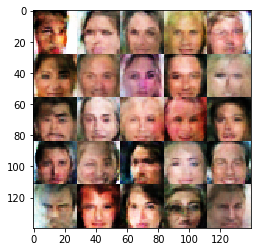

Epoch 1/2... Discriminator Loss: 1.1883... Generator Loss: 0.7575
Epoch 1/2... Discriminator Loss: 1.1012... Generator Loss: 1.1359
Epoch 1/2... Discriminator Loss: 1.2027... Generator Loss: 0.9267
Epoch 1/2... Discriminator Loss: 1.0766... Generator Loss: 0.7095
Epoch 1/2... Discriminator Loss: 1.2518... Generator Loss: 1.0289
Epoch 1/2... Discriminator Loss: 0.9934... Generator Loss: 1.1261
Epoch 1/2... Discriminator Loss: 1.2413... Generator Loss: 1.3320
Epoch 1/2... Discriminator Loss: 1.0371... Generator Loss: 1.4731
Epoch 1/2... Discriminator Loss: 1.0783... Generator Loss: 1.1035
Epoch 1/2... Discriminator Loss: 1.0132... Generator Loss: 1.0031


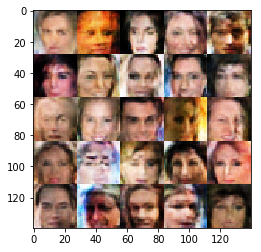

Epoch 1/2... Discriminator Loss: 1.1695... Generator Loss: 0.8997
Epoch 1/2... Discriminator Loss: 1.0982... Generator Loss: 1.1818
Epoch 1/2... Discriminator Loss: 1.0024... Generator Loss: 1.1966
Epoch 1/2... Discriminator Loss: 1.0700... Generator Loss: 1.3917
Epoch 1/2... Discriminator Loss: 0.9749... Generator Loss: 1.3890
Epoch 1/2... Discriminator Loss: 1.1592... Generator Loss: 0.8164
Epoch 1/2... Discriminator Loss: 0.9823... Generator Loss: 1.7513
Epoch 1/2... Discriminator Loss: 1.0972... Generator Loss: 1.4128
Epoch 1/2... Discriminator Loss: 0.9673... Generator Loss: 1.2347
Epoch 1/2... Discriminator Loss: 1.1423... Generator Loss: 1.1208


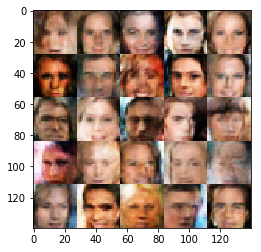

Epoch 1/2... Discriminator Loss: 1.0985... Generator Loss: 0.9811
Epoch 1/2... Discriminator Loss: 1.0348... Generator Loss: 1.2461
Epoch 1/2... Discriminator Loss: 1.1913... Generator Loss: 0.8512
Epoch 1/2... Discriminator Loss: 1.0273... Generator Loss: 1.3731
Epoch 1/2... Discriminator Loss: 1.0290... Generator Loss: 1.1326
Epoch 1/2... Discriminator Loss: 1.1828... Generator Loss: 1.3792
Epoch 1/2... Discriminator Loss: 1.0456... Generator Loss: 1.7209
Epoch 1/2... Discriminator Loss: 1.1007... Generator Loss: 1.4061
Epoch 1/2... Discriminator Loss: 0.9192... Generator Loss: 1.3459
Epoch 1/2... Discriminator Loss: 0.9648... Generator Loss: 1.2281


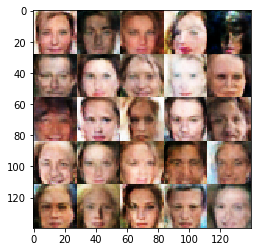

Epoch 1/2... Discriminator Loss: 0.8588... Generator Loss: 1.1750
Epoch 1/2... Discriminator Loss: 1.1125... Generator Loss: 1.1350
Epoch 1/2... Discriminator Loss: 0.9789... Generator Loss: 1.1754
Epoch 1/2... Discriminator Loss: 1.1144... Generator Loss: 1.2530
Epoch 1/2... Discriminator Loss: 1.2160... Generator Loss: 0.8595
Epoch 1/2... Discriminator Loss: 1.3323... Generator Loss: 1.5620
Epoch 1/2... Discriminator Loss: 1.1867... Generator Loss: 0.8230
Epoch 1/2... Discriminator Loss: 1.0601... Generator Loss: 1.0959
Epoch 1/2... Discriminator Loss: 0.9705... Generator Loss: 1.3376
Epoch 1/2... Discriminator Loss: 1.1036... Generator Loss: 1.2437


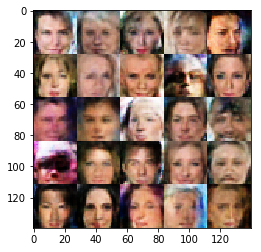

Epoch 1/2... Discriminator Loss: 1.1821... Generator Loss: 1.3702
Epoch 1/2... Discriminator Loss: 1.1016... Generator Loss: 1.0292
Epoch 1/2... Discriminator Loss: 1.1672... Generator Loss: 1.6734
Epoch 1/2... Discriminator Loss: 1.1099... Generator Loss: 1.4804
Epoch 1/2... Discriminator Loss: 0.8907... Generator Loss: 1.8555
Epoch 1/2... Discriminator Loss: 1.0264... Generator Loss: 1.4167
Epoch 1/2... Discriminator Loss: 1.1936... Generator Loss: 1.3669
Epoch 1/2... Discriminator Loss: 0.9276... Generator Loss: 1.4038
Epoch 1/2... Discriminator Loss: 0.9927... Generator Loss: 0.9956
Epoch 1/2... Discriminator Loss: 1.0661... Generator Loss: 1.1763


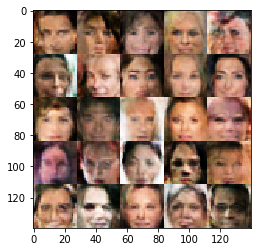

Epoch 1/2... Discriminator Loss: 1.1277... Generator Loss: 1.4317
Epoch 1/2... Discriminator Loss: 0.9671... Generator Loss: 1.0582
Epoch 1/2... Discriminator Loss: 0.9138... Generator Loss: 1.1972
Epoch 2/2... Discriminator Loss: 1.0954... Generator Loss: 1.0307
Epoch 2/2... Discriminator Loss: 0.8872... Generator Loss: 1.0571
Epoch 2/2... Discriminator Loss: 1.1127... Generator Loss: 0.8649
Epoch 2/2... Discriminator Loss: 1.0393... Generator Loss: 0.9695
Epoch 2/2... Discriminator Loss: 1.1226... Generator Loss: 1.3602
Epoch 2/2... Discriminator Loss: 1.1582... Generator Loss: 1.4950
Epoch 2/2... Discriminator Loss: 0.9884... Generator Loss: 0.9061


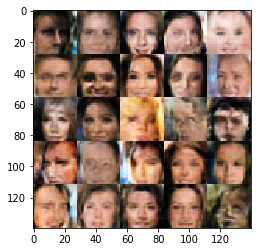

Epoch 2/2... Discriminator Loss: 1.2786... Generator Loss: 1.4371
Epoch 2/2... Discriminator Loss: 0.9862... Generator Loss: 1.5885
Epoch 2/2... Discriminator Loss: 1.3043... Generator Loss: 0.8405
Epoch 2/2... Discriminator Loss: 0.9530... Generator Loss: 1.0269
Epoch 2/2... Discriminator Loss: 1.0793... Generator Loss: 1.2018
Epoch 2/2... Discriminator Loss: 0.9569... Generator Loss: 1.0284
Epoch 2/2... Discriminator Loss: 1.0695... Generator Loss: 0.7865
Epoch 2/2... Discriminator Loss: 1.0905... Generator Loss: 0.8582
Epoch 2/2... Discriminator Loss: 1.0474... Generator Loss: 1.1091
Epoch 2/2... Discriminator Loss: 1.2771... Generator Loss: 0.7459


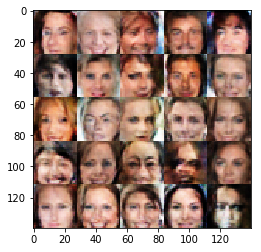

Epoch 2/2... Discriminator Loss: 1.0726... Generator Loss: 1.5396
Epoch 2/2... Discriminator Loss: 1.0787... Generator Loss: 1.1190
Epoch 2/2... Discriminator Loss: 1.1626... Generator Loss: 1.6082
Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 1.2217
Epoch 2/2... Discriminator Loss: 0.8724... Generator Loss: 1.2193
Epoch 2/2... Discriminator Loss: 1.2795... Generator Loss: 0.6647
Epoch 2/2... Discriminator Loss: 1.1981... Generator Loss: 1.2728
Epoch 2/2... Discriminator Loss: 1.1931... Generator Loss: 0.9930
Epoch 2/2... Discriminator Loss: 1.2051... Generator Loss: 0.9586
Epoch 2/2... Discriminator Loss: 1.0098... Generator Loss: 1.2254


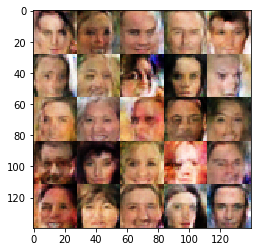

Epoch 2/2... Discriminator Loss: 1.1760... Generator Loss: 1.2675
Epoch 2/2... Discriminator Loss: 0.9087... Generator Loss: 1.3821
Epoch 2/2... Discriminator Loss: 1.0298... Generator Loss: 0.9362
Epoch 2/2... Discriminator Loss: 1.0108... Generator Loss: 1.2416
Epoch 2/2... Discriminator Loss: 1.0290... Generator Loss: 0.9255
Epoch 2/2... Discriminator Loss: 1.5128... Generator Loss: 0.7547
Epoch 2/2... Discriminator Loss: 1.1946... Generator Loss: 0.8272
Epoch 2/2... Discriminator Loss: 1.1337... Generator Loss: 1.3694
Epoch 2/2... Discriminator Loss: 1.0822... Generator Loss: 1.5107
Epoch 2/2... Discriminator Loss: 0.9902... Generator Loss: 1.5200


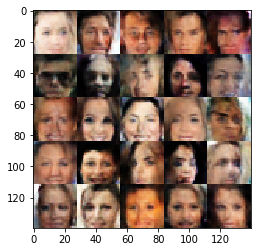

Epoch 2/2... Discriminator Loss: 0.9324... Generator Loss: 1.4040
Epoch 2/2... Discriminator Loss: 1.0177... Generator Loss: 0.8617
Epoch 2/2... Discriminator Loss: 1.2415... Generator Loss: 0.7468
Epoch 2/2... Discriminator Loss: 1.2262... Generator Loss: 0.7213
Epoch 2/2... Discriminator Loss: 1.0343... Generator Loss: 1.1269
Epoch 2/2... Discriminator Loss: 1.0137... Generator Loss: 1.2348
Epoch 2/2... Discriminator Loss: 1.4116... Generator Loss: 0.5488
Epoch 2/2... Discriminator Loss: 1.1166... Generator Loss: 1.2081
Epoch 2/2... Discriminator Loss: 1.1788... Generator Loss: 0.9260
Epoch 2/2... Discriminator Loss: 1.0655... Generator Loss: 1.3507


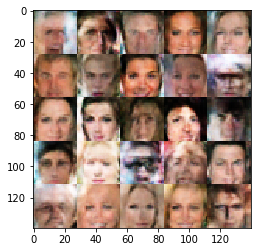

Epoch 2/2... Discriminator Loss: 1.1880... Generator Loss: 0.8833
Epoch 2/2... Discriminator Loss: 1.1353... Generator Loss: 0.8048
Epoch 2/2... Discriminator Loss: 1.1251... Generator Loss: 1.2400
Epoch 2/2... Discriminator Loss: 1.0521... Generator Loss: 0.9014
Epoch 2/2... Discriminator Loss: 1.1816... Generator Loss: 0.9481
Epoch 2/2... Discriminator Loss: 1.0379... Generator Loss: 1.1479
Epoch 2/2... Discriminator Loss: 1.2181... Generator Loss: 0.7285
Epoch 2/2... Discriminator Loss: 1.1779... Generator Loss: 0.8583
Epoch 2/2... Discriminator Loss: 1.1031... Generator Loss: 1.4729
Epoch 2/2... Discriminator Loss: 1.0304... Generator Loss: 1.2285


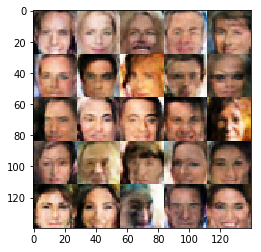

Epoch 2/2... Discriminator Loss: 1.3016... Generator Loss: 0.8961
Epoch 2/2... Discriminator Loss: 1.0351... Generator Loss: 1.1894
Epoch 2/2... Discriminator Loss: 0.9994... Generator Loss: 1.4177
Epoch 2/2... Discriminator Loss: 1.0681... Generator Loss: 0.8928
Epoch 2/2... Discriminator Loss: 1.0284... Generator Loss: 1.2483
Epoch 2/2... Discriminator Loss: 1.0079... Generator Loss: 1.0990
Epoch 2/2... Discriminator Loss: 0.9625... Generator Loss: 1.2079
Epoch 2/2... Discriminator Loss: 1.0741... Generator Loss: 1.1425
Epoch 2/2... Discriminator Loss: 1.0029... Generator Loss: 1.1307
Epoch 2/2... Discriminator Loss: 1.0265... Generator Loss: 1.2537


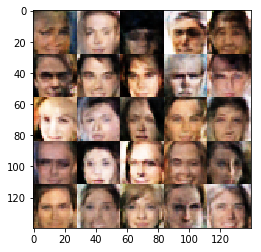

Epoch 2/2... Discriminator Loss: 1.0502... Generator Loss: 1.3311
Epoch 2/2... Discriminator Loss: 1.1798... Generator Loss: 0.9274
Epoch 2/2... Discriminator Loss: 0.9102... Generator Loss: 1.3161
Epoch 2/2... Discriminator Loss: 1.0557... Generator Loss: 1.4954
Epoch 2/2... Discriminator Loss: 1.0174... Generator Loss: 0.8339
Epoch 2/2... Discriminator Loss: 1.0320... Generator Loss: 1.0856
Epoch 2/2... Discriminator Loss: 1.0051... Generator Loss: 1.4594
Epoch 2/2... Discriminator Loss: 0.9317... Generator Loss: 0.8358
Epoch 2/2... Discriminator Loss: 0.9924... Generator Loss: 1.8514
Epoch 2/2... Discriminator Loss: 0.9247... Generator Loss: 1.0450


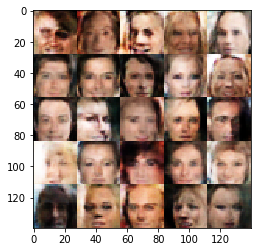

Epoch 2/2... Discriminator Loss: 1.0980... Generator Loss: 1.0740
Epoch 2/2... Discriminator Loss: 1.0316... Generator Loss: 1.3454
Epoch 2/2... Discriminator Loss: 1.1237... Generator Loss: 0.9038
Epoch 2/2... Discriminator Loss: 0.9857... Generator Loss: 1.3828
Epoch 2/2... Discriminator Loss: 1.1849... Generator Loss: 0.9929
Epoch 2/2... Discriminator Loss: 1.0572... Generator Loss: 1.4541
Epoch 2/2... Discriminator Loss: 0.9497... Generator Loss: 1.1142
Epoch 2/2... Discriminator Loss: 0.8718... Generator Loss: 1.2761
Epoch 2/2... Discriminator Loss: 1.0345... Generator Loss: 1.0188
Epoch 2/2... Discriminator Loss: 1.0173... Generator Loss: 1.5215


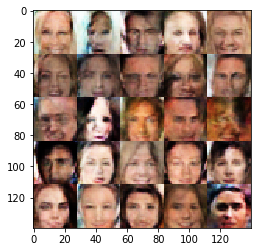

Epoch 2/2... Discriminator Loss: 0.9357... Generator Loss: 1.7865
Epoch 2/2... Discriminator Loss: 0.9471... Generator Loss: 1.4816
Epoch 2/2... Discriminator Loss: 0.9673... Generator Loss: 1.3929
Epoch 2/2... Discriminator Loss: 1.3947... Generator Loss: 0.7052
Epoch 2/2... Discriminator Loss: 1.1710... Generator Loss: 0.7984
Epoch 2/2... Discriminator Loss: 1.0104... Generator Loss: 1.2717
Epoch 2/2... Discriminator Loss: 1.1045... Generator Loss: 1.7958
Epoch 2/2... Discriminator Loss: 1.0503... Generator Loss: 1.2167
Epoch 2/2... Discriminator Loss: 1.0049... Generator Loss: 1.3507
Epoch 2/2... Discriminator Loss: 0.8993... Generator Loss: 1.3338


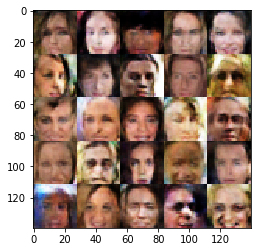

Epoch 2/2... Discriminator Loss: 0.9876... Generator Loss: 1.4846
Epoch 2/2... Discriminator Loss: 1.0275... Generator Loss: 1.6282
Epoch 2/2... Discriminator Loss: 1.1118... Generator Loss: 0.7855
Epoch 2/2... Discriminator Loss: 1.3009... Generator Loss: 0.7733
Epoch 2/2... Discriminator Loss: 1.0285... Generator Loss: 1.0438
Epoch 2/2... Discriminator Loss: 1.0007... Generator Loss: 0.9235
Epoch 2/2... Discriminator Loss: 1.0466... Generator Loss: 0.8552
Epoch 2/2... Discriminator Loss: 1.0746... Generator Loss: 1.7564
Epoch 2/2... Discriminator Loss: 1.0354... Generator Loss: 0.7884
Epoch 2/2... Discriminator Loss: 1.2754... Generator Loss: 0.6842


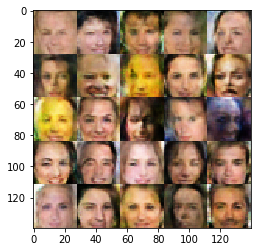

Epoch 2/2... Discriminator Loss: 0.9500... Generator Loss: 1.4403
Epoch 2/2... Discriminator Loss: 1.1263... Generator Loss: 1.5628
Epoch 2/2... Discriminator Loss: 1.1858... Generator Loss: 1.7166
Epoch 2/2... Discriminator Loss: 1.1710... Generator Loss: 0.8082
Epoch 2/2... Discriminator Loss: 1.0147... Generator Loss: 1.2836
Epoch 2/2... Discriminator Loss: 0.9533... Generator Loss: 0.9430
Epoch 2/2... Discriminator Loss: 0.8476... Generator Loss: 2.4268
Epoch 2/2... Discriminator Loss: 1.0167... Generator Loss: 1.4066
Epoch 2/2... Discriminator Loss: 0.9479... Generator Loss: 1.5104
Epoch 2/2... Discriminator Loss: 1.0358... Generator Loss: 1.4899


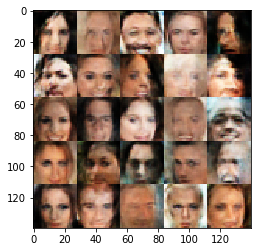

Epoch 2/2... Discriminator Loss: 1.0895... Generator Loss: 1.2277
Epoch 2/2... Discriminator Loss: 1.0135... Generator Loss: 1.0993
Epoch 2/2... Discriminator Loss: 0.9819... Generator Loss: 1.0161
Epoch 2/2... Discriminator Loss: 0.9977... Generator Loss: 1.0598
Epoch 2/2... Discriminator Loss: 0.9815... Generator Loss: 1.2988
Epoch 2/2... Discriminator Loss: 0.9367... Generator Loss: 1.0222
Epoch 2/2... Discriminator Loss: 1.0665... Generator Loss: 0.9080
Epoch 2/2... Discriminator Loss: 1.0615... Generator Loss: 1.5220
Epoch 2/2... Discriminator Loss: 1.0994... Generator Loss: 1.4184
Epoch 2/2... Discriminator Loss: 0.9128... Generator Loss: 1.2159


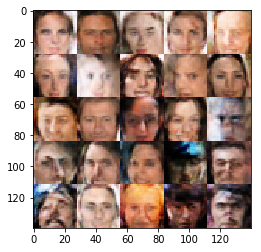

Epoch 2/2... Discriminator Loss: 0.9255... Generator Loss: 1.4855
Epoch 2/2... Discriminator Loss: 1.0281... Generator Loss: 1.0466
Epoch 2/2... Discriminator Loss: 0.9074... Generator Loss: 1.2670
Epoch 2/2... Discriminator Loss: 0.8372... Generator Loss: 1.8662
Epoch 2/2... Discriminator Loss: 1.2879... Generator Loss: 0.6949
Epoch 2/2... Discriminator Loss: 0.9944... Generator Loss: 1.2098
Epoch 2/2... Discriminator Loss: 1.1148... Generator Loss: 1.2454
Epoch 2/2... Discriminator Loss: 1.1546... Generator Loss: 1.5906
Epoch 2/2... Discriminator Loss: 1.0115... Generator Loss: 0.9060
Epoch 2/2... Discriminator Loss: 1.4723... Generator Loss: 0.5757


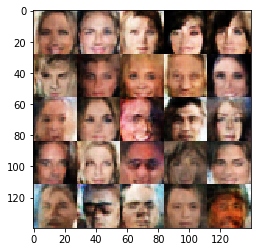

Epoch 2/2... Discriminator Loss: 1.2817... Generator Loss: 0.7773
Epoch 2/2... Discriminator Loss: 0.9782... Generator Loss: 1.1274
Epoch 2/2... Discriminator Loss: 1.1799... Generator Loss: 0.8426
Epoch 2/2... Discriminator Loss: 1.0996... Generator Loss: 1.8729
Epoch 2/2... Discriminator Loss: 1.0299... Generator Loss: 0.9567
Epoch 2/2... Discriminator Loss: 0.8600... Generator Loss: 1.3893
Epoch 2/2... Discriminator Loss: 1.0590... Generator Loss: 0.9055
Epoch 2/2... Discriminator Loss: 0.9593... Generator Loss: 0.9990
Epoch 2/2... Discriminator Loss: 0.9354... Generator Loss: 1.0120
Epoch 2/2... Discriminator Loss: 1.0083... Generator Loss: 0.9588


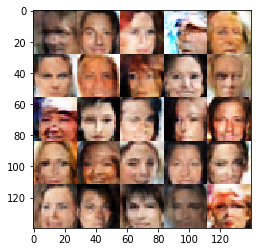

Epoch 2/2... Discriminator Loss: 1.0136... Generator Loss: 1.2982
Epoch 2/2... Discriminator Loss: 1.0863... Generator Loss: 1.1520
Epoch 2/2... Discriminator Loss: 0.8591... Generator Loss: 1.8356
Epoch 2/2... Discriminator Loss: 0.9929... Generator Loss: 1.1531
Epoch 2/2... Discriminator Loss: 1.0078... Generator Loss: 1.3454
Epoch 2/2... Discriminator Loss: 1.1547... Generator Loss: 1.1504
Epoch 2/2... Discriminator Loss: 1.1512... Generator Loss: 2.3226
Epoch 2/2... Discriminator Loss: 0.8788... Generator Loss: 1.1036
Epoch 2/2... Discriminator Loss: 0.8445... Generator Loss: 1.3471
Epoch 2/2... Discriminator Loss: 1.1173... Generator Loss: 1.7054


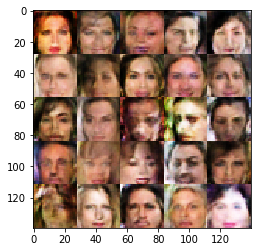

Epoch 2/2... Discriminator Loss: 0.9646... Generator Loss: 1.1636
Epoch 2/2... Discriminator Loss: 0.9799... Generator Loss: 1.1096
Epoch 2/2... Discriminator Loss: 1.1036... Generator Loss: 1.1688
Epoch 2/2... Discriminator Loss: 1.0877... Generator Loss: 0.9280
Epoch 2/2... Discriminator Loss: 1.1275... Generator Loss: 1.2876
Epoch 2/2... Discriminator Loss: 1.2473... Generator Loss: 0.8384
Epoch 2/2... Discriminator Loss: 1.0492... Generator Loss: 1.3952
Epoch 2/2... Discriminator Loss: 1.1821... Generator Loss: 1.0810
Epoch 2/2... Discriminator Loss: 0.9843... Generator Loss: 1.0281
Epoch 2/2... Discriminator Loss: 1.0650... Generator Loss: 1.8895


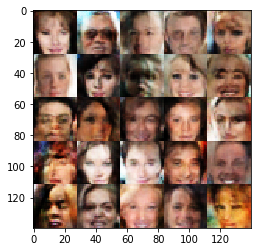

Epoch 2/2... Discriminator Loss: 0.8930... Generator Loss: 1.3957
Epoch 2/2... Discriminator Loss: 1.0942... Generator Loss: 1.1274
Epoch 2/2... Discriminator Loss: 0.9699... Generator Loss: 0.9859
Epoch 2/2... Discriminator Loss: 1.0404... Generator Loss: 1.1934
Epoch 2/2... Discriminator Loss: 0.8005... Generator Loss: 2.2012
Epoch 2/2... Discriminator Loss: 1.0057... Generator Loss: 1.0039
Epoch 2/2... Discriminator Loss: 0.9822... Generator Loss: 1.4957
Epoch 2/2... Discriminator Loss: 1.7469... Generator Loss: 2.8392
Epoch 2/2... Discriminator Loss: 1.1852... Generator Loss: 0.9552
Epoch 2/2... Discriminator Loss: 0.9424... Generator Loss: 1.8092


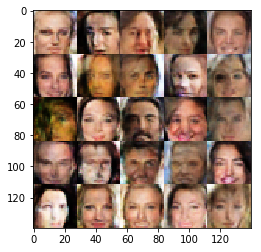

Epoch 2/2... Discriminator Loss: 1.1122... Generator Loss: 1.1000
Epoch 2/2... Discriminator Loss: 1.0651... Generator Loss: 0.8708
Epoch 2/2... Discriminator Loss: 0.9578... Generator Loss: 2.4179
Epoch 2/2... Discriminator Loss: 0.9503... Generator Loss: 1.5044
Epoch 2/2... Discriminator Loss: 0.9252... Generator Loss: 1.0274
Epoch 2/2... Discriminator Loss: 0.9570... Generator Loss: 1.5988
Epoch 2/2... Discriminator Loss: 0.9334... Generator Loss: 1.3868
Epoch 2/2... Discriminator Loss: 1.0057... Generator Loss: 1.9999
Epoch 2/2... Discriminator Loss: 1.2913... Generator Loss: 0.9794
Epoch 2/2... Discriminator Loss: 1.1022... Generator Loss: 1.1804


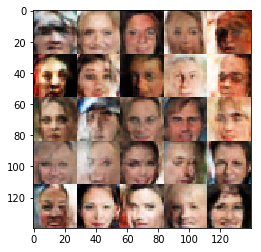

Epoch 2/2... Discriminator Loss: 0.9162... Generator Loss: 1.5823
Epoch 2/2... Discriminator Loss: 0.9232... Generator Loss: 1.0913
Epoch 2/2... Discriminator Loss: 0.7833... Generator Loss: 1.8999
Epoch 2/2... Discriminator Loss: 0.8575... Generator Loss: 1.5370
Epoch 2/2... Discriminator Loss: 0.9876... Generator Loss: 1.3710
Epoch 2/2... Discriminator Loss: 1.1660... Generator Loss: 0.9677
Epoch 2/2... Discriminator Loss: 0.9539... Generator Loss: 1.5105
Epoch 2/2... Discriminator Loss: 0.9930... Generator Loss: 1.1472
Epoch 2/2... Discriminator Loss: 1.2977... Generator Loss: 1.1189
Epoch 2/2... Discriminator Loss: 0.8454... Generator Loss: 1.2969


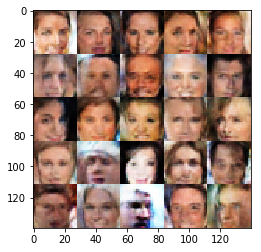

Epoch 2/2... Discriminator Loss: 1.0154... Generator Loss: 1.2591
Epoch 2/2... Discriminator Loss: 1.2255... Generator Loss: 0.7497
Epoch 2/2... Discriminator Loss: 0.9871... Generator Loss: 1.3190
Epoch 2/2... Discriminator Loss: 0.8813... Generator Loss: 1.4795
Epoch 2/2... Discriminator Loss: 1.4133... Generator Loss: 1.5704
Epoch 2/2... Discriminator Loss: 1.0243... Generator Loss: 1.1030
Epoch 2/2... Discriminator Loss: 1.1432... Generator Loss: 1.5253
Epoch 2/2... Discriminator Loss: 0.9346... Generator Loss: 1.5403
Epoch 2/2... Discriminator Loss: 1.0135... Generator Loss: 0.9517
Epoch 2/2... Discriminator Loss: 1.1311... Generator Loss: 0.9060


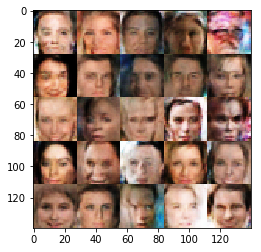

Epoch 2/2... Discriminator Loss: 0.9797... Generator Loss: 1.0034
Epoch 2/2... Discriminator Loss: 0.9668... Generator Loss: 1.0816
Epoch 2/2... Discriminator Loss: 0.8616... Generator Loss: 1.3119
Epoch 2/2... Discriminator Loss: 1.1653... Generator Loss: 0.9129
Epoch 2/2... Discriminator Loss: 0.8849... Generator Loss: 1.1362
Epoch 2/2... Discriminator Loss: 0.8435... Generator Loss: 1.2301
Epoch 2/2... Discriminator Loss: 1.0320... Generator Loss: 0.7412
Epoch 2/2... Discriminator Loss: 1.1201... Generator Loss: 1.8692
Epoch 2/2... Discriminator Loss: 1.1861... Generator Loss: 1.0674
Epoch 2/2... Discriminator Loss: 1.0793... Generator Loss: 1.4870


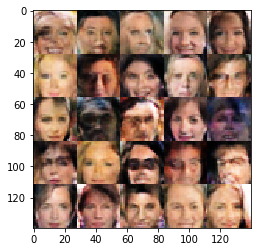

Epoch 2/2... Discriminator Loss: 1.1540... Generator Loss: 2.1099
Epoch 2/2... Discriminator Loss: 0.8505... Generator Loss: 1.4185
Epoch 2/2... Discriminator Loss: 0.9089... Generator Loss: 1.3034
Epoch 2/2... Discriminator Loss: 1.1241... Generator Loss: 1.0784
Epoch 2/2... Discriminator Loss: 1.0505... Generator Loss: 0.8287
Epoch 2/2... Discriminator Loss: 0.9032... Generator Loss: 1.5334
Epoch 2/2... Discriminator Loss: 0.9792... Generator Loss: 1.7253
Epoch 2/2... Discriminator Loss: 1.0697... Generator Loss: 2.0057
Epoch 2/2... Discriminator Loss: 0.8879... Generator Loss: 1.0383
Epoch 2/2... Discriminator Loss: 0.8393... Generator Loss: 1.4194


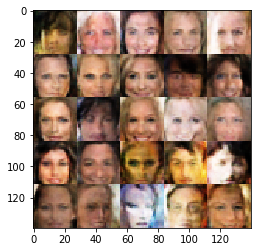

Epoch 2/2... Discriminator Loss: 1.1429... Generator Loss: 0.9714
Epoch 2/2... Discriminator Loss: 0.9008... Generator Loss: 1.4679
Epoch 2/2... Discriminator Loss: 0.9796... Generator Loss: 1.2043
Epoch 2/2... Discriminator Loss: 0.9494... Generator Loss: 1.0986
Epoch 2/2... Discriminator Loss: 0.9689... Generator Loss: 1.3218
Epoch 2/2... Discriminator Loss: 0.9456... Generator Loss: 1.5597
Epoch 2/2... Discriminator Loss: 0.8935... Generator Loss: 1.0989
Epoch 2/2... Discriminator Loss: 1.0745... Generator Loss: 1.5543
Epoch 2/2... Discriminator Loss: 0.9225... Generator Loss: 1.1723
Epoch 2/2... Discriminator Loss: 0.9683... Generator Loss: 1.1876


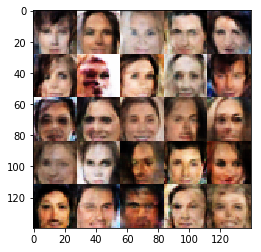

Epoch 2/2... Discriminator Loss: 0.9879... Generator Loss: 1.0672
Epoch 2/2... Discriminator Loss: 1.0456... Generator Loss: 1.5946
Epoch 2/2... Discriminator Loss: 1.1588... Generator Loss: 0.8869
Epoch 2/2... Discriminator Loss: 0.9436... Generator Loss: 1.8129
Epoch 2/2... Discriminator Loss: 0.9619... Generator Loss: 1.6655
Epoch 2/2... Discriminator Loss: 1.0353... Generator Loss: 1.8588
Epoch 2/2... Discriminator Loss: 1.2078... Generator Loss: 1.5821
Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 0.9234
Epoch 2/2... Discriminator Loss: 1.1253... Generator Loss: 1.7213
Epoch 2/2... Discriminator Loss: 0.9010... Generator Loss: 1.1842


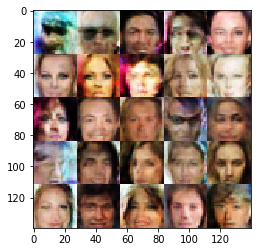

Epoch 2/2... Discriminator Loss: 0.9603... Generator Loss: 1.2786
Epoch 2/2... Discriminator Loss: 1.0245... Generator Loss: 0.8888
Epoch 2/2... Discriminator Loss: 0.9345... Generator Loss: 1.8833
Epoch 2/2... Discriminator Loss: 1.1394... Generator Loss: 1.4844
Epoch 2/2... Discriminator Loss: 0.8802... Generator Loss: 1.7132
Epoch 2/2... Discriminator Loss: 0.9718... Generator Loss: 1.3881
Epoch 2/2... Discriminator Loss: 1.0353... Generator Loss: 1.2468
Epoch 2/2... Discriminator Loss: 0.8697... Generator Loss: 1.1763
Epoch 2/2... Discriminator Loss: 0.9453... Generator Loss: 1.1707
Epoch 2/2... Discriminator Loss: 0.8717... Generator Loss: 0.9588


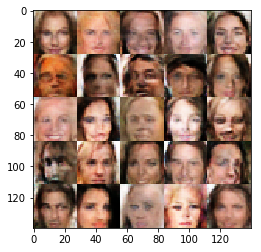

Epoch 2/2... Discriminator Loss: 0.9212... Generator Loss: 1.1658
Epoch 2/2... Discriminator Loss: 0.9186... Generator Loss: 1.2550
Epoch 2/2... Discriminator Loss: 0.8844... Generator Loss: 1.4978
Epoch 2/2... Discriminator Loss: 1.0009... Generator Loss: 0.9990
Epoch 2/2... Discriminator Loss: 1.0404... Generator Loss: 1.1099
Epoch 2/2... Discriminator Loss: 1.0638... Generator Loss: 1.3684
Epoch 2/2... Discriminator Loss: 0.9804... Generator Loss: 1.6189
Epoch 2/2... Discriminator Loss: 1.0261... Generator Loss: 1.2172
Epoch 2/2... Discriminator Loss: 1.0013... Generator Loss: 1.0904
Epoch 2/2... Discriminator Loss: 1.0982... Generator Loss: 2.1959


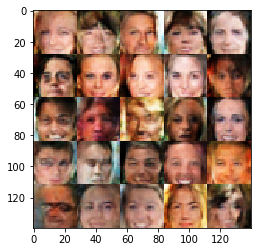

Epoch 2/2... Discriminator Loss: 0.9493... Generator Loss: 1.4837
Epoch 2/2... Discriminator Loss: 1.1809... Generator Loss: 0.7868
Epoch 2/2... Discriminator Loss: 1.0400... Generator Loss: 1.1190
Epoch 2/2... Discriminator Loss: 0.9734... Generator Loss: 2.0535
Epoch 2/2... Discriminator Loss: 1.0333... Generator Loss: 1.4836
Epoch 2/2... Discriminator Loss: 1.1744... Generator Loss: 0.9742
Epoch 2/2... Discriminator Loss: 0.9552... Generator Loss: 1.1434
Epoch 2/2... Discriminator Loss: 0.9952... Generator Loss: 1.9714
Epoch 2/2... Discriminator Loss: 1.0145... Generator Loss: 1.2455
Epoch 2/2... Discriminator Loss: 0.9226... Generator Loss: 0.9933


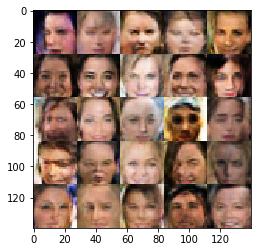

Epoch 2/2... Discriminator Loss: 1.1021... Generator Loss: 1.0944
Epoch 2/2... Discriminator Loss: 1.0266... Generator Loss: 1.1145
Epoch 2/2... Discriminator Loss: 1.1588... Generator Loss: 0.7620
Epoch 2/2... Discriminator Loss: 1.0975... Generator Loss: 1.6949
Epoch 2/2... Discriminator Loss: 1.1175... Generator Loss: 1.2736
Epoch 2/2... Discriminator Loss: 0.8844... Generator Loss: 1.3666
Epoch 2/2... Discriminator Loss: 1.1798... Generator Loss: 1.8070
Epoch 2/2... Discriminator Loss: 1.1960... Generator Loss: 0.8991
Epoch 2/2... Discriminator Loss: 0.9693... Generator Loss: 1.2588
Epoch 2/2... Discriminator Loss: 1.2512... Generator Loss: 2.2243


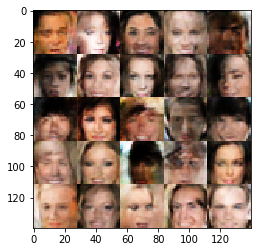

Epoch 2/2... Discriminator Loss: 1.3425... Generator Loss: 0.7773
Epoch 2/2... Discriminator Loss: 1.0495... Generator Loss: 1.5800
Epoch 2/2... Discriminator Loss: 1.1989... Generator Loss: 1.0520
Epoch 2/2... Discriminator Loss: 1.3086... Generator Loss: 1.1109
Epoch 2/2... Discriminator Loss: 1.2244... Generator Loss: 0.9385
Epoch 2/2... Discriminator Loss: 0.9681... Generator Loss: 1.3884
Epoch 2/2... Discriminator Loss: 1.2486... Generator Loss: 1.6002
Epoch 2/2... Discriminator Loss: 0.9683... Generator Loss: 1.0457
Epoch 2/2... Discriminator Loss: 0.8482... Generator Loss: 1.5905
Epoch 2/2... Discriminator Loss: 0.8931... Generator Loss: 1.3418


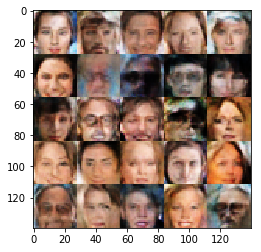

Epoch 2/2... Discriminator Loss: 1.1094... Generator Loss: 1.1459
Epoch 2/2... Discriminator Loss: 1.0561... Generator Loss: 1.5734
Epoch 2/2... Discriminator Loss: 1.0402... Generator Loss: 1.3642
Epoch 2/2... Discriminator Loss: 1.1890... Generator Loss: 0.8198
Epoch 2/2... Discriminator Loss: 0.8951... Generator Loss: 1.2765
Epoch 2/2... Discriminator Loss: 1.2901... Generator Loss: 0.8421
Epoch 2/2... Discriminator Loss: 1.1976... Generator Loss: 0.9443
Epoch 2/2... Discriminator Loss: 0.9202... Generator Loss: 1.6422
Epoch 2/2... Discriminator Loss: 1.0806... Generator Loss: 0.7764
Epoch 2/2... Discriminator Loss: 0.9681... Generator Loss: 1.8114


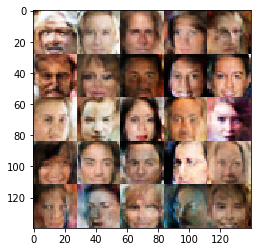

Epoch 2/2... Discriminator Loss: 0.9130... Generator Loss: 1.2627
Epoch 2/2... Discriminator Loss: 0.9345... Generator Loss: 1.1116
Epoch 2/2... Discriminator Loss: 1.1627... Generator Loss: 1.1863
Epoch 2/2... Discriminator Loss: 0.9840... Generator Loss: 1.1296
Epoch 2/2... Discriminator Loss: 1.0364... Generator Loss: 1.2071
Epoch 2/2... Discriminator Loss: 1.0082... Generator Loss: 0.8148
Epoch 2/2... Discriminator Loss: 1.0600... Generator Loss: 1.2605
Epoch 2/2... Discriminator Loss: 0.9773... Generator Loss: 1.9709
Epoch 2/2... Discriminator Loss: 0.9982... Generator Loss: 1.3831
Epoch 2/2... Discriminator Loss: 1.1720... Generator Loss: 1.0951


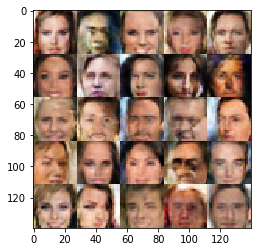

Epoch 2/2... Discriminator Loss: 1.4319... Generator Loss: 0.7186
Epoch 2/2... Discriminator Loss: 0.9507... Generator Loss: 1.0642
Epoch 2/2... Discriminator Loss: 0.9887... Generator Loss: 2.1159
Epoch 2/2... Discriminator Loss: 1.0838... Generator Loss: 1.1027
Epoch 2/2... Discriminator Loss: 0.9167... Generator Loss: 1.2021
Epoch 2/2... Discriminator Loss: 0.9739... Generator Loss: 1.3896
Epoch 2/2... Discriminator Loss: 0.8443... Generator Loss: 1.7708
Epoch 2/2... Discriminator Loss: 0.9598... Generator Loss: 1.6402
Epoch 2/2... Discriminator Loss: 0.8278... Generator Loss: 1.2228
Epoch 2/2... Discriminator Loss: 1.3003... Generator Loss: 1.8008


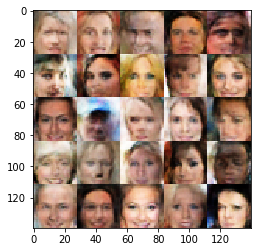

Epoch 2/2... Discriminator Loss: 0.7796... Generator Loss: 1.5903
Epoch 2/2... Discriminator Loss: 0.8380... Generator Loss: 1.0628
Epoch 2/2... Discriminator Loss: 0.8720... Generator Loss: 0.9410
Epoch 2/2... Discriminator Loss: 0.9786... Generator Loss: 1.9185
Epoch 2/2... Discriminator Loss: 0.9885... Generator Loss: 1.4036
Epoch 2/2... Discriminator Loss: 1.0797... Generator Loss: 1.2933
Epoch 2/2... Discriminator Loss: 0.9330... Generator Loss: 1.1426
Epoch 2/2... Discriminator Loss: 0.9468... Generator Loss: 1.9459
Epoch 2/2... Discriminator Loss: 1.1611... Generator Loss: 1.3976
Epoch 2/2... Discriminator Loss: 0.9565... Generator Loss: 1.1619


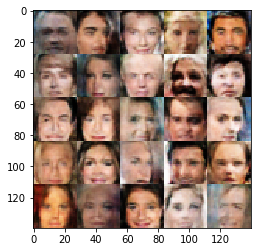

Epoch 2/2... Discriminator Loss: 0.9753... Generator Loss: 1.9687
Epoch 2/2... Discriminator Loss: 1.0392... Generator Loss: 0.8853
Epoch 2/2... Discriminator Loss: 1.0335... Generator Loss: 0.8768
Epoch 2/2... Discriminator Loss: 0.9286... Generator Loss: 1.2989
Epoch 2/2... Discriminator Loss: 1.0109... Generator Loss: 1.3780
Epoch 2/2... Discriminator Loss: 0.8788... Generator Loss: 1.3029
Epoch 2/2... Discriminator Loss: 0.9598... Generator Loss: 1.4151
Epoch 2/2... Discriminator Loss: 0.8545... Generator Loss: 1.5942
Epoch 2/2... Discriminator Loss: 0.9487... Generator Loss: 1.1701
Epoch 2/2... Discriminator Loss: 0.8740... Generator Loss: 1.4802


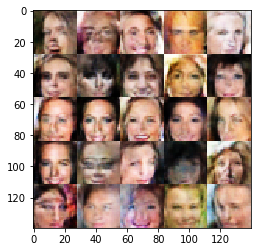

Epoch 2/2... Discriminator Loss: 1.0646... Generator Loss: 1.2798
Epoch 2/2... Discriminator Loss: 1.1010... Generator Loss: 1.3636
Epoch 2/2... Discriminator Loss: 0.8900... Generator Loss: 1.8427
Epoch 2/2... Discriminator Loss: 0.9842... Generator Loss: 1.0381
Epoch 2/2... Discriminator Loss: 0.7751... Generator Loss: 1.4881
Epoch 2/2... Discriminator Loss: 0.9588... Generator Loss: 1.4496
Epoch 2/2... Discriminator Loss: 0.7634... Generator Loss: 1.5677
Epoch 2/2... Discriminator Loss: 1.2384... Generator Loss: 2.2356
Epoch 2/2... Discriminator Loss: 1.0246... Generator Loss: 1.1174
Epoch 2/2... Discriminator Loss: 1.0845... Generator Loss: 1.9051


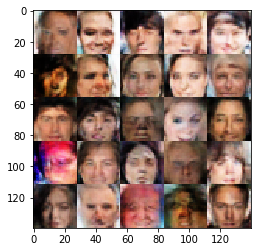

Epoch 2/2... Discriminator Loss: 1.1009... Generator Loss: 1.4586
Epoch 2/2... Discriminator Loss: 0.9544... Generator Loss: 1.0388
Epoch 2/2... Discriminator Loss: 0.8550... Generator Loss: 1.0411
Epoch 2/2... Discriminator Loss: 1.0017... Generator Loss: 1.4264
Epoch 2/2... Discriminator Loss: 1.0838... Generator Loss: 1.6369
Epoch 2/2... Discriminator Loss: 0.8834... Generator Loss: 1.5059
Epoch 2/2... Discriminator Loss: 0.9253... Generator Loss: 1.3352
Epoch 2/2... Discriminator Loss: 1.0063... Generator Loss: 1.1150
Epoch 2/2... Discriminator Loss: 0.9912... Generator Loss: 1.2339
Epoch 2/2... Discriminator Loss: 0.8200... Generator Loss: 1.3115


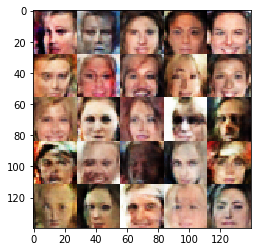

Epoch 2/2... Discriminator Loss: 1.1402... Generator Loss: 0.8334
Epoch 2/2... Discriminator Loss: 0.9799... Generator Loss: 1.2734
Epoch 2/2... Discriminator Loss: 0.8973... Generator Loss: 1.4208
Epoch 2/2... Discriminator Loss: 1.4497... Generator Loss: 0.7843
Epoch 2/2... Discriminator Loss: 0.9569... Generator Loss: 1.5680
Epoch 2/2... Discriminator Loss: 0.8200... Generator Loss: 1.2590
Epoch 2/2... Discriminator Loss: 0.9935... Generator Loss: 1.2870
Epoch 2/2... Discriminator Loss: 1.0234... Generator Loss: 1.1264
Epoch 2/2... Discriminator Loss: 1.1302... Generator Loss: 0.9792
Epoch 2/2... Discriminator Loss: 1.2343... Generator Loss: 2.2946


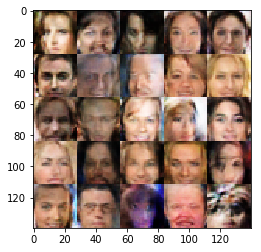

Epoch 2/2... Discriminator Loss: 1.2946... Generator Loss: 1.6415
Epoch 2/2... Discriminator Loss: 1.0150... Generator Loss: 1.4142
Epoch 2/2... Discriminator Loss: 1.0262... Generator Loss: 0.8553
Epoch 2/2... Discriminator Loss: 0.9710... Generator Loss: 1.3180
Epoch 2/2... Discriminator Loss: 0.8518... Generator Loss: 1.3628
Epoch 2/2... Discriminator Loss: 0.9110... Generator Loss: 1.7017
Epoch 2/2... Discriminator Loss: 1.0239... Generator Loss: 0.9748
Epoch 2/2... Discriminator Loss: 0.8515... Generator Loss: 1.8636
Epoch 2/2... Discriminator Loss: 1.0355... Generator Loss: 0.7945
Epoch 2/2... Discriminator Loss: 0.8968... Generator Loss: 1.0451


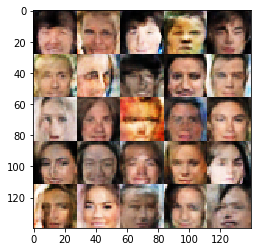

Epoch 2/2... Discriminator Loss: 1.0383... Generator Loss: 1.1181
Epoch 2/2... Discriminator Loss: 0.9371... Generator Loss: 1.2212
Epoch 2/2... Discriminator Loss: 1.0145... Generator Loss: 1.2334
Epoch 2/2... Discriminator Loss: 1.0378... Generator Loss: 1.4748
Epoch 2/2... Discriminator Loss: 1.0122... Generator Loss: 1.9161
Epoch 2/2... Discriminator Loss: 0.8910... Generator Loss: 1.6952
Epoch 2/2... Discriminator Loss: 0.8959... Generator Loss: 1.8401
Epoch 2/2... Discriminator Loss: 0.8582... Generator Loss: 1.4119
Epoch 2/2... Discriminator Loss: 0.9555... Generator Loss: 1.5955
Epoch 2/2... Discriminator Loss: 0.9104... Generator Loss: 1.5766


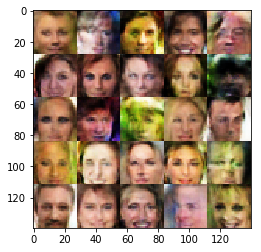

Epoch 2/2... Discriminator Loss: 0.9967... Generator Loss: 1.2614
Epoch 2/2... Discriminator Loss: 0.9962... Generator Loss: 1.1741
Epoch 2/2... Discriminator Loss: 0.8888... Generator Loss: 1.3528
Epoch 2/2... Discriminator Loss: 0.9130... Generator Loss: 1.7507
Epoch 2/2... Discriminator Loss: 1.0073... Generator Loss: 0.9539
Epoch 2/2... Discriminator Loss: 1.0806... Generator Loss: 1.2811
Epoch 2/2... Discriminator Loss: 0.8560... Generator Loss: 1.3815
Epoch 2/2... Discriminator Loss: 0.9713... Generator Loss: 1.1542
Epoch 2/2... Discriminator Loss: 1.0369... Generator Loss: 1.4960
Epoch 2/2... Discriminator Loss: 0.9146... Generator Loss: 1.3172


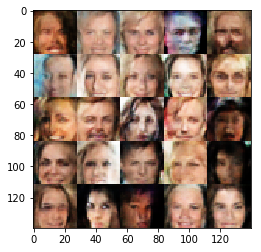

Epoch 2/2... Discriminator Loss: 0.8750... Generator Loss: 1.7440
Epoch 2/2... Discriminator Loss: 0.8788... Generator Loss: 1.4556
Epoch 2/2... Discriminator Loss: 1.1410... Generator Loss: 2.0713
Epoch 2/2... Discriminator Loss: 1.0491... Generator Loss: 1.6570
Epoch 2/2... Discriminator Loss: 0.9064... Generator Loss: 1.0752
Epoch 2/2... Discriminator Loss: 1.0865... Generator Loss: 2.0456
Epoch 2/2... Discriminator Loss: 1.0263... Generator Loss: 1.9522
Epoch 2/2... Discriminator Loss: 0.8582... Generator Loss: 1.2149
Epoch 2/2... Discriminator Loss: 0.8214... Generator Loss: 1.2663
Epoch 2/2... Discriminator Loss: 0.9122... Generator Loss: 1.3675


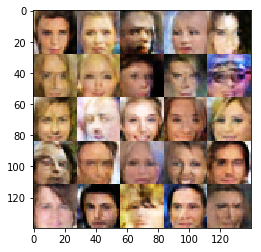

Epoch 2/2... Discriminator Loss: 0.9773... Generator Loss: 1.3336
Epoch 2/2... Discriminator Loss: 0.8037... Generator Loss: 1.2590
Epoch 2/2... Discriminator Loss: 0.9650... Generator Loss: 0.9313
Epoch 2/2... Discriminator Loss: 0.8925... Generator Loss: 1.4902
Epoch 2/2... Discriminator Loss: 0.9162... Generator Loss: 1.1942
Epoch 2/2... Discriminator Loss: 1.1313... Generator Loss: 1.6685
Epoch 2/2... Discriminator Loss: 1.1806... Generator Loss: 0.8944
Epoch 2/2... Discriminator Loss: 1.0090... Generator Loss: 1.4309
Epoch 2/2... Discriminator Loss: 0.8716... Generator Loss: 1.4847
Epoch 2/2... Discriminator Loss: 0.9741... Generator Loss: 1.4128


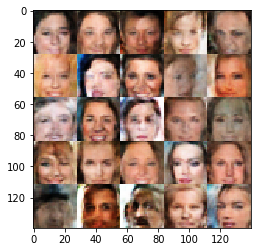

Epoch 2/2... Discriminator Loss: 0.9262... Generator Loss: 1.2740
Epoch 2/2... Discriminator Loss: 0.8653... Generator Loss: 1.6596
Epoch 2/2... Discriminator Loss: 0.7827... Generator Loss: 1.6515
Epoch 2/2... Discriminator Loss: 0.9573... Generator Loss: 0.7530
Epoch 2/2... Discriminator Loss: 1.2720... Generator Loss: 1.0691
Epoch 2/2... Discriminator Loss: 1.1127... Generator Loss: 2.2082
Epoch 2/2... Discriminator Loss: 1.1235... Generator Loss: 1.0686
Epoch 2/2... Discriminator Loss: 0.9894... Generator Loss: 1.5229
Epoch 2/2... Discriminator Loss: 0.9311... Generator Loss: 1.4209
Epoch 2/2... Discriminator Loss: 1.1291... Generator Loss: 1.5748


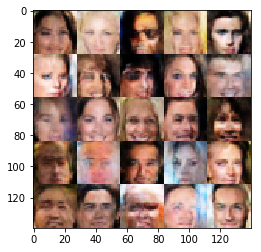

Epoch 2/2... Discriminator Loss: 0.7881... Generator Loss: 1.5938
Epoch 2/2... Discriminator Loss: 0.8432... Generator Loss: 1.2188
Epoch 2/2... Discriminator Loss: 1.0094... Generator Loss: 1.6582
Epoch 2/2... Discriminator Loss: 0.7664... Generator Loss: 1.3335
Epoch 2/2... Discriminator Loss: 0.7180... Generator Loss: 2.8763
Epoch 2/2... Discriminator Loss: 1.0144... Generator Loss: 1.2827
Epoch 2/2... Discriminator Loss: 1.2115... Generator Loss: 1.0306
Epoch 2/2... Discriminator Loss: 0.9369... Generator Loss: 1.0785
Epoch 2/2... Discriminator Loss: 1.2951... Generator Loss: 0.8427
Epoch 2/2... Discriminator Loss: 0.9842... Generator Loss: 0.9411


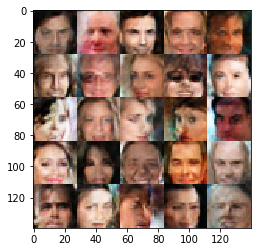

Epoch 2/2... Discriminator Loss: 0.9033... Generator Loss: 0.9092
Epoch 2/2... Discriminator Loss: 0.9954... Generator Loss: 1.1251
Epoch 2/2... Discriminator Loss: 0.9081... Generator Loss: 1.5677
Epoch 2/2... Discriminator Loss: 0.8076... Generator Loss: 1.5985
Epoch 2/2... Discriminator Loss: 0.9200... Generator Loss: 1.6493
Epoch 2/2... Discriminator Loss: 1.2402... Generator Loss: 1.0523
Epoch 2/2... Discriminator Loss: 0.8044... Generator Loss: 1.0703
Epoch 2/2... Discriminator Loss: 0.7630... Generator Loss: 1.8513
Epoch 2/2... Discriminator Loss: 1.0200... Generator Loss: 1.0149
Epoch 2/2... Discriminator Loss: 0.9032... Generator Loss: 1.6302


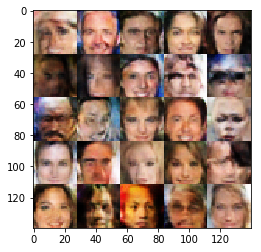

Epoch 2/2... Discriminator Loss: 0.9550... Generator Loss: 1.1978
Epoch 2/2... Discriminator Loss: 0.9662... Generator Loss: 1.3692
Epoch 2/2... Discriminator Loss: 0.8640... Generator Loss: 1.8035
Epoch 2/2... Discriminator Loss: 0.8143... Generator Loss: 2.0753
Epoch 2/2... Discriminator Loss: 0.7544... Generator Loss: 1.7090
Epoch 2/2... Discriminator Loss: 0.9447... Generator Loss: 1.0011
Epoch 2/2... Discriminator Loss: 1.0548... Generator Loss: 1.8470
Epoch 2/2... Discriminator Loss: 0.6682... Generator Loss: 1.4650
Epoch 2/2... Discriminator Loss: 1.1609... Generator Loss: 1.4958
Epoch 2/2... Discriminator Loss: 1.1058... Generator Loss: 1.2582


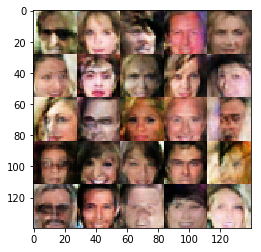

Epoch 2/2... Discriminator Loss: 0.9082... Generator Loss: 1.9409
Epoch 2/2... Discriminator Loss: 1.1409... Generator Loss: 1.1740
Epoch 2/2... Discriminator Loss: 1.2328... Generator Loss: 0.8247
Epoch 2/2... Discriminator Loss: 0.9131... Generator Loss: 1.6527
Epoch 2/2... Discriminator Loss: 1.1108... Generator Loss: 0.9656
Epoch 2/2... Discriminator Loss: 0.9207... Generator Loss: 1.3442
Epoch 2/2... Discriminator Loss: 1.0371... Generator Loss: 1.4526
Epoch 2/2... Discriminator Loss: 0.9774... Generator Loss: 1.6899
Epoch 2/2... Discriminator Loss: 0.8173... Generator Loss: 1.3904
Epoch 2/2... Discriminator Loss: 1.1399... Generator Loss: 1.4416


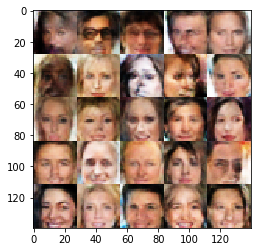

Epoch 2/2... Discriminator Loss: 1.1030... Generator Loss: 1.4833
Epoch 2/2... Discriminator Loss: 0.9316... Generator Loss: 1.0679
Epoch 2/2... Discriminator Loss: 0.7789... Generator Loss: 1.8353
Epoch 2/2... Discriminator Loss: 0.9734... Generator Loss: 1.0252
Epoch 2/2... Discriminator Loss: 1.1028... Generator Loss: 1.0197
Epoch 2/2... Discriminator Loss: 0.9208... Generator Loss: 1.3683
Epoch 2/2... Discriminator Loss: 1.0750... Generator Loss: 1.1521
Epoch 2/2... Discriminator Loss: 0.9051... Generator Loss: 1.1001
Epoch 2/2... Discriminator Loss: 1.0601... Generator Loss: 1.2194
Epoch 2/2... Discriminator Loss: 1.0448... Generator Loss: 1.3800


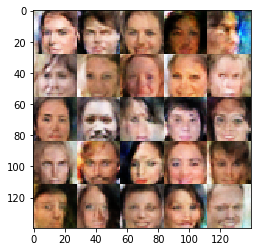

Epoch 2/2... Discriminator Loss: 0.8832... Generator Loss: 1.4748
Epoch 2/2... Discriminator Loss: 1.1841... Generator Loss: 0.9788
Epoch 2/2... Discriminator Loss: 1.0308... Generator Loss: 1.3362
Epoch 2/2... Discriminator Loss: 0.8980... Generator Loss: 1.3442
Epoch 2/2... Discriminator Loss: 0.8796... Generator Loss: 1.6763
Epoch 2/2... Discriminator Loss: 1.0121... Generator Loss: 1.0849
Epoch 2/2... Discriminator Loss: 0.8342... Generator Loss: 1.1168
Epoch 2/2... Discriminator Loss: 0.8890... Generator Loss: 1.5764
Epoch 2/2... Discriminator Loss: 0.9559... Generator Loss: 1.4518
Epoch 2/2... Discriminator Loss: 0.9841... Generator Loss: 0.9301


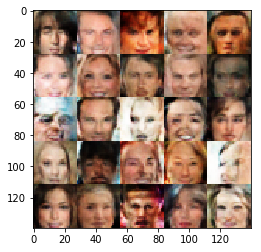

Epoch 2/2... Discriminator Loss: 0.9157... Generator Loss: 1.3254
Epoch 2/2... Discriminator Loss: 1.1299... Generator Loss: 1.1067
Epoch 2/2... Discriminator Loss: 1.0118... Generator Loss: 1.9209
Epoch 2/2... Discriminator Loss: 0.8359... Generator Loss: 1.8735
Epoch 2/2... Discriminator Loss: 0.9163... Generator Loss: 1.8702
Epoch 2/2... Discriminator Loss: 1.0311... Generator Loss: 1.0852
Epoch 2/2... Discriminator Loss: 0.9419... Generator Loss: 1.1517
Epoch 2/2... Discriminator Loss: 0.9019... Generator Loss: 1.5135
Epoch 2/2... Discriminator Loss: 0.9505... Generator Loss: 1.4181
Epoch 2/2... Discriminator Loss: 0.7656... Generator Loss: 1.2122


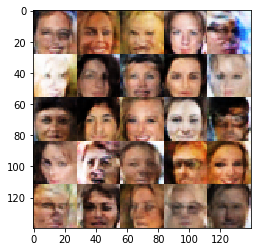

Epoch 2/2... Discriminator Loss: 0.7159... Generator Loss: 1.6993
Epoch 2/2... Discriminator Loss: 0.9452... Generator Loss: 1.6086
Epoch 2/2... Discriminator Loss: 0.8595... Generator Loss: 1.4539
Epoch 2/2... Discriminator Loss: 0.8799... Generator Loss: 1.5127
Epoch 2/2... Discriminator Loss: 0.9927... Generator Loss: 0.9992
Epoch 2/2... Discriminator Loss: 0.8619... Generator Loss: 1.2014
Epoch 2/2... Discriminator Loss: 0.9235... Generator Loss: 1.1458
Epoch 2/2... Discriminator Loss: 0.7779... Generator Loss: 1.7660
Epoch 2/2... Discriminator Loss: 0.7716... Generator Loss: 1.3076
Epoch 2/2... Discriminator Loss: 0.8789... Generator Loss: 1.6557


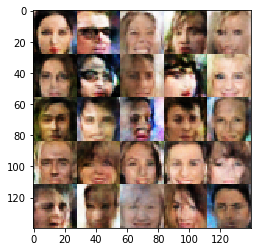

Epoch 2/2... Discriminator Loss: 1.2359... Generator Loss: 2.0732
Epoch 2/2... Discriminator Loss: 1.3807... Generator Loss: 0.9875
Epoch 2/2... Discriminator Loss: 0.8553... Generator Loss: 1.5628
Epoch 2/2... Discriminator Loss: 1.3492... Generator Loss: 0.7414
Epoch 2/2... Discriminator Loss: 1.0129... Generator Loss: 1.3706
Epoch 2/2... Discriminator Loss: 0.9583... Generator Loss: 1.5138
Epoch 2/2... Discriminator Loss: 1.1313... Generator Loss: 1.7774
Epoch 2/2... Discriminator Loss: 0.8958... Generator Loss: 1.4498
Epoch 2/2... Discriminator Loss: 0.9875... Generator Loss: 1.6845
Epoch 2/2... Discriminator Loss: 0.7723... Generator Loss: 2.1596


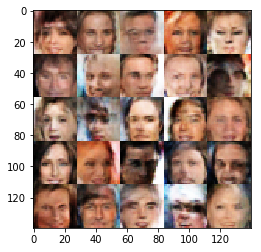

Epoch 2/2... Discriminator Loss: 0.9235... Generator Loss: 1.4905
Epoch 2/2... Discriminator Loss: 0.9142... Generator Loss: 2.1275
Epoch 2/2... Discriminator Loss: 0.8405... Generator Loss: 1.9169
Epoch 2/2... Discriminator Loss: 0.9182... Generator Loss: 1.8146
Epoch 2/2... Discriminator Loss: 0.9596... Generator Loss: 1.8397
Epoch 2/2... Discriminator Loss: 0.9078... Generator Loss: 1.9617
Epoch 2/2... Discriminator Loss: 1.1333... Generator Loss: 0.7908
Epoch 2/2... Discriminator Loss: 1.0075... Generator Loss: 1.1072
Epoch 2/2... Discriminator Loss: 0.8973... Generator Loss: 1.6074
Epoch 2/2... Discriminator Loss: 1.3562... Generator Loss: 0.7611


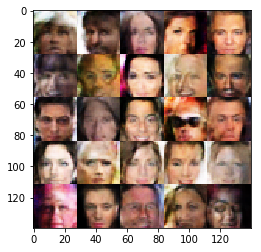

Epoch 2/2... Discriminator Loss: 0.8257... Generator Loss: 1.6514
Epoch 2/2... Discriminator Loss: 0.8759... Generator Loss: 1.6468
Epoch 2/2... Discriminator Loss: 1.1255... Generator Loss: 1.0098
Epoch 2/2... Discriminator Loss: 1.0683... Generator Loss: 1.2453
Epoch 2/2... Discriminator Loss: 1.0207... Generator Loss: 1.6582
Epoch 2/2... Discriminator Loss: 0.9395... Generator Loss: 1.7171
Epoch 2/2... Discriminator Loss: 0.8022... Generator Loss: 1.6924
Epoch 2/2... Discriminator Loss: 0.9671... Generator Loss: 1.6202
Epoch 2/2... Discriminator Loss: 0.8749... Generator Loss: 1.7047
Epoch 2/2... Discriminator Loss: 1.1411... Generator Loss: 1.1666


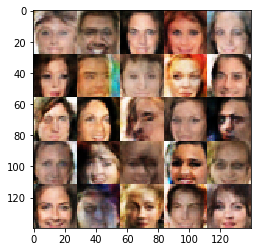

Epoch 2/2... Discriminator Loss: 0.8491... Generator Loss: 1.6307
Epoch 2/2... Discriminator Loss: 0.8602... Generator Loss: 1.1671
Epoch 2/2... Discriminator Loss: 0.8112... Generator Loss: 1.8049
Epoch 2/2... Discriminator Loss: 0.8317... Generator Loss: 1.0087
Epoch 2/2... Discriminator Loss: 1.1889... Generator Loss: 1.9556
Epoch 2/2... Discriminator Loss: 0.9613... Generator Loss: 1.3597
Epoch 2/2... Discriminator Loss: 0.7792... Generator Loss: 1.5216
Epoch 2/2... Discriminator Loss: 0.9036... Generator Loss: 0.9925
Epoch 2/2... Discriminator Loss: 0.8222... Generator Loss: 1.5893
Epoch 2/2... Discriminator Loss: 0.9922... Generator Loss: 2.1550


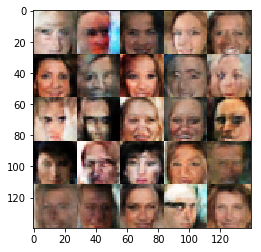

Epoch 2/2... Discriminator Loss: 1.0344... Generator Loss: 1.1023
Epoch 2/2... Discriminator Loss: 0.9376... Generator Loss: 1.0745
Epoch 2/2... Discriminator Loss: 1.0226... Generator Loss: 1.4359
Epoch 2/2... Discriminator Loss: 0.8320... Generator Loss: 1.4448
Epoch 2/2... Discriminator Loss: 0.7803... Generator Loss: 1.3620
Epoch 2/2... Discriminator Loss: 0.9303... Generator Loss: 2.1601
Epoch 2/2... Discriminator Loss: 1.0922... Generator Loss: 2.0584
Epoch 2/2... Discriminator Loss: 0.9205... Generator Loss: 1.2088
Epoch 2/2... Discriminator Loss: 0.8364... Generator Loss: 1.8446
Epoch 2/2... Discriminator Loss: 0.7398... Generator Loss: 1.6593


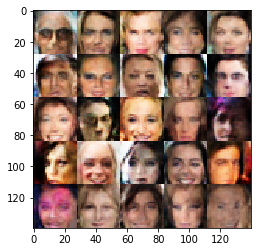

Epoch 2/2... Discriminator Loss: 0.8773... Generator Loss: 1.2459
Epoch 2/2... Discriminator Loss: 0.7661... Generator Loss: 1.4255
Epoch 2/2... Discriminator Loss: 1.2980... Generator Loss: 0.9220
Epoch 2/2... Discriminator Loss: 0.8367... Generator Loss: 1.2397
Epoch 2/2... Discriminator Loss: 1.4113... Generator Loss: 0.6588
Epoch 2/2... Discriminator Loss: 0.9230... Generator Loss: 1.5310
Epoch 2/2... Discriminator Loss: 0.9224... Generator Loss: 1.3018
Epoch 2/2... Discriminator Loss: 0.8238... Generator Loss: 1.5865
Epoch 2/2... Discriminator Loss: 1.0635... Generator Loss: 1.1645
Epoch 2/2... Discriminator Loss: 0.9787... Generator Loss: 1.9341


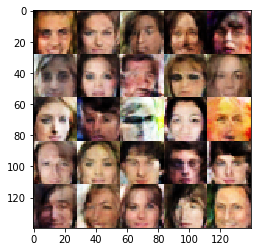

Epoch 2/2... Discriminator Loss: 1.0207... Generator Loss: 0.8674
Epoch 2/2... Discriminator Loss: 1.0510... Generator Loss: 1.3066
Epoch 2/2... Discriminator Loss: 0.8723... Generator Loss: 0.8225
Epoch 2/2... Discriminator Loss: 0.9549... Generator Loss: 1.1193
Epoch 2/2... Discriminator Loss: 0.8921... Generator Loss: 1.7181
Epoch 2/2... Discriminator Loss: 0.8023... Generator Loss: 1.6899
Epoch 2/2... Discriminator Loss: 0.7689... Generator Loss: 1.7560
Epoch 2/2... Discriminator Loss: 1.0325... Generator Loss: 1.4742
Epoch 2/2... Discriminator Loss: 1.0202... Generator Loss: 1.8476
Epoch 2/2... Discriminator Loss: 0.8862... Generator Loss: 1.1547


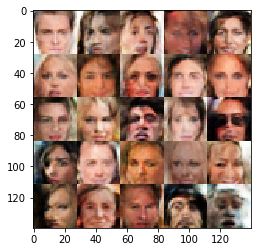

Epoch 2/2... Discriminator Loss: 0.7701... Generator Loss: 1.5386
Epoch 2/2... Discriminator Loss: 0.8975... Generator Loss: 1.7902
Epoch 2/2... Discriminator Loss: 0.9295... Generator Loss: 1.3528
Epoch 2/2... Discriminator Loss: 1.1456... Generator Loss: 1.7081
Epoch 2/2... Discriminator Loss: 0.9896... Generator Loss: 1.8370
Epoch 2/2... Discriminator Loss: 0.8071... Generator Loss: 1.4282
Epoch 2/2... Discriminator Loss: 0.9315... Generator Loss: 0.9950
Epoch 2/2... Discriminator Loss: 0.8995... Generator Loss: 1.3702
Epoch 2/2... Discriminator Loss: 0.8055... Generator Loss: 1.6387
Epoch 2/2... Discriminator Loss: 1.0278... Generator Loss: 1.1212


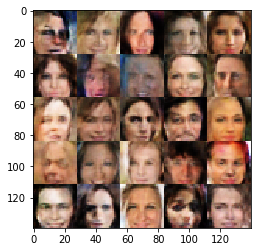

Epoch 2/2... Discriminator Loss: 1.0556... Generator Loss: 1.2791
Epoch 2/2... Discriminator Loss: 0.8743... Generator Loss: 1.0387
Epoch 2/2... Discriminator Loss: 0.9497... Generator Loss: 1.4915
Epoch 2/2... Discriminator Loss: 0.9054... Generator Loss: 1.9973
Epoch 2/2... Discriminator Loss: 0.8384... Generator Loss: 1.4740
Epoch 2/2... Discriminator Loss: 0.9657... Generator Loss: 1.7836
Epoch 2/2... Discriminator Loss: 0.8985... Generator Loss: 1.5203
Epoch 2/2... Discriminator Loss: 0.8392... Generator Loss: 1.5240
Epoch 2/2... Discriminator Loss: 1.4100... Generator Loss: 0.6320
Epoch 2/2... Discriminator Loss: 0.9638... Generator Loss: 0.8951


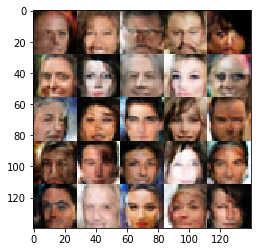

Epoch 2/2... Discriminator Loss: 0.9145... Generator Loss: 1.0320
Epoch 2/2... Discriminator Loss: 0.8521... Generator Loss: 1.4785
Epoch 2/2... Discriminator Loss: 0.8649... Generator Loss: 1.5687
Epoch 2/2... Discriminator Loss: 0.7985... Generator Loss: 1.2498
Epoch 2/2... Discriminator Loss: 1.0981... Generator Loss: 2.2464
Epoch 2/2... Discriminator Loss: 0.7275... Generator Loss: 1.6894
Epoch 2/2... Discriminator Loss: 0.9254... Generator Loss: 1.6983
Epoch 2/2... Discriminator Loss: 0.8900... Generator Loss: 1.3982
Epoch 2/2... Discriminator Loss: 1.5803... Generator Loss: 0.7007
Epoch 2/2... Discriminator Loss: 0.8987... Generator Loss: 1.7945


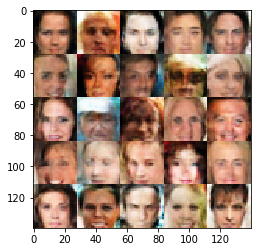

Epoch 2/2... Discriminator Loss: 0.9107... Generator Loss: 1.1181
Epoch 2/2... Discriminator Loss: 0.8075... Generator Loss: 1.2665
Epoch 2/2... Discriminator Loss: 0.9712... Generator Loss: 1.7906
Epoch 2/2... Discriminator Loss: 1.0287... Generator Loss: 1.1130
Epoch 2/2... Discriminator Loss: 1.3112... Generator Loss: 0.7980
Epoch 2/2... Discriminator Loss: 1.7423... Generator Loss: 0.7537
Epoch 2/2... Discriminator Loss: 0.7382... Generator Loss: 1.9008
Epoch 2/2... Discriminator Loss: 0.9240... Generator Loss: 1.5822
Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 1.6900
Epoch 2/2... Discriminator Loss: 1.0567... Generator Loss: 1.0212


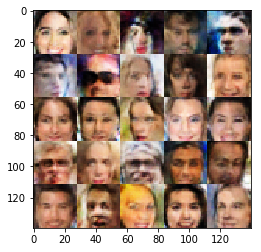

Epoch 2/2... Discriminator Loss: 1.0964... Generator Loss: 0.9767
Epoch 2/2... Discriminator Loss: 0.9855... Generator Loss: 2.0522
Epoch 2/2... Discriminator Loss: 0.8917... Generator Loss: 1.2123
Epoch 2/2... Discriminator Loss: 0.9234... Generator Loss: 1.0879
Epoch 2/2... Discriminator Loss: 1.0099... Generator Loss: 1.0208
Epoch 2/2... Discriminator Loss: 0.8547... Generator Loss: 1.3435


In [16]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.